In [2]:
import numpy as np
from numba import jit
import time
import matplotlib.pyplot as plt
import ctypes
import os

TESTS_AMOUNT = 10

# Реализация на Python с использованием Numba

In [3]:
@jit(nopython=True)
def firefly_algorithm(function, dimensions, bounds_array,
                      fireflies_number,
                      max_iteration, alpha, beta,
                      random_movement_possibilities=10):
    # Initialize the swarm:
    fireflies = []

    for firefly_number in range(fireflies_number):
        new_firefly = []
        for dimension_number in range(dimensions):
            parameter = np.random.uniform(bounds_array[dimension_number][0],
                                          bounds_array[dimension_number][1])
            new_firefly.append(parameter)
        fireflies.append(new_firefly)

    fireflies = np.array(fireflies)
    intensities = []

    for firefly in fireflies:
        intensities.append(function(firefly))
    intensities = np.array(intensities)
    # print(fireflies)

    best_values = np.array([0.0 for i in range(max_iteration)])

    # Main loop
    for iteration in range(max_iteration):
        for i in range(fireflies_number):
            has_moved = False
            for j in range(fireflies_number):
                if intensities[j] > intensities[i]:  # Moving firefly
                    distance = np.sum(np.square(fireflies[i] - fireflies[j]),
                                      axis=-1)
                    a0 = intensities[j] / intensities[i] if \
                        intensities[i] != 0.0 else 1.0
                    new_position = fireflies[i] + a0 * np.exp(
                        -beta * distance) * (
                                           fireflies[j] - fireflies[i]) + (
                                           alpha * np.random.rand(dimensions))
                    for dimension_number in range(dimensions):
                        if new_position[dimension_number] > \
                                bounds_array[dimension_number][1]:
                            new_position[dimension_number] = \
                                bounds_array[dimension_number][1]
                        elif new_position[dimension_number] < \
                                bounds_array[dimension_number][0]:
                            new_position[dimension_number] = \
                                bounds_array[dimension_number][0]
                    fireflies[i] = new_position
                    intensities[i] = function(new_position)
                    has_moved = True
            if not has_moved:
                for random_try in range(random_movement_possibilities):
                    random_direction = np.random.rand(dimensions)
                    new_possible_position = fireflies[
                                                i] + alpha * random_direction
                    for dimension_number in range(dimensions):
                        if new_possible_position[dimension_number] > \
                                bounds_array[dimension_number][1]:
                            new_possible_position[dimension_number] = \
                                bounds_array[dimension_number][1]
                        elif new_possible_position[dimension_number] < \
                                bounds_array[dimension_number][0]:
                            new_possible_position[dimension_number] = \
                                bounds_array[dimension_number][0]
                    new_possible_intensity = function(new_possible_position)
                    if new_possible_intensity > intensities[i]:
                        # If new position is brighter
                        fireflies[i] = new_possible_position
                        intensities[i] = new_possible_intensity
                        break
        best_values[iteration] = np.max(intensities)
        # If we didn't find any better direction, we left this firefly

    best_intensity = intensities[0]
    best_solution = fireflies[0]

    for number, intensity in enumerate(intensities):
        if intensity > best_intensity:
            best_intensity = intensity
            best_solution = fireflies[number]

    return best_solution, best_intensity, best_values

In [4]:
@jit(nopython=True)
def firefly_algorithm_performance_graph(function, dimensions, bounds_array, fireflies_number,
                      max_iteration, alpha, beta,
                      random_movement_possibilities=10):
    # Initialize the swarm:
    fireflies = []

    for firefly_number in range(fireflies_number):
        new_firefly = []
        for dimension_number in range(dimensions):
            parameter = np.random.uniform(bounds_array[dimension_number][0],
                                          bounds_array[dimension_number][1])
            new_firefly.append(parameter)
        fireflies.append(new_firefly)

    fireflies = np.array(fireflies)
    intensities = []

    for firefly in fireflies:
        intensities.append(function(firefly))
    intensities = np.array(intensities)
    # print(fireflies)
    
    best_values = []

    # Main loop
    for iteration in range(max_iteration):
        for i in range(fireflies_number):
            has_moved = False
            for j in range(fireflies_number):
                if intensities[j] > intensities[i]:  # Moving firefly
                    distance = np.sum(np.square(fireflies[i] - fireflies[j]),
                                      axis=-1)
                    a0 = intensities[j] / intensities[i] if \
                        intensities[i] != 0.0 else 1.0
                    new_position = fireflies[i] + a0 * np.exp(
                        -beta * distance) * (
                                           fireflies[j] - fireflies[i]) + (
                                           alpha * np.random.rand(dimensions))
                    for dimension_number in range(dimensions):
                        if new_position[dimension_number] > \
                                bounds_array[dimension_number][1]:
                            new_position[dimension_number] = \
                                bounds_array[dimension_number][1]
                        elif new_position[dimension_number] < \
                                bounds_array[dimension_number][0]:
                            new_position[dimension_number] = \
                                bounds_array[dimension_number][0]
                    fireflies[i] = new_position
                    intensities[i] = function(new_position)
                    has_moved = True
            if not has_moved:
                for random_try in range(random_movement_possibilities):
                    random_direction = np.random.rand(dimensions)
                    new_possible_position = fireflies[
                                                i] + alpha * random_direction
                    for dimension_number in range(dimensions):
                        if new_possible_position[dimension_number] > \
                                bounds_array[dimension_number][1]:
                            new_possible_position[dimension_number] = \
                                bounds_array[dimension_number][1]
                        elif new_possible_position[dimension_number] < \
                                bounds_array[dimension_number][0]:
                            new_possible_position[dimension_number] = \
                                bounds_array[dimension_number][0]
                    new_possible_intensity = function(new_possible_position)
                    if new_possible_intensity > intensities[i]:
                        # If new position is brighter
                        fireflies[i] = new_possible_position
                        intensities[i] = new_possible_intensity
                        break
                # If we didn't find any better direction, we left this firefly

    best_intensity = intensities[0]
    best_solution = fireflies[0]

    for number, intensity in enumerate(intensities):
        if intensity > best_intensity:
            best_intensity = intensity
            best_solution = fireflies[number]

    return best_solution, best_intensity


In [5]:
def draw_graphic(best_values, iterations_number, function_name):
    x = np.array([i for i in range(1, iterations_number + 1)])
    plt.title("Performance of " + function_name)
    plt.xlabel("Iteration number")
    plt.ylabel("Functional value")
    plt.plot(x, best_values)
    plt.grid(color="green", linestyle="--", linewidth=0.5)
    plt.show()

In [6]:
def draw_distribution_graphic(best_values, tests_number, function_name):
    x = np.array([i for i in range(1, tests_number + 1)])
    plt.title("Distribution of " + function_name)
    plt.xlabel("Test number")
    plt.ylabel("Best found value")
    plt.scatter(x, best_values, c="blue")
    average = np.average(best_values)
    dispersion = np.sqrt(np.var(best_values))
    average_list = [average for i in range(1, tests_number + 1)]
    plt.plot(x, average_list, c="red")
    plt.fill_between(x, average_list - dispersion, average_list + dispersion, color="red", alpha=0.2)
    plt.show()

In [7]:
def perform_test(function_name, function, min_argument, max_argument, fireflies_number, iterations_number, alpha, beta, draw_graph=True):
    bonds = [(min_argument, max_argument), (min_argument, max_argument)]

    start_time = time.perf_counter_ns()
    best_solution, best_intensity, best_values = firefly_algorithm(function, 2,
                                                      np.array(bonds),
                                                      fireflies_number, iterations_number, alpha, beta)
    time_elapsed = time.perf_counter_ns() - start_time
    print("Best solution found is: ", best_solution)
    print("And function result for this solution is: ", best_intensity)
    print("Totally elapsed ", time_elapsed / 1_000_000_000, " seconds")
    if draw_graph:
        draw_graphic(best_values, iterations_number, function_name)
    return best_intensity, time_elapsed / 1_000_000_000

## Тестирование функции Де Джонга

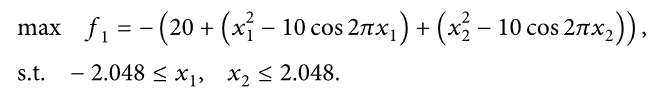

In [8]:
@jit(nopython=True)
def second_de_jong_function(arguments):
    return -1.0 * ( 20 + (np.power(arguments[0], 2) - 10*(np.cos(2*np.pi * arguments[0]))) + (np.power(arguments[1], 2) - 10*(np.cos(2*np.pi * arguments[1]))))

-->Test number 0
Best solution found is:  [0.996658   0.04042012]
And function result for this solution is:  -1.3179322536365934
Totally elapsed  5.8806039  seconds


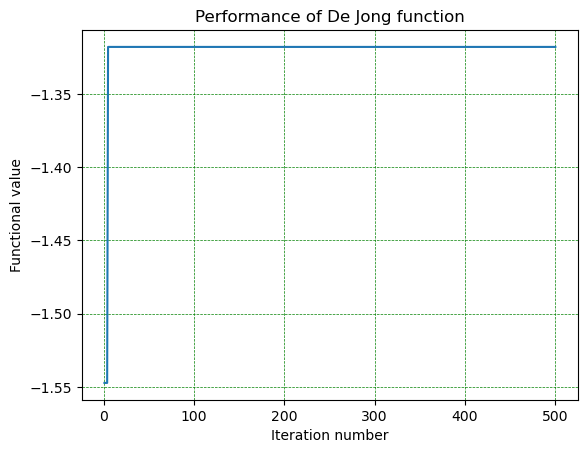

-->Test number 1
Best solution found is:  [0.00221744 1.00503829]
And function result for this solution is:  -1.0160877167159779
Totally elapsed  0.5555335  seconds


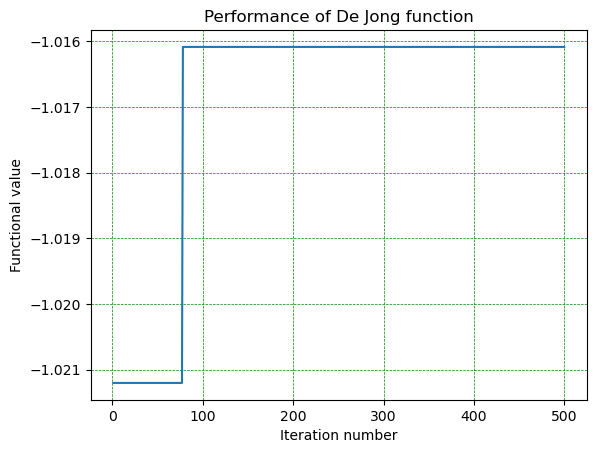

-->Test number 2
Best solution found is:  [0.99295103 0.03880508]
And function result for this solution is:  -1.293034095491933
Totally elapsed  0.6942446  seconds


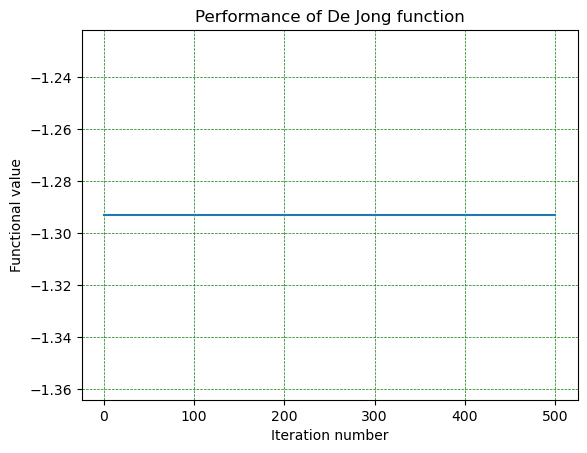

-->Test number 3
Best solution found is:  [ 0.03799719 -0.00583184]
And function result for this solution is:  -0.2918313033494382
Totally elapsed  0.1989457  seconds


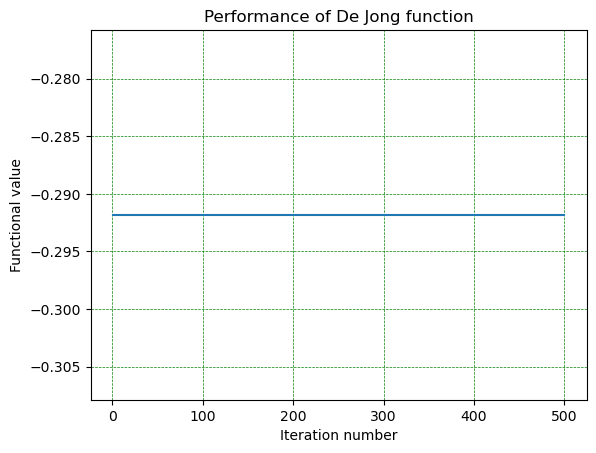

-->Test number 4
Best solution found is:  [0.02901127 1.00005666]
And function result for this solution is:  -1.1666318801638251
Totally elapsed  0.7782129  seconds


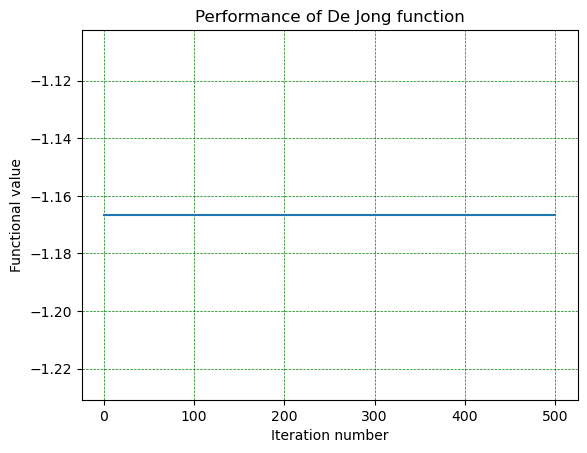

-->Test number 5
Best solution found is:  [0.00234726 1.03026003]
And function result for this solution is:  -1.2427308731393492
Totally elapsed  0.6056897  seconds


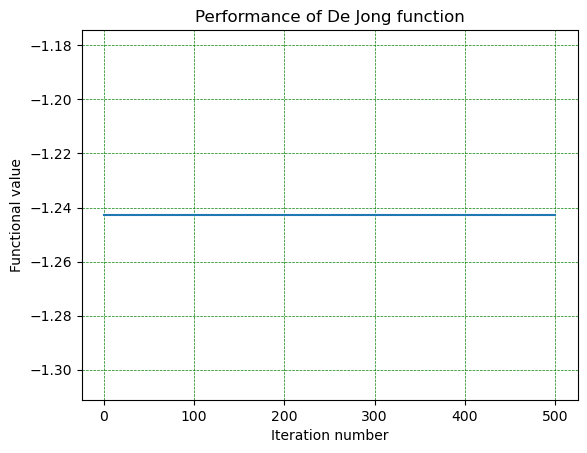

-->Test number 6
Best solution found is:  [0.0067092  0.05134429]
And function result for this solution is:  -0.5274398705081715
Totally elapsed  0.3156705  seconds


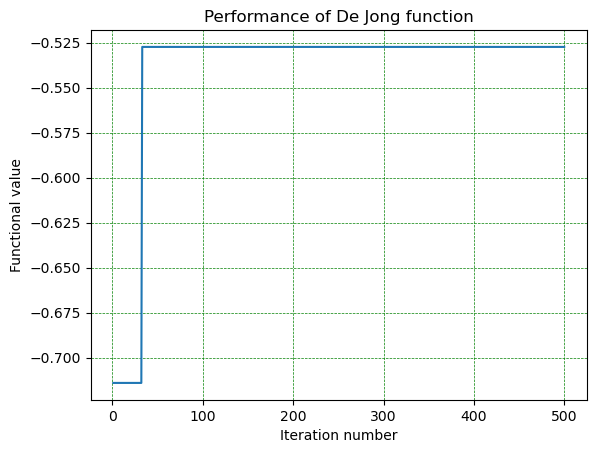

-->Test number 7
Best solution found is:  [0.06155624 0.00467487]
And function result for this solution is:  -0.7467994139387972
Totally elapsed  0.294707  seconds


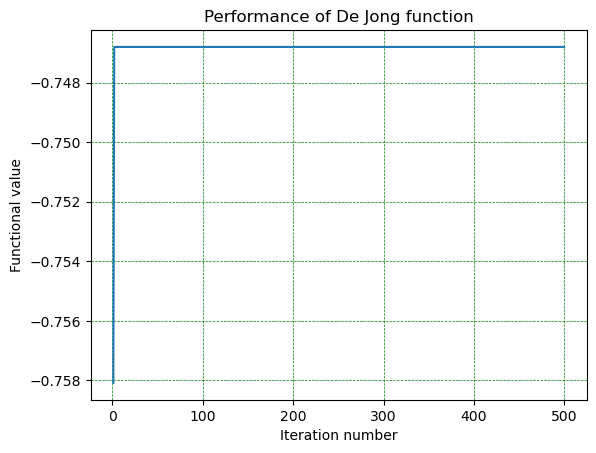

-->Test number 8
Best solution found is:  [0.04752666 0.05010285]
And function result for this solution is:  -0.9387652305980243
Totally elapsed  0.3488382  seconds


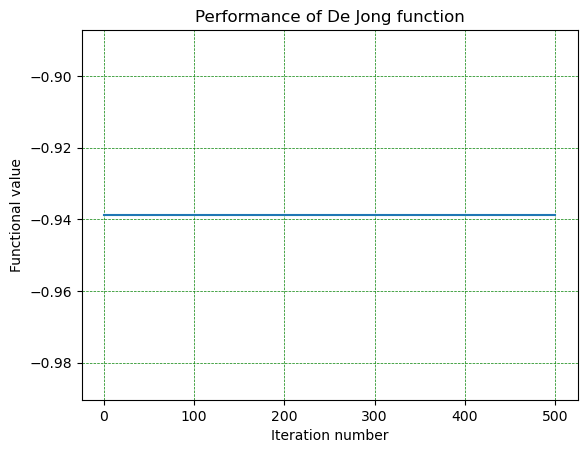

-->Test number 9
Best solution found is:  [ 0.02254563 -0.00720272]
And function result for this solution is:  -0.11096680949261817
Totally elapsed  0.1244593  seconds


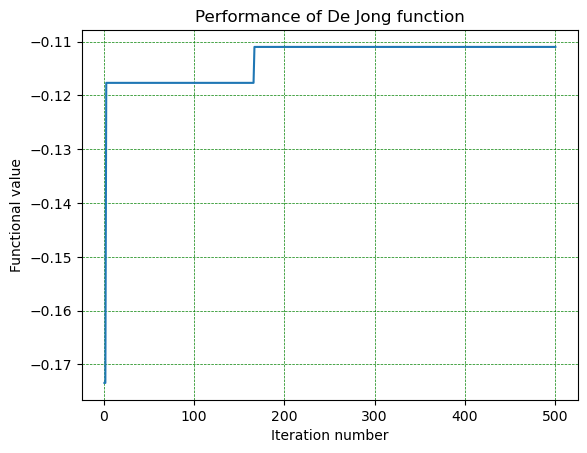

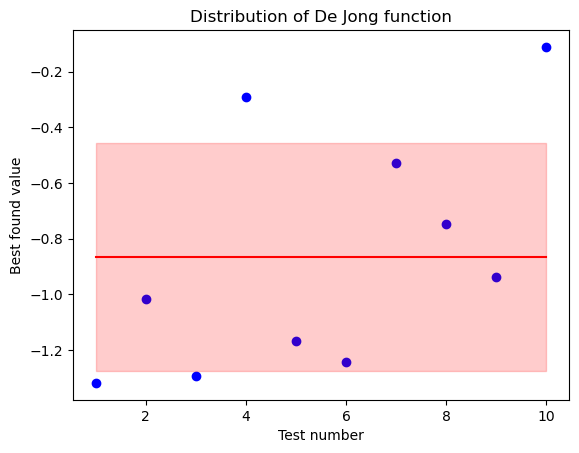

Dispersion is 0.167529815850941


In [9]:
function_name = "De Jong function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_de_jong_function_python_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_test(function_name, second_de_jong_function, -2.048, 2.048, 100, 500, 0.4, 0.3, draw_graph=True)
    average_de_jong_function_python_time += time_elapsed
    best_values[test_number] = best_value
average_de_jong_function_python_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Тестирование функции Есома

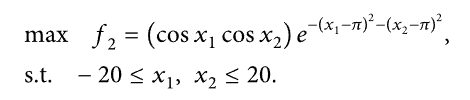

In [10]:
@jit(nopython=True)
def esom_function(arguments):
    return (np.cos(arguments[0]) * np.cos(arguments[1]) * np.exp(
        -1 * np.power((arguments[0] - np.pi), 2) - np.power(
            (arguments[1] - np.pi), 2)))

-->Test number 0
Best solution found is:  [1.36339727 5.22655557]
And function result for this solution is:  5.550690213968871e-05
Totally elapsed  3.4104927  seconds


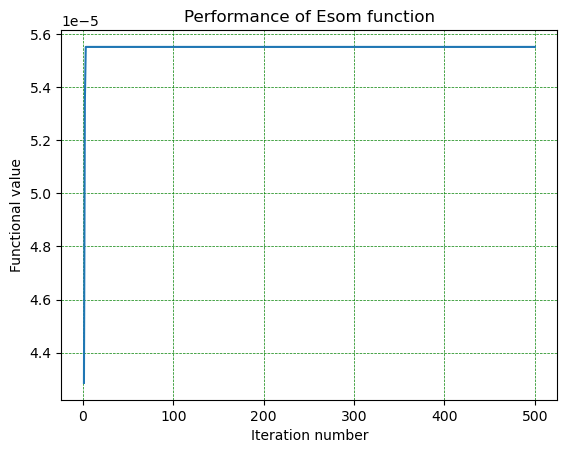

-->Test number 1
Best solution found is:  [3.15468464 3.15743937]
And function result for this solution is:  0.9993664150290296
Totally elapsed  1.5856283  seconds


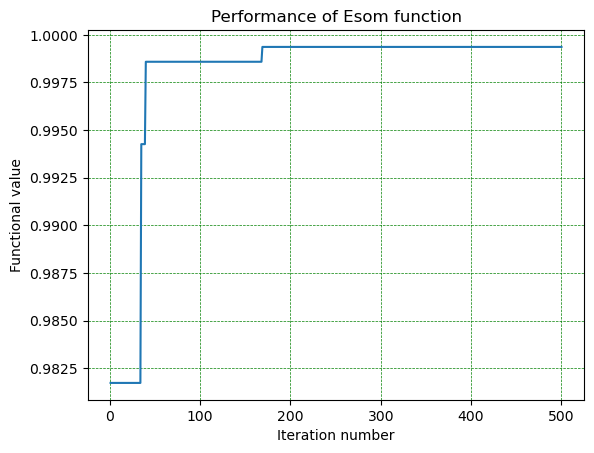

-->Test number 2
Best solution found is:  [3.1264749  3.18276449]
And function result for this solution is:  0.9971184165985296
Totally elapsed  2.3469605  seconds


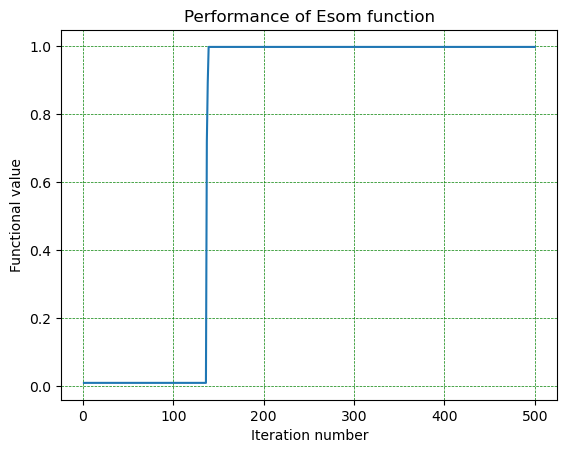

-->Test number 3
Best solution found is:  [3.12392596 4.62319955]
And function result for this solution is:  0.009912624833193816
Totally elapsed  1.8031798  seconds


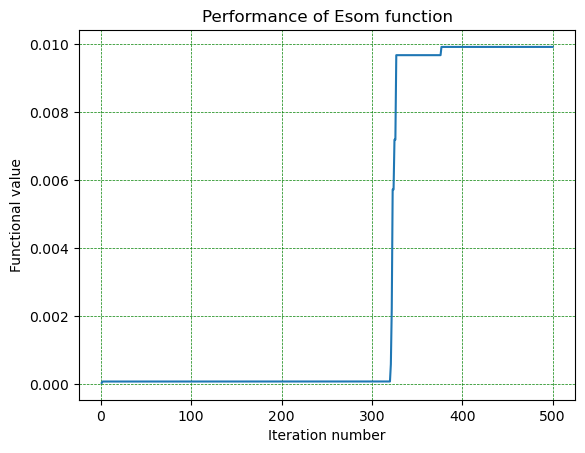

-->Test number 4
Best solution found is:  [3.22223116 3.13324595]
And function result for this solution is:  0.9901865845357946
Totally elapsed  2.4167417  seconds


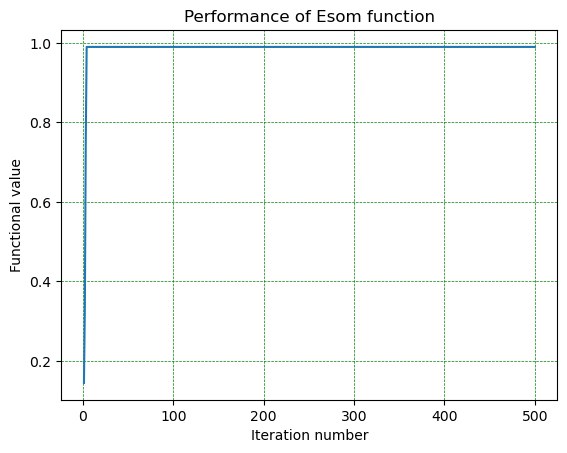

-->Test number 5
Best solution found is:  [3.1897492  4.63013723]
And function result for this solution is:  0.008929967946748057
Totally elapsed  2.415215  seconds


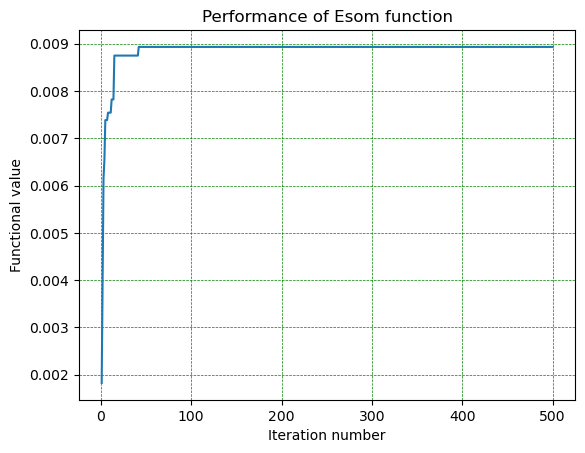

-->Test number 6
Best solution found is:  [3.29813795 3.15072418]
And function result for this solution is:  0.9637386789043563
Totally elapsed  1.1063235  seconds


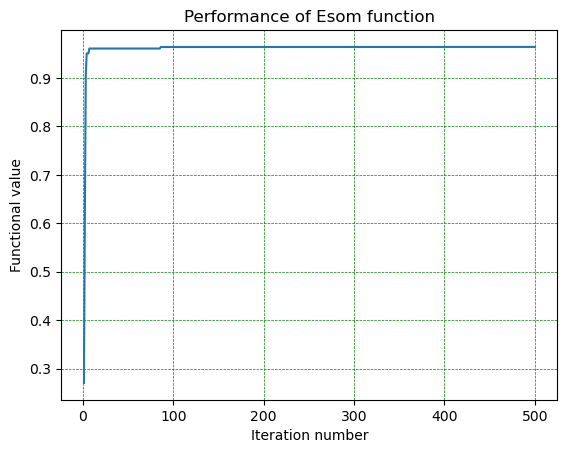

-->Test number 7
Best solution found is:  [3.13186968 3.89803658]
And function result for this solution is:  0.41033097127442897
Totally elapsed  2.498956  seconds


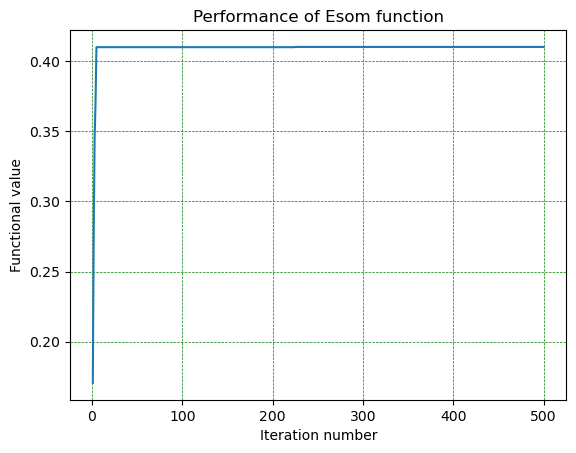

-->Test number 8
Best solution found is:  [3.58719771 3.1627054 ]
And function result for this solution is:  0.7393489617846101
Totally elapsed  0.7909493  seconds


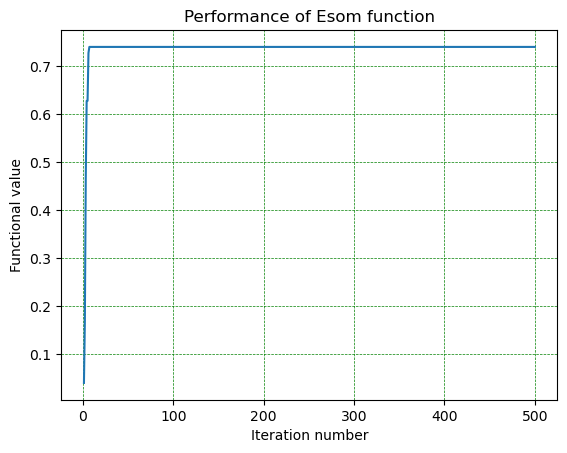

-->Test number 9
Best solution found is:  [3.94539849 3.15135984]
And function result for this solution is:  0.3636471438482036
Totally elapsed  1.0690826  seconds


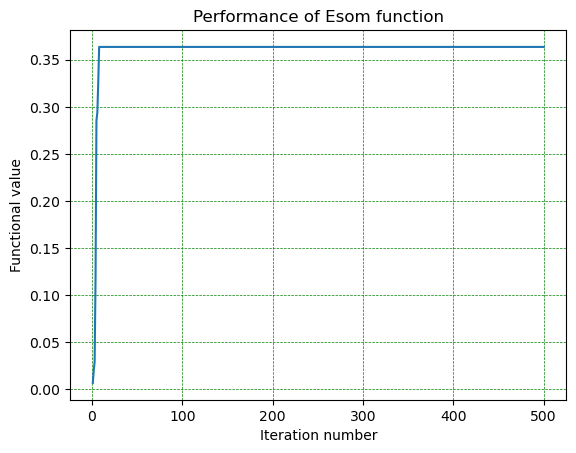

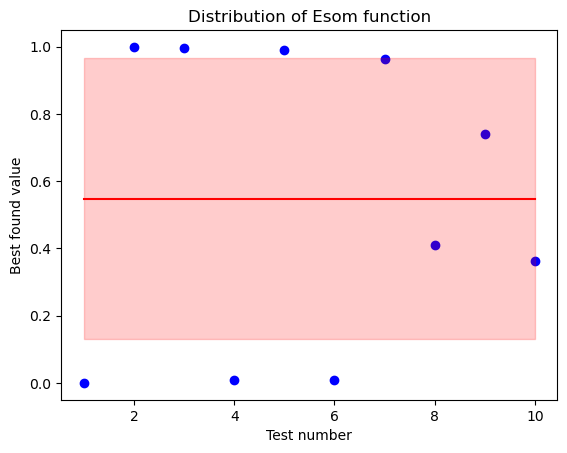

Dispersion is 0.17437367754647123


In [11]:
function_name = "Esom function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_esom_function_python_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_test(function_name, esom_function, -20.0, 20.0, 100, 500, 0.4, 0.3, draw_graph=True)
    average_esom_function_python_time += time_elapsed
    best_values[test_number] = best_value
average_esom_function_python_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Прерывистый тест

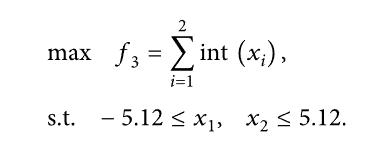

In [12]:
@jit(nopython=True)
def discontinuous_test(arguments):
    return int(arguments[0]) + int(arguments[1])

-->Test number 0
Best solution found is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed  2.7198314  seconds


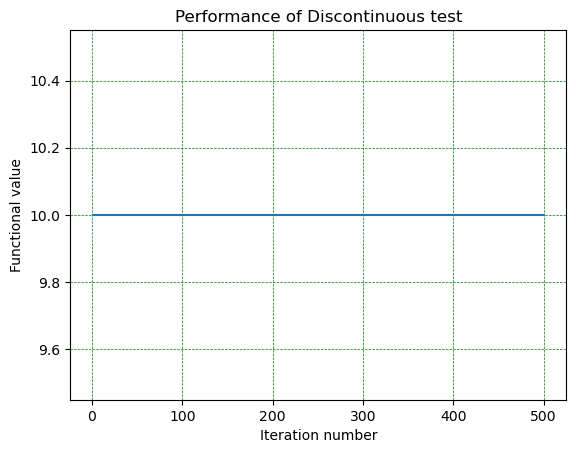

-->Test number 1
Best solution found is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed  0.1296353  seconds


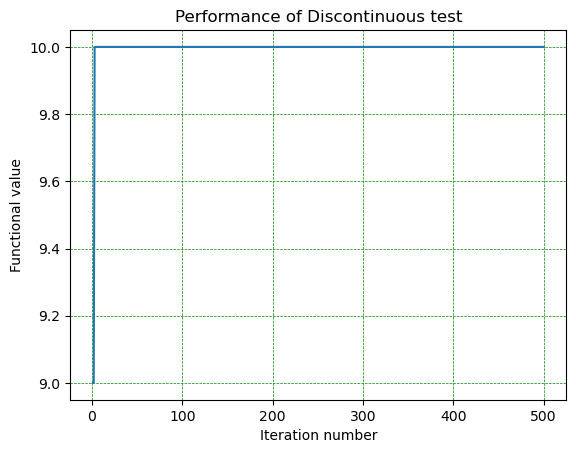

-->Test number 2
Best solution found is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed  0.1263001  seconds


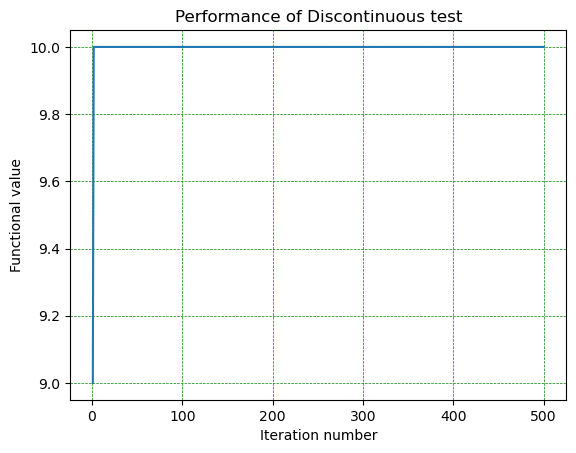

-->Test number 3
Best solution found is:  [5.01863467 5.12      ]
And function result for this solution is:  10
Totally elapsed  0.1282872  seconds


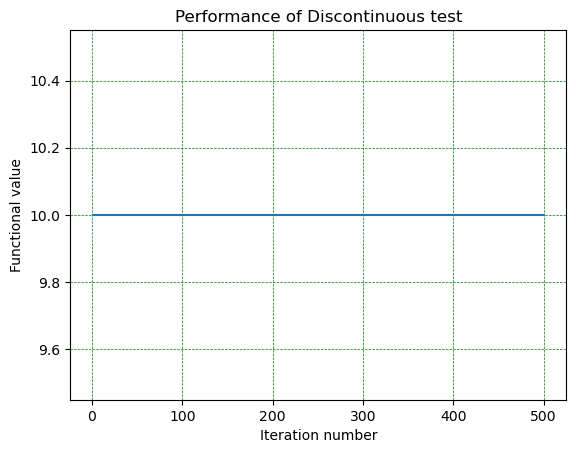

-->Test number 4
Best solution found is:  [5.12       5.10722459]
And function result for this solution is:  10
Totally elapsed  0.1288722  seconds


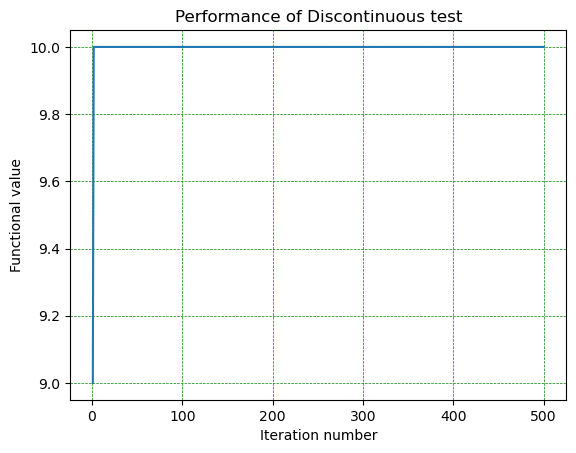

-->Test number 5
Best solution found is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed  0.1265998  seconds


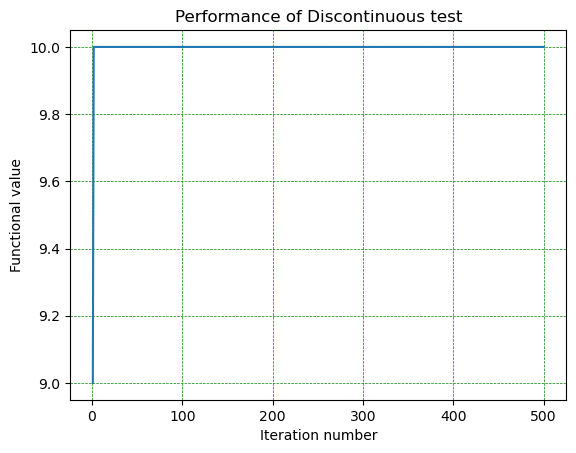

-->Test number 6
Best solution found is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed  0.1243406  seconds


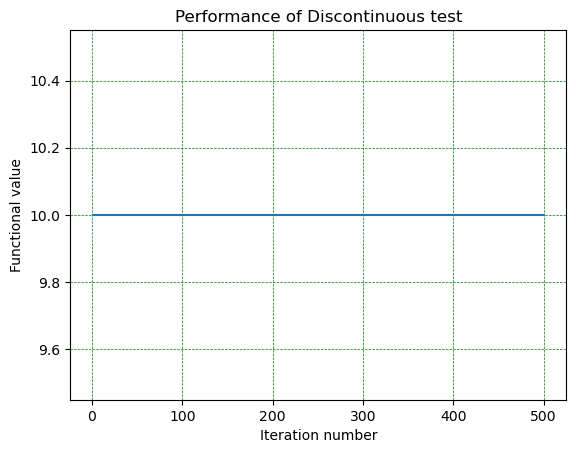

-->Test number 7
Best solution found is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed  0.130917  seconds


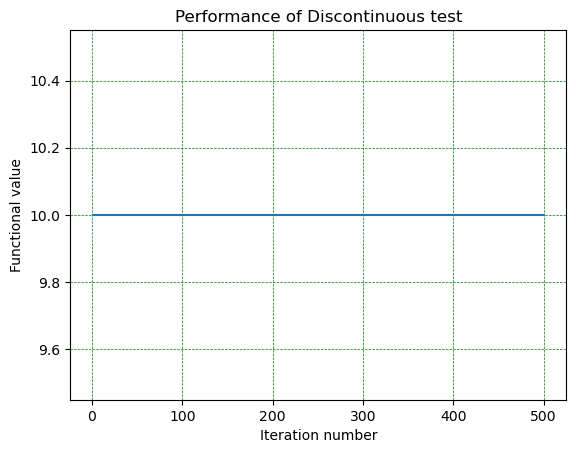

-->Test number 8
Best solution found is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed  0.1384722  seconds


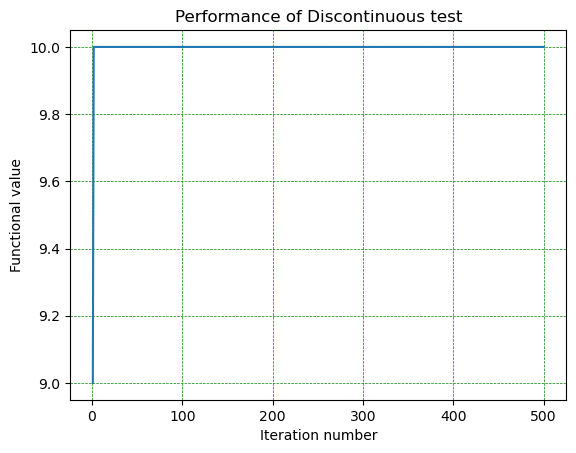

-->Test number 9
Best solution found is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed  0.1262356  seconds


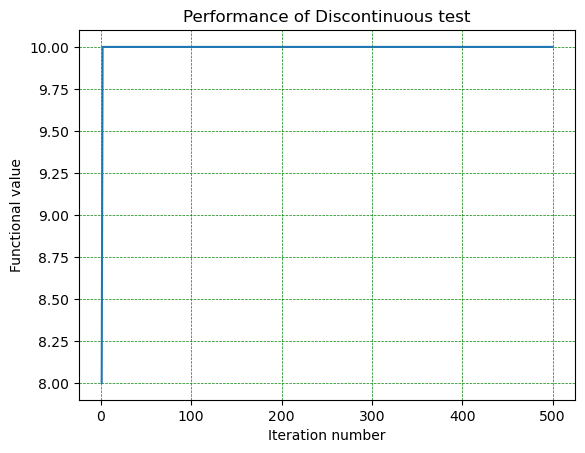

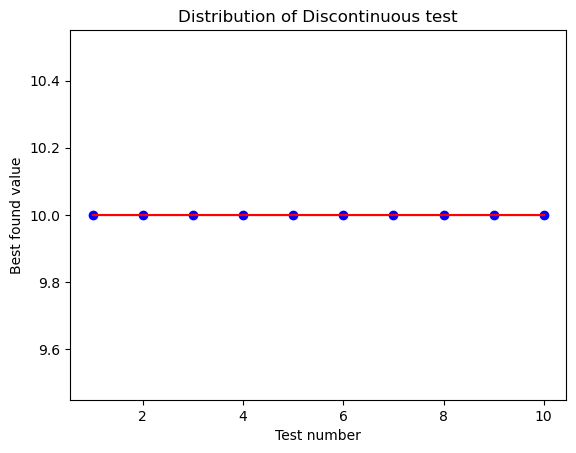

Dispersion is 0.0


In [13]:
function_name = "Discontinuous test"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_discontinuous_test_python_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_test(function_name, discontinuous_test, -5.12, 5.12, 100, 500, 0.4, 0.3, draw_graph=True)
    average_discontinuous_test_python_time += time_elapsed
    best_values[test_number] = best_value
average_discontinuous_test_python_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Тестирование функции Мишры

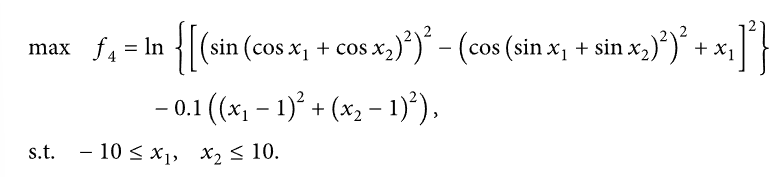

In [14]:
@jit(nopython=True)
def mishra_function(arguments):
    return np.log(
        np.power((
                np.power(np.sin(
                    np.power((np.cos(arguments[0]) + np.cos(arguments[1])), 2)),
                    2) - np.power(
            np.cos(np.power((np.sin(arguments[0]) + np.sin(arguments[1])), 2)),
            2) + arguments[0]
        ), 2)
    ) - 0.1 * (np.power(arguments[0] - 1, 2) + np.power(arguments[1] - 1, 2))

-->Test number 0
Best solution found is:  [2.88812044 1.82292843]
And function result for this solution is:  2.2839406471947723
Totally elapsed  3.7225189  seconds


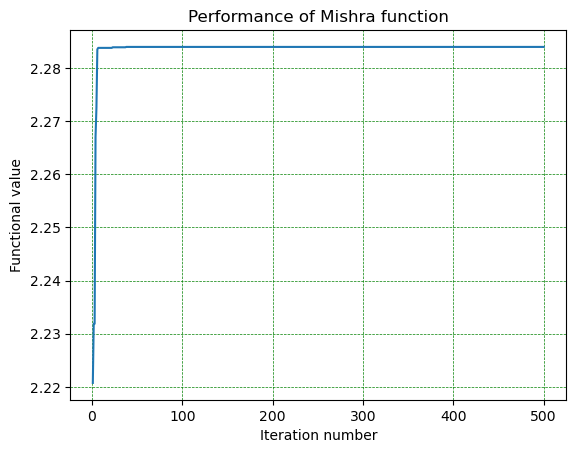

-->Test number 1
Best solution found is:  [2.88718343 1.82333244]
And function result for this solution is:  2.2839471674164313
Totally elapsed  0.8684575  seconds


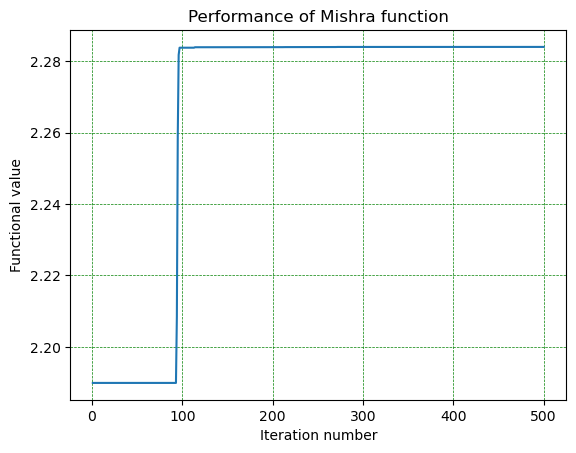

-->Test number 2
Best solution found is:  [2.88849604 1.82317463]
And function result for this solution is:  2.283934949663126
Totally elapsed  0.8219184  seconds


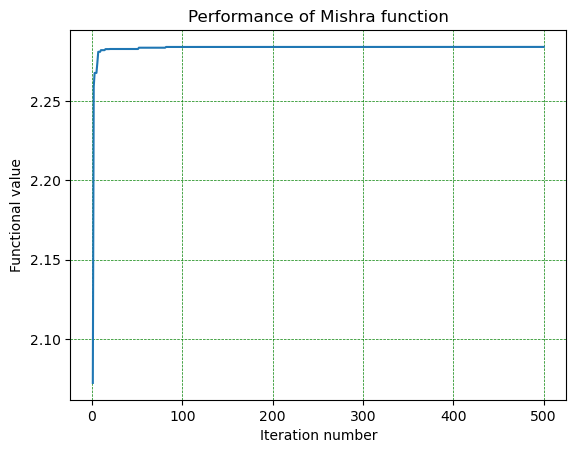

-->Test number 3
Best solution found is:  [2.88414345 1.82458494]
And function result for this solution is:  2.2839374928986502
Totally elapsed  1.0507267  seconds


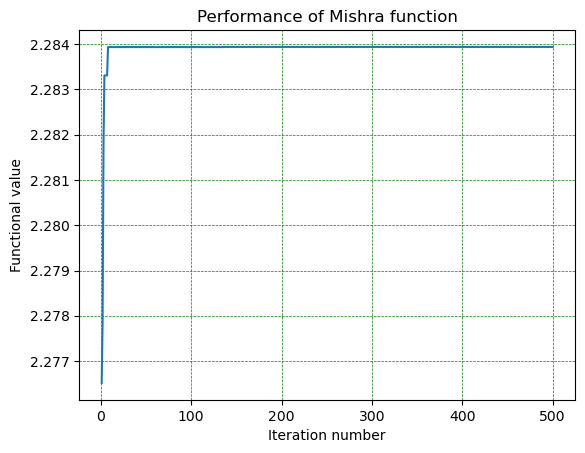

-->Test number 4
Best solution found is:  [2.88665378 1.82390845]
And function result for this solution is:  2.283947475374359
Totally elapsed  1.3675694  seconds


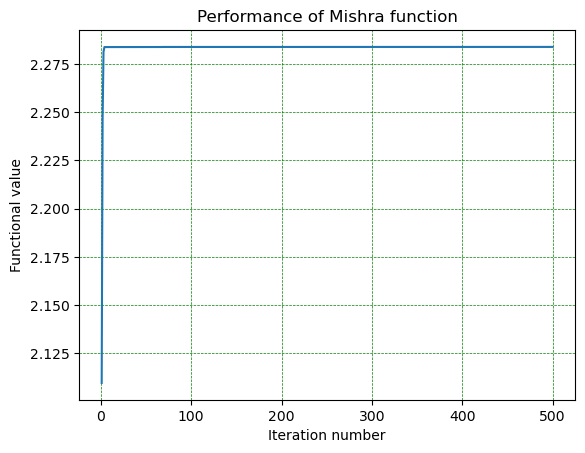

-->Test number 5
Best solution found is:  [2.88491319 1.82356711]
And function result for this solution is:  2.283944507133955
Totally elapsed  1.2860033  seconds


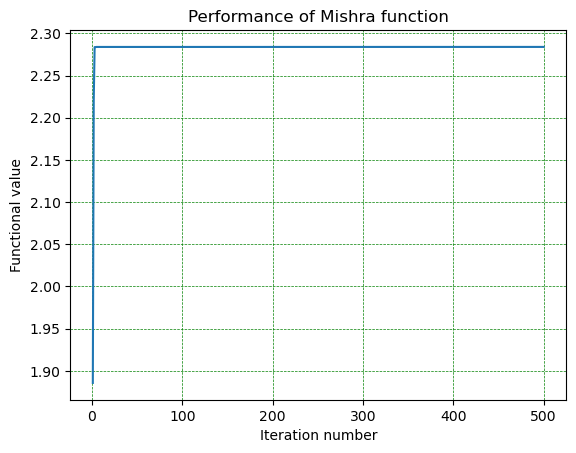

-->Test number 6
Best solution found is:  [2.8872543  1.82199585]
And function result for this solution is:  2.2839453575291024
Totally elapsed  1.1375343  seconds


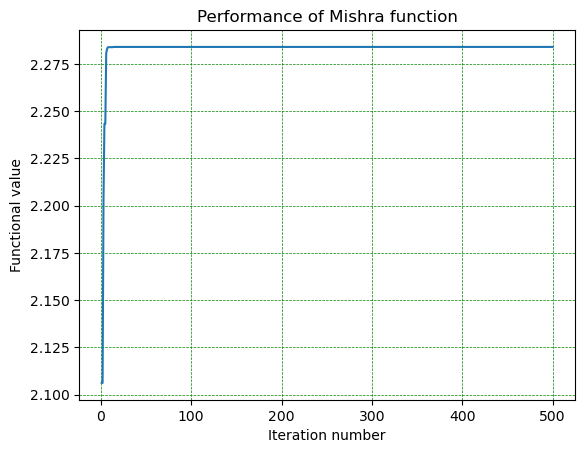

-->Test number 7
Best solution found is:  [2.88662265 1.82327501]
And function result for this solution is:  2.283949503821527
Totally elapsed  0.9827303  seconds


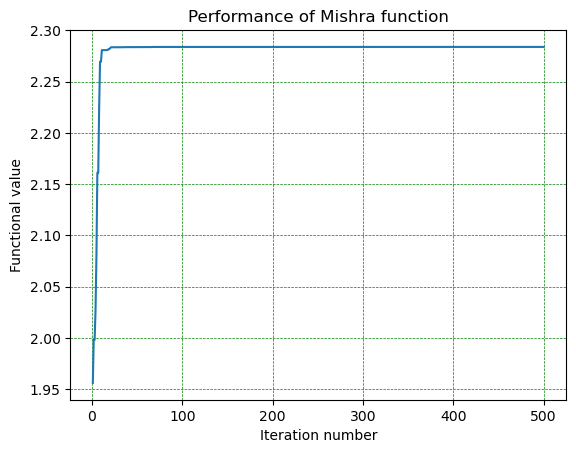

-->Test number 8
Best solution found is:  [2.88626928 1.82458655]
And function result for this solution is:  2.283944420192074
Totally elapsed  1.001274  seconds


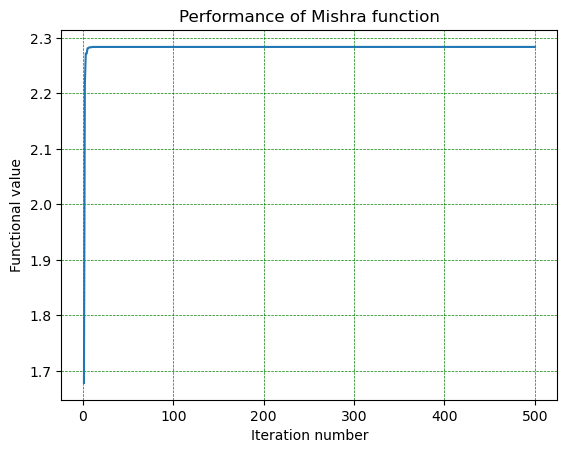

-->Test number 9
Best solution found is:  [2.8866763  1.82327144]
And function result for this solution is:  2.283949387329417
Totally elapsed  1.5863057  seconds


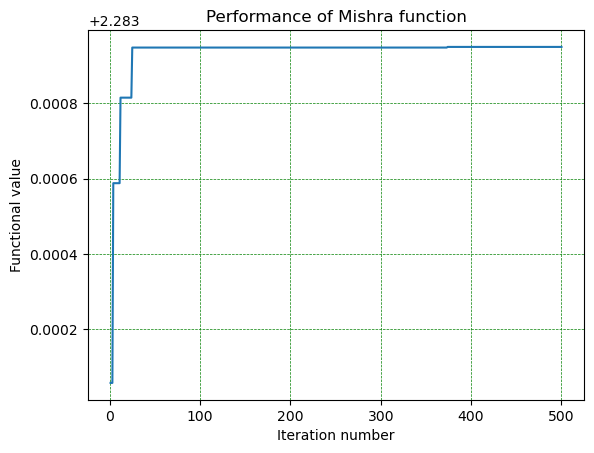

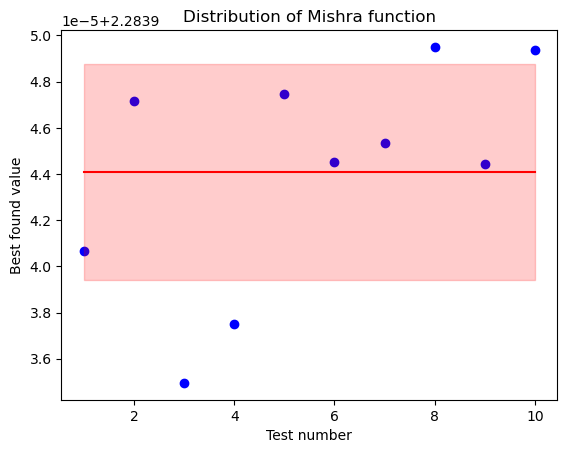

Dispersion is 2.1911247640207726e-11


In [15]:
function_name = "Mishra function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_mishra_function_python_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_test(function_name, mishra_function, -10.0, 10.0, 100, 500, 0.4, 0.3, draw_graph=True)
    average_mishra_function_python_time += time_elapsed
    best_values[test_number] = best_value
average_mishra_function_python_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Стохастический тест

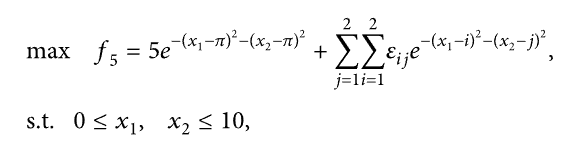

In [16]:
@jit(nopython=True)
def stochastic_test(arguments):
    return 5 * np.exp(-1*np.power((arguments[0] - np.pi), 2) - np.power((arguments[1] - np.pi), 2)) + sum([np.random.rand() * np.exp(-1*np.power((arguments[0] - i), 2) - np.power((arguments[1] - j), 2)) for i in range(2) for j in range(2)])

-->Test number 0
Best solution found is:  [3.14073182 3.14154479]
And function result for this solution is:  5.000095712121221
Totally elapsed  6.6595  seconds


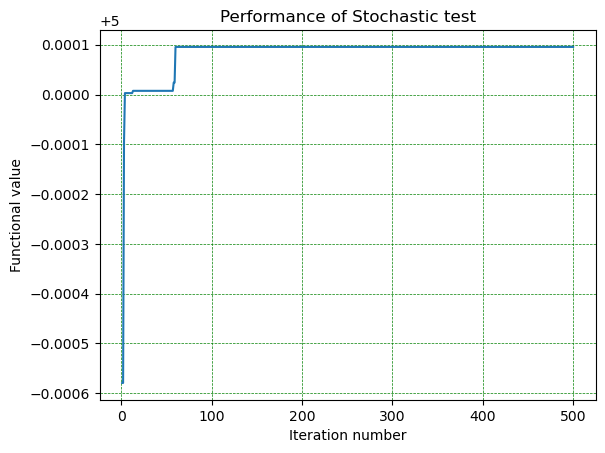

-->Test number 1
Best solution found is:  [3.13968868 3.14178002]
And function result for this solution is:  5.000079738771444
Totally elapsed  3.5444085  seconds


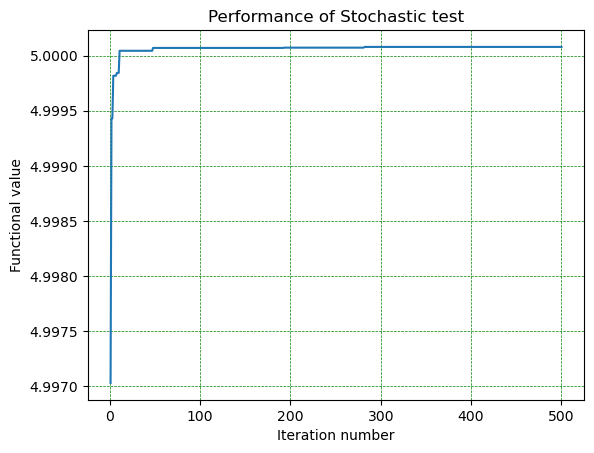

-->Test number 2
Best solution found is:  [3.14297753 3.14042834]
And function result for this solution is:  5.000083374233359
Totally elapsed  3.5466975  seconds


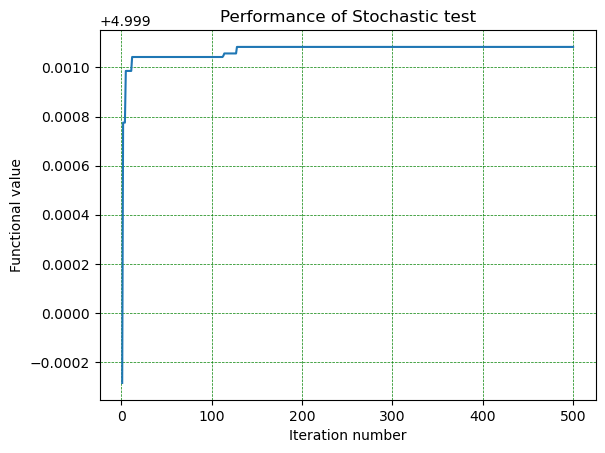

-->Test number 3
Best solution found is:  [3.14186215 3.14267816]
And function result for this solution is:  5.000093709007687
Totally elapsed  3.454235  seconds


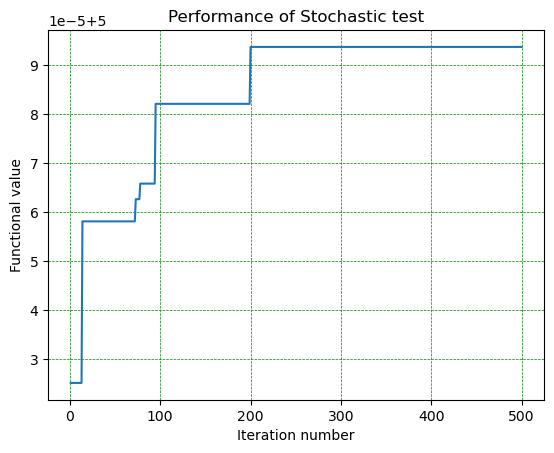

-->Test number 4
Best solution found is:  [3.14080786 3.14078544]
And function result for this solution is:  5.00009747937041
Totally elapsed  3.4542562  seconds


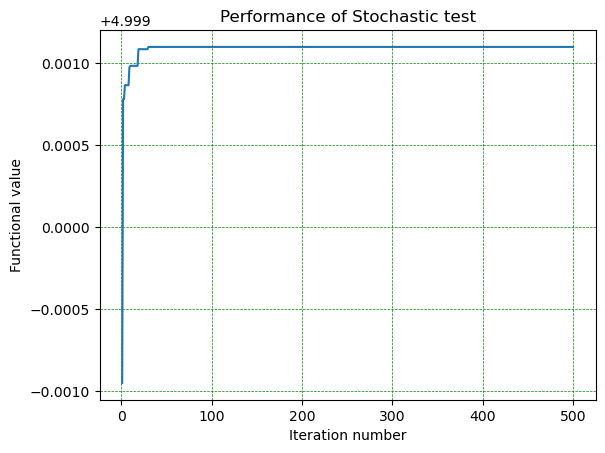

-->Test number 5
Best solution found is:  [3.14116209 3.14076727]
And function result for this solution is:  5.000089594358924
Totally elapsed  3.5109286  seconds


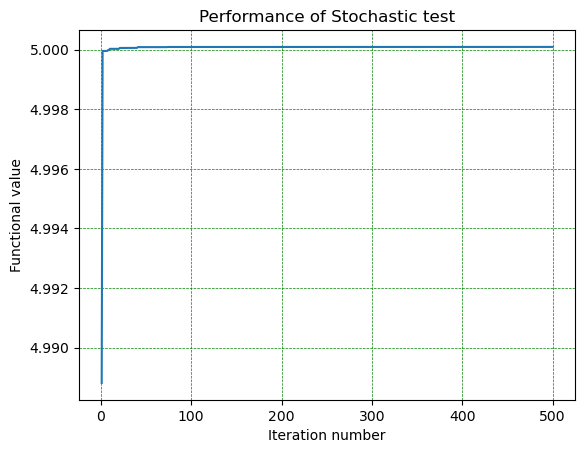

-->Test number 6
Best solution found is:  [3.14228657 3.14227142]
And function result for this solution is:  5.000090648141039
Totally elapsed  3.3723838  seconds


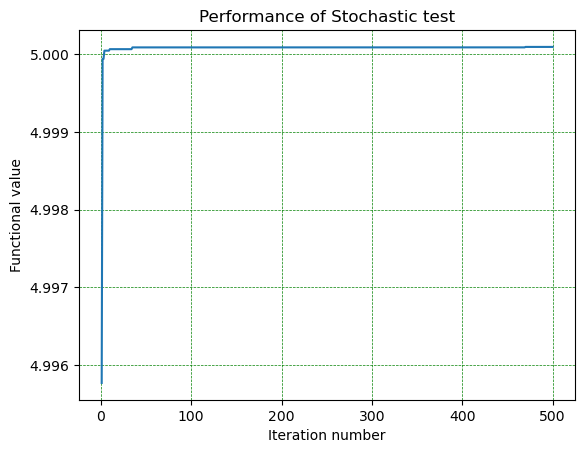

-->Test number 7
Best solution found is:  [3.14149881 3.14141411]
And function result for this solution is:  5.000101835645273
Totally elapsed  3.451249  seconds


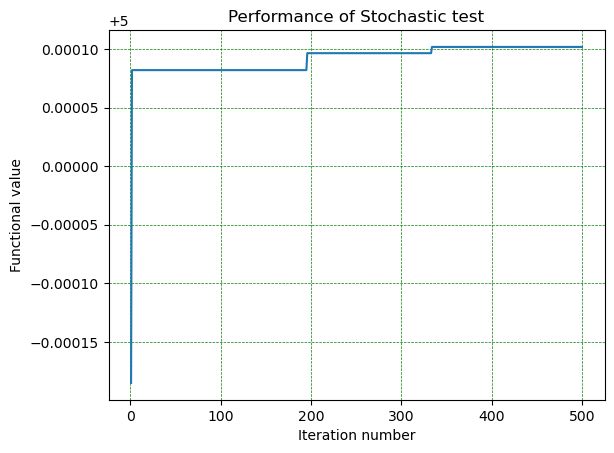

-->Test number 8
Best solution found is:  [3.14094909 3.14188266]
And function result for this solution is:  5.00009808808127
Totally elapsed  3.4802702  seconds


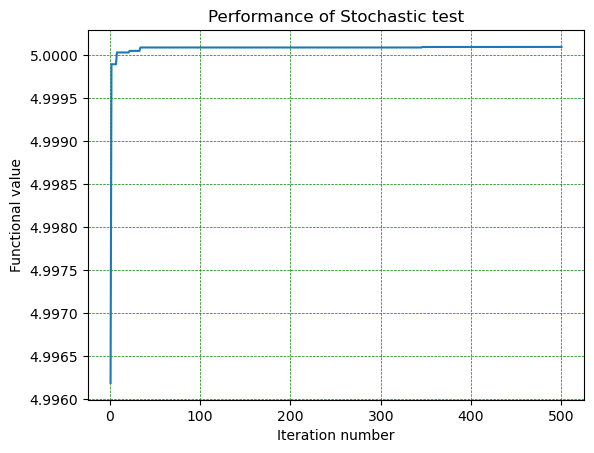

-->Test number 9
Best solution found is:  [3.14097067 3.14281847]
And function result for this solution is:  5.000093015072411
Totally elapsed  3.4786415  seconds


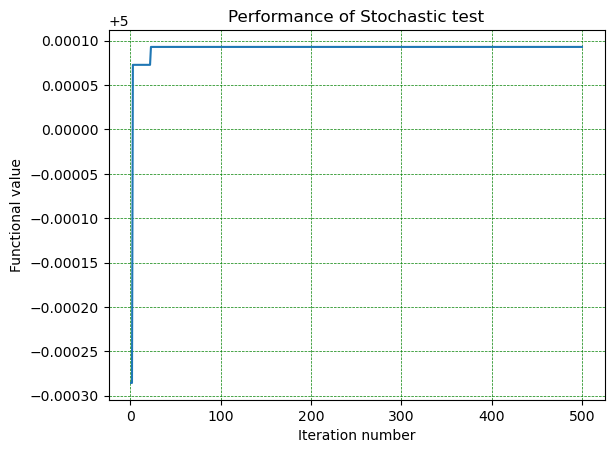

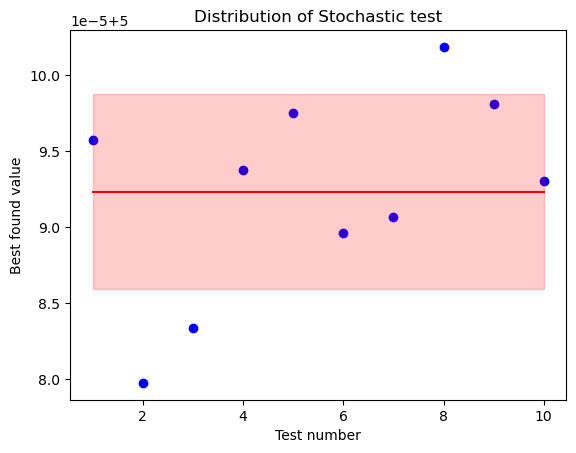

Dispersion is 4.1289460563543254e-11


In [17]:
function_name = "Stochastic test"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_stochastic_test_python_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_test(function_name, stochastic_test, 0.0, 10.0, 100, 500, 0.4, 0.3, draw_graph=True)
    average_stochastic_test_python_time += time_elapsed
    best_values[test_number] = best_value
average_stochastic_test_python_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Тестирование функции Стеблинского

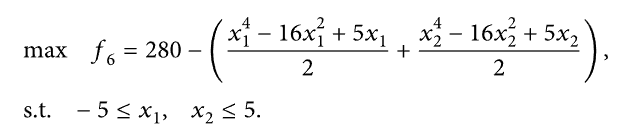

In [18]:
@jit(nopython=True)
def styblinski_function(arguments):
    return 280 - ((arguments[0] ** 4 - 16 * arguments[0] ** 2 + 5 * arguments[
        0]) / 2 + (arguments[1] ** 4 - 16 * arguments[1] ** 2 + 5 * arguments[
        1]) / 2)

-->Test number 0
Best solution found is:  [-2.82158068 -2.86393072]
And function result for this solution is:  358.1926082972762
Totally elapsed  3.0505651  seconds


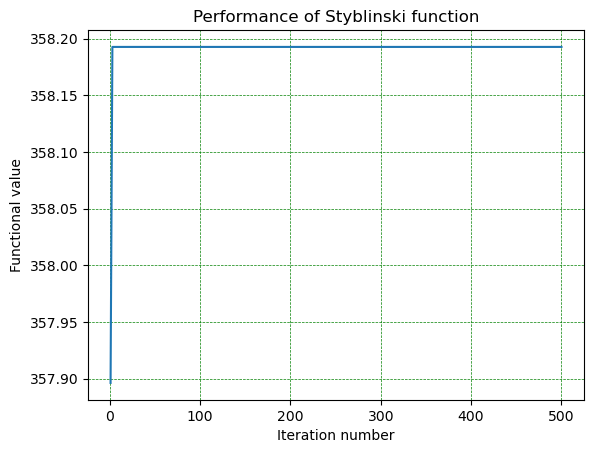

-->Test number 1
Best solution found is:  [-2.86219436 -2.81548649]
And function result for this solution is:  358.1730729422791
Totally elapsed  1.7092021  seconds


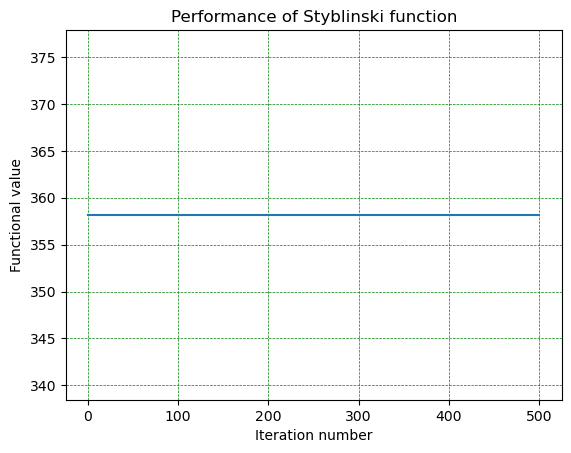

-->Test number 2
Best solution found is:  [-2.81076638 -2.89445953]
And function result for this solution is:  358.186702772746
Totally elapsed  1.9303469  seconds


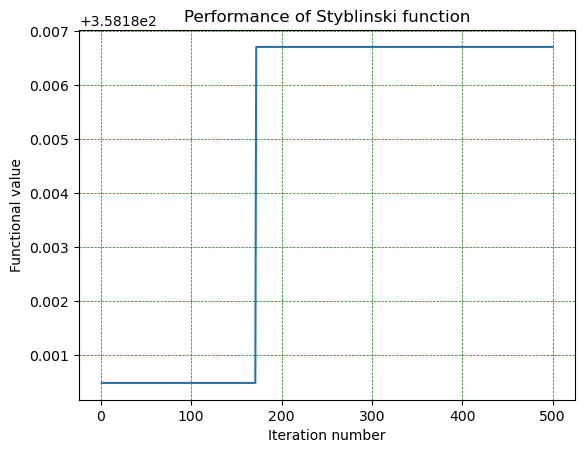

-->Test number 3
Best solution found is:  [-2.82063644 -2.6522858 ]
And function result for this solution is:  357.2153578405401
Totally elapsed  1.6698073  seconds


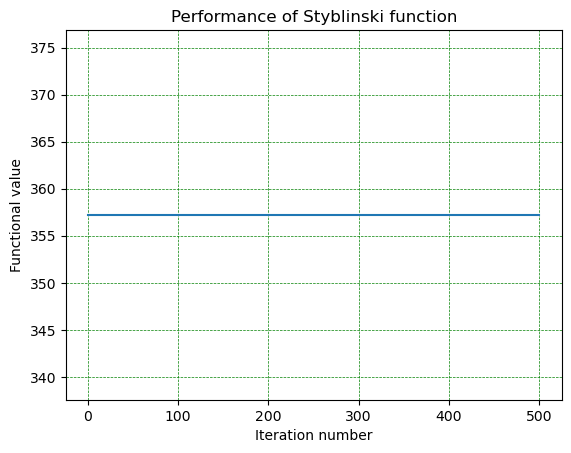

-->Test number 4
Best solution found is:  [-2.86838868 -2.78816085]
And function result for this solution is:  358.0898867774794
Totally elapsed  1.2342131  seconds


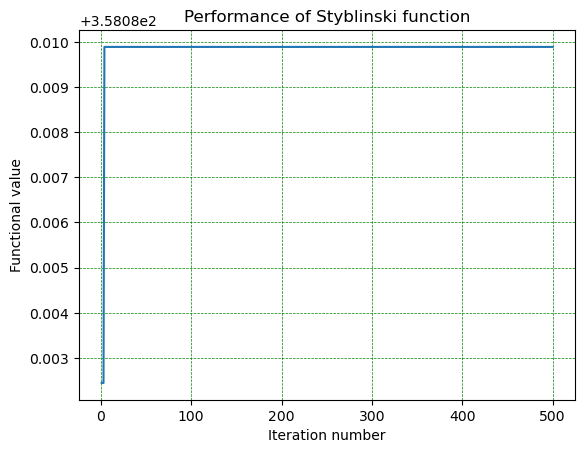

-->Test number 5
Best solution found is:  [-2.81597938 -2.91087046]
And function result for this solution is:  358.2027129386044
Totally elapsed  1.7340941  seconds


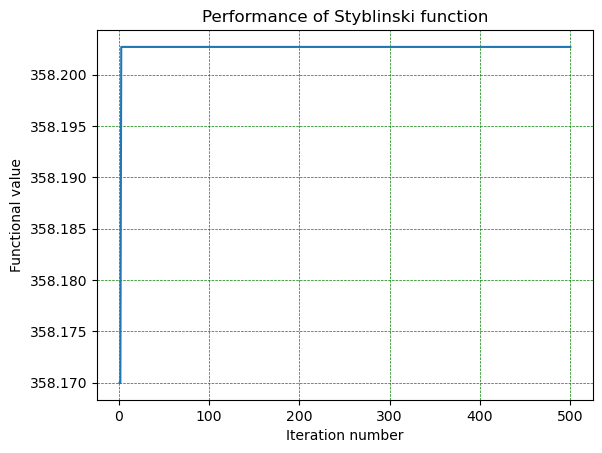

-->Test number 6
Best solution found is:  [-2.80991749 -2.85146522]
And function result for this solution is:  358.1394495049457
Totally elapsed  1.6199697  seconds


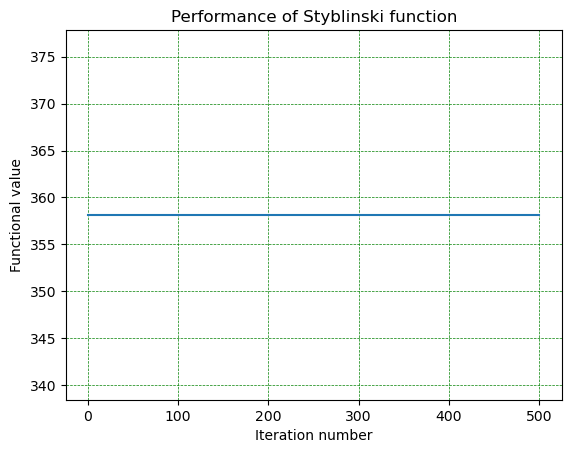

-->Test number 7
Best solution found is:  [-2.77202883 -2.89812701]
And function result for this solution is:  358.0458505853633
Totally elapsed  1.4278246  seconds


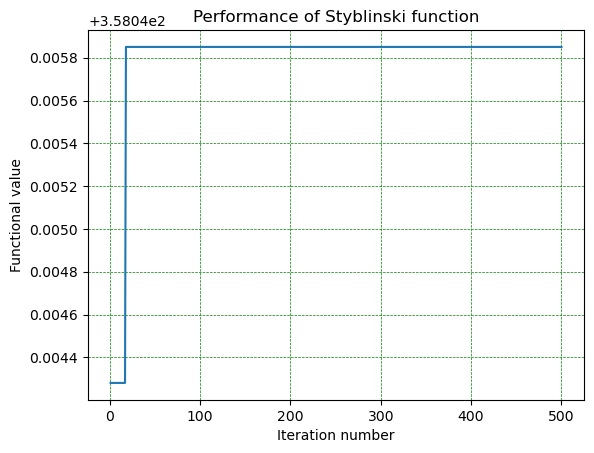

-->Test number 8
Best solution found is:  [-2.8332892  -2.89319236]
And function result for this solution is:  358.2471668984774
Totally elapsed  1.8100561  seconds


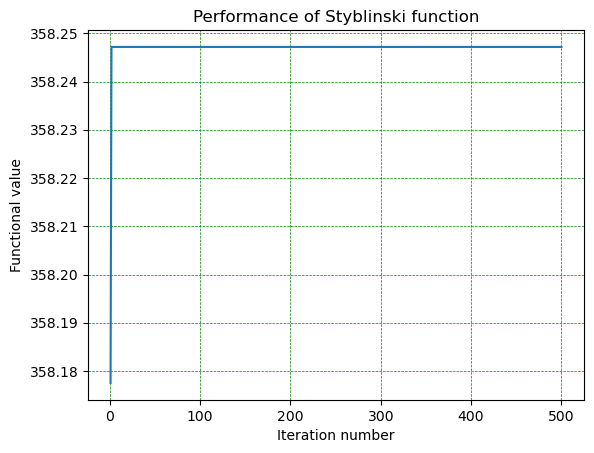

-->Test number 9
Best solution found is:  [-2.87484731 -2.89656279]
And function result for this solution is:  358.31740010925404
Totally elapsed  1.3281551  seconds


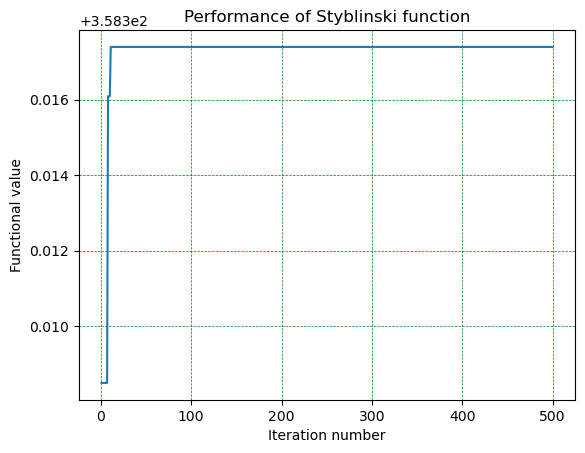

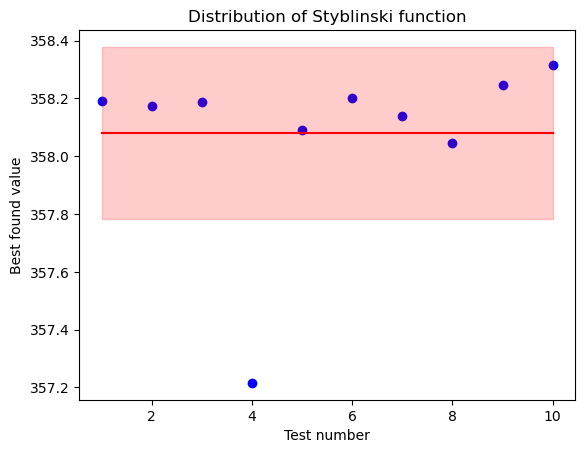

Dispersion is 0.088448454878754


In [18]:
function_name = "Styblinski function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_styblinski_function_python_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_test(function_name, styblinski_function, -5.0, 5.0, 100, 500, 0.4, 0.3, draw_graph=True)
    average_styblinski_function_python_time += time_elapsed
    best_values[test_number] = best_value
average_styblinski_function_python_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Тестирование функции Шуберта

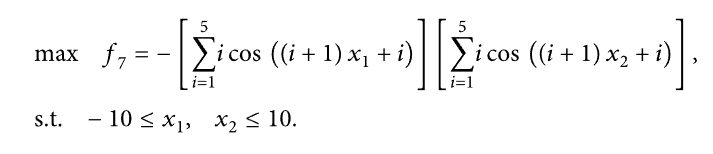

In [60]:
@jit(nopython=True)
def shubert_function(arguments):
    return -1 * sum([i * np.cos((i + 1)*arguments[0] + i) for i in range(1, 6)]) * sum([i * np.cos((i + 1)*arguments[1] + i) for i in range(1, 6)])

-->Test number 0
Best solution found is:  [-1.43527822 -0.76542888]
And function result for this solution is:  183.82581189673294
Totally elapsed  7.0144068  seconds


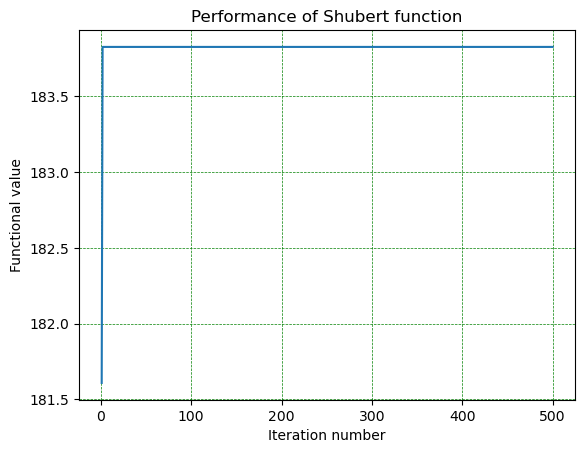

-->Test number 1
Best solution found is:  [-1.39092373  5.56047019]
And function result for this solution is:  171.20037183228928
Totally elapsed  1.6585019  seconds


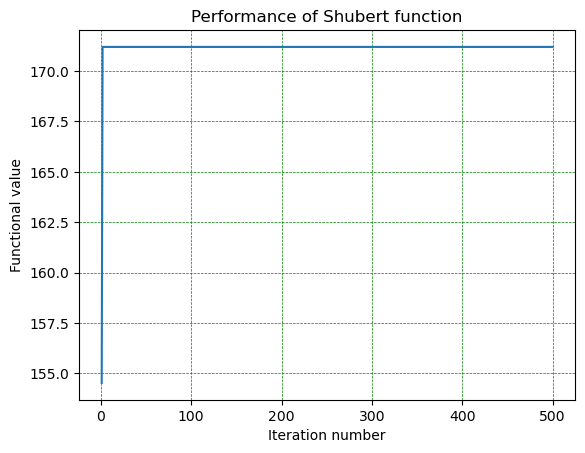

-->Test number 2
Best solution found is:  [-0.79811675 -1.37967502]
And function result for this solution is:  181.86330446171334
Totally elapsed  0.7152862  seconds


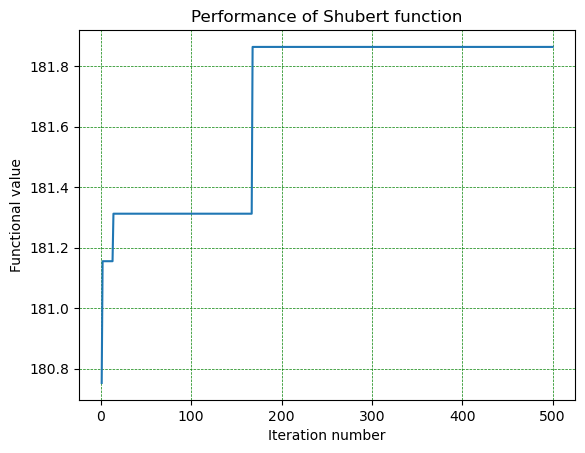

-->Test number 3
Best solution found is:  [-7.06020067 -1.41226   ]
And function result for this solution is:  185.1513572263026
Totally elapsed  1.0281807  seconds


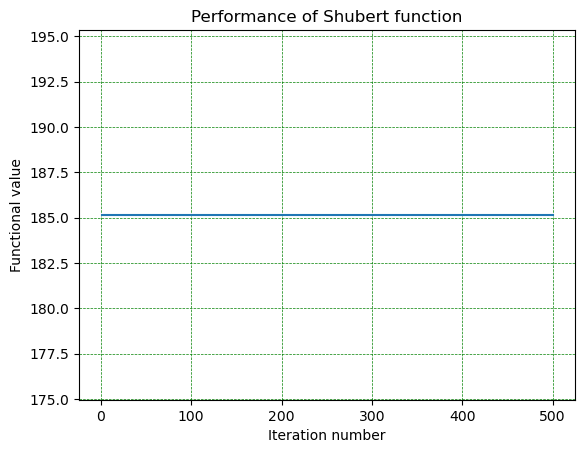

-->Test number 4
Best solution found is:  [ 4.92726654 -0.77605159]
And function result for this solution is:  174.2469040181808
Totally elapsed  1.4757249  seconds


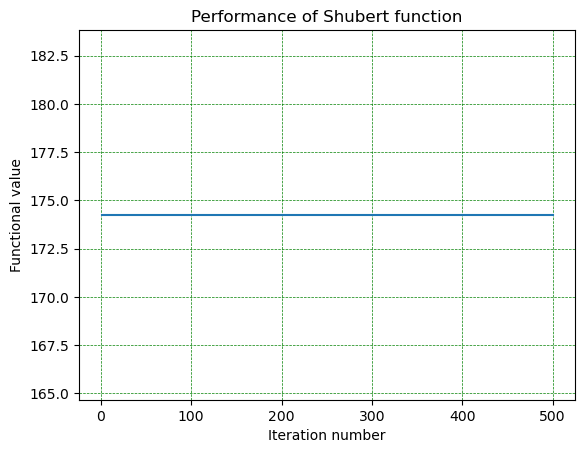

-->Test number 5
Best solution found is:  [4.90132976 5.47365079]
And function result for this solution is:  182.14604951969562
Totally elapsed  1.6695518  seconds


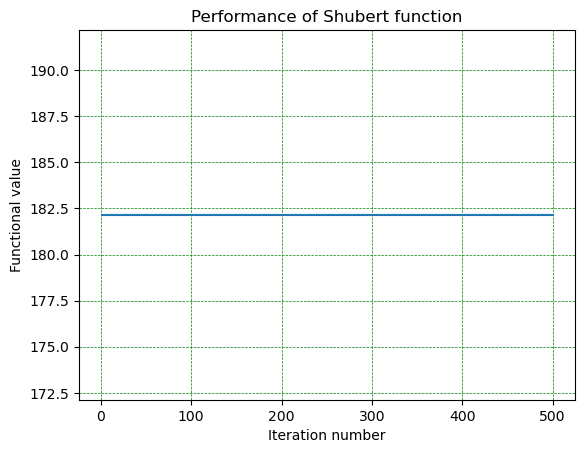

-->Test number 6
Best solution found is:  [ 5.49158132 -7.64052677]
And function result for this solution is:  175.76398620970068
Totally elapsed  1.3581932  seconds


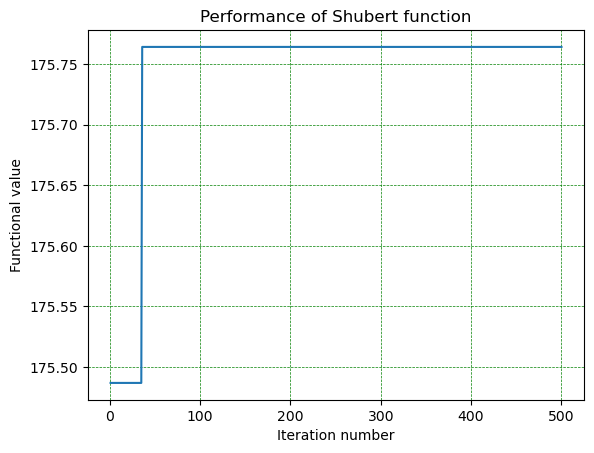

-->Test number 7
Best solution found is:  [ 4.87429163 -0.8065609 ]
And function result for this solution is:  186.02817311698658
Totally elapsed  0.4534637  seconds


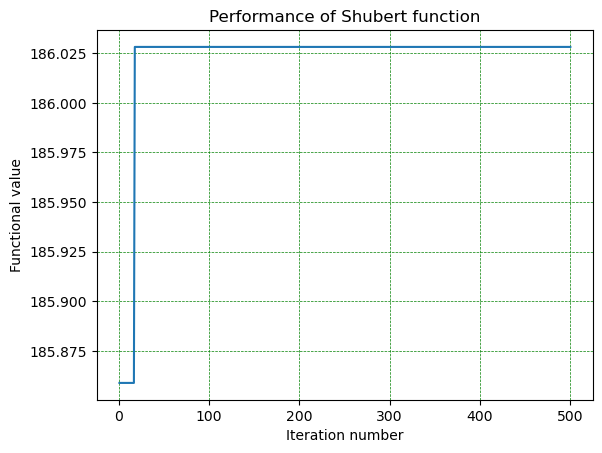

-->Test number 8
Best solution found is:  [-7.01360214  4.85577223]
And function result for this solution is:  176.15239216230512
Totally elapsed  1.7121519  seconds


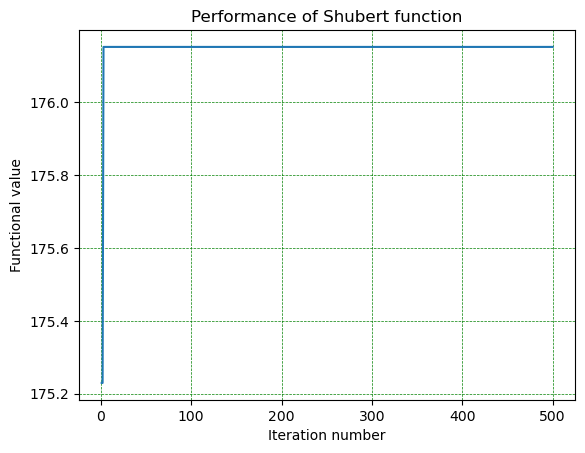

-->Test number 9
Best solution found is:  [-7.69897409 -0.76066664]
And function result for this solution is:  183.08855691950387
Totally elapsed  1.8583408  seconds


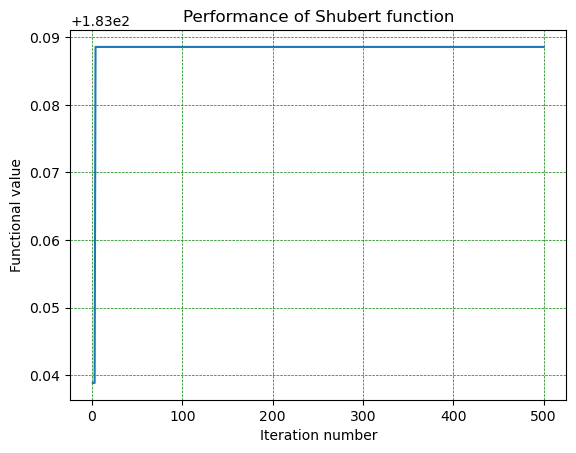

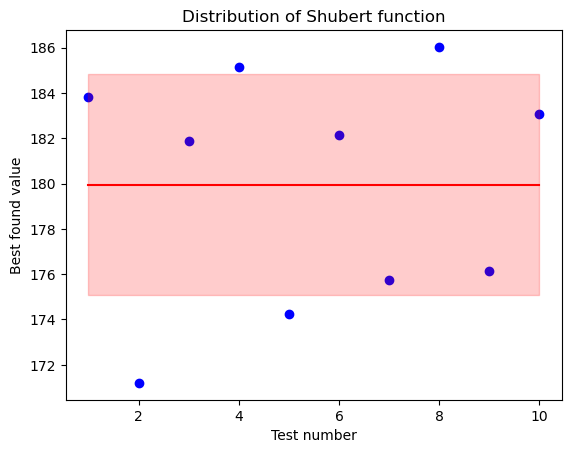

Dispersion is 23.837985436793566


In [88]:
function_name = "Shubert function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_shubert_function_python_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_test(function_name, shubert_function, -10.0, 10.0, 100, 500, 0.4, 0.3, draw_graph=True)
    average_shubert_function_python_time += time_elapsed
    best_values[test_number] = best_value
average_shubert_function_python_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

# Реализация на Си

In [21]:
class Result(ctypes.Structure):
    _fields_ = [
        ("best_solution", ctypes.POINTER(ctypes.c_float)),
        ("best_intensity", ctypes.c_float),
    ]
def c(file, name, types, result):
    path = os.path.abspath(file)
    module = ctypes.cdll.LoadLibrary(path)
    func = module[name]
    func.argtypes = types
    func.restype = result
    return func

MAX_PARTICLES = 100
MAX_DIMENSIONS = 10

#Result firefly_algorithm(float (*function)(float *, int), int dimensions, float bounds_array[MAX_DIMENSIONS][2], int fireflies_number, 
                        #int max_iteration, float alpha, float beta, int random_movement_possibilites)
function_type = ctypes.CFUNCTYPE(ctypes.c_float, ctypes.POINTER(ctypes.c_float))    
firefly_algorithm = c("C:/Users/kd004/Downloads/libcode.dll", "firefly_algorithm", (function_type, ctypes.c_int, (ctypes.c_float * 2) * MAX_DIMENSIONS , ctypes.c_int, ctypes.c_int, ctypes.c_float, ctypes.c_float, ctypes.c_int), Result)

In [22]:
def perform_c_test(function, min_argument, max_argument, fireflies_number, iterations_number, alpha, beta, random_tries_number=100):
    c_objective_function = function_type(function)
    bonds = (ctypes.c_float * 2) * MAX_DIMENSIONS
    bonds = bonds()
    bonds[0][0] = min_argument
    bonds[0][1] = max_argument
    bonds[1][0] = min_argument
    bonds[1][1] = max_argument

    start_time = time.perf_counter_ns()
    result = firefly_algorithm(c_objective_function, 2, bonds, fireflies_number, iterations_number, alpha, beta, random_tries_number)
    time_elapsed = time.perf_counter_ns() - start_time
    best_solution = [result.best_solution[i] for i in range(2)]
    print("Best solution found is: ", best_solution)
    print("And function result for this solution is: ", result.best_intensity)
    print("Totally elapsed ", time_elapsed/1_000_000_000, " seconds")
    
    return result.best_intensity, time_elapsed / 1_000_000_000

## Тестирование функции Де Джонга

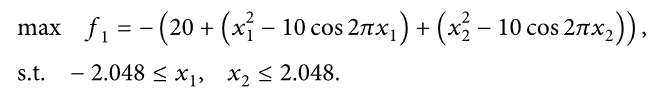

In [23]:
def second_de_jong_function(arguments):
    return -1.0 * ( 20 + (np.power(arguments[0], 2) - 10*(np.cos(2*np.pi * arguments[0]))) + (np.power(arguments[1], 2) - 10*(np.cos(2*np.pi * arguments[1]))))

-->Test number 0
Best solution found is:  [0.011055193841457367, 0.08389995992183685]
And function result for this solution is:  -1.388878345489502
Totally elapsed  3.0106579  seconds
-->Test number 1
Best solution found is:  [0.056607868522405624, -0.0023759230971336365]
And function result for this solution is:  -0.6302173137664795
Totally elapsed  1.9338015  seconds
-->Test number 2
Best solution found is:  [0.9965574741363525, 0.0026881371159106493]
And function result for this solution is:  -0.9968995451927185
Totally elapsed  4.3000872  seconds
-->Test number 3
Best solution found is:  [0.0014773029834032059, 0.017461583018302917]
And function result for this solution is:  -0.060863737016916275
Totally elapsed  0.8724591  seconds
-->Test number 4
Best solution found is:  [0.029774848371744156, 0.011798654682934284]
And function result for this solution is:  -0.20297826826572418
Totally elapsed  1.2678509  seconds
-->Test number 5
Best solution found is:  [0.054271068423986435, -0

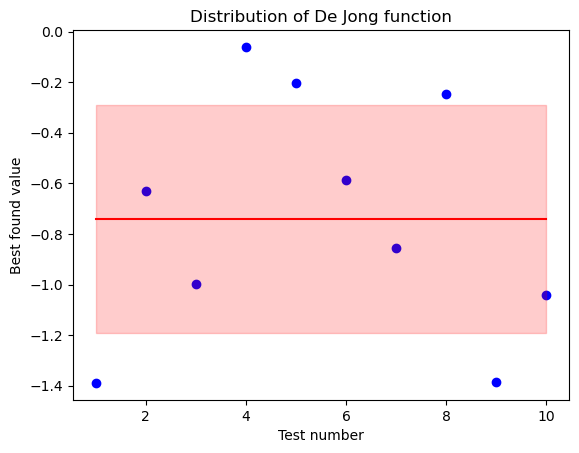

Dispersion is 0.20346522156860622


In [24]:
function_name = "De Jong function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_de_jong_function_c_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_c_test(second_de_jong_function, -2.048, 2.048, 100, 500, 0.4, 0.3)
    average_de_jong_function_c_time += time_elapsed
    best_values[test_number] = best_value
average_de_jong_function_c_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Тестирование функции Есома

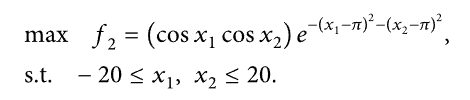

In [25]:
def esom_function(arguments):
    return (np.cos(arguments[0]) * np.cos(arguments[1]) * np.exp(
        -1 * np.power((arguments[0] - np.pi), 2) - np.power(
            (arguments[1] - np.pi), 2)))

-->Test number 0
Best solution found is:  [3.2323246002197266, 3.854159116744995]
And function result for this solution is:  0.4498184025287628
Totally elapsed  0.7355059  seconds
-->Test number 1
Best solution found is:  [3.2323246002197266, 3.854159116744995]
And function result for this solution is:  0.4498184025287628
Totally elapsed  0.7448276  seconds
-->Test number 2
Best solution found is:  [3.1319549083709717, 3.7622978687286377]
And function result for this solution is:  0.553295910358429
Totally elapsed  0.7286552  seconds
-->Test number 3
Best solution found is:  [4.980791091918945, 1.3741631507873535]
And function result for this solution is:  7.739175634924322e-05
Totally elapsed  0.7511983  seconds
-->Test number 4
Best solution found is:  [3.200901508331299, 4.129857063293457]
And function result for this solution is:  0.20607268810272217
Totally elapsed  0.737734  seconds
-->Test number 5
Best solution found is:  [3.200901508331299, 4.129857063293457]
And function resu

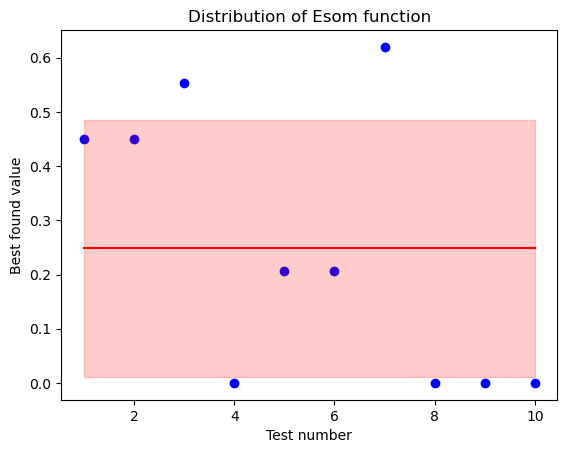

Dispersion is 0.05624545068826834


In [26]:
function_name = "Esom function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_esom_function_c_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_c_test(esom_function, -20.0, 20.0, 100, 500, 0.4, 0.3)
    average_esom_function_c_time += time_elapsed
    best_values[test_number] = best_value
average_esom_function_c_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Прерывистый тест

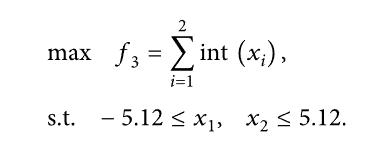

In [27]:
def discontinuous_test(arguments):
    return int(arguments[0]) + int(arguments[1])

-->Test number 0
Best solution found is:  [5.119999885559082, 5.119999885559082]
And function result for this solution is:  10.0
Totally elapsed  2.6630258  seconds
-->Test number 1
Best solution found is:  [5.119999885559082, 5.119999885559082]
And function result for this solution is:  10.0
Totally elapsed  2.6160743  seconds
-->Test number 2
Best solution found is:  [5.119999885559082, 5.119999885559082]
And function result for this solution is:  10.0
Totally elapsed  2.6048684  seconds
-->Test number 3
Best solution found is:  [5.119999885559082, 5.119999885559082]
And function result for this solution is:  10.0
Totally elapsed  2.6446242  seconds
-->Test number 4
Best solution found is:  [5.119999885559082, 5.119999885559082]
And function result for this solution is:  10.0
Totally elapsed  2.5972736  seconds
-->Test number 5
Best solution found is:  [5.119999885559082, 5.119999885559082]
And function result for this solution is:  10.0
Totally elapsed  2.6155689  seconds
-->Test nu

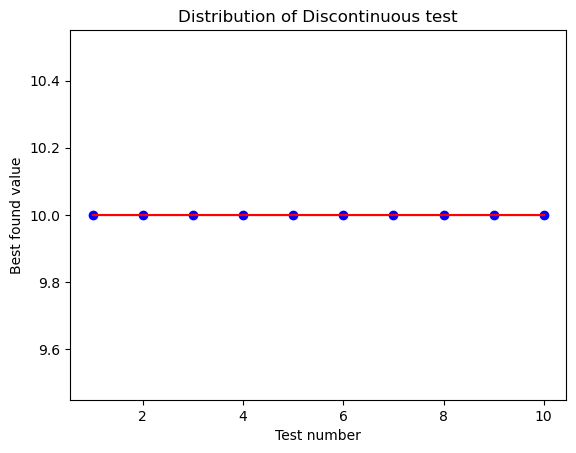

Dispersion is 0.0


In [28]:
function_name = "Discontinuous test"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_discontinuous_test_c_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_c_test(discontinuous_test, -5.12, 5.12, 100, 500, 0.4, 0.3)
    average_discontinuous_test_c_time += time_elapsed
    best_values[test_number] = best_value
average_discontinuous_test_c_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Тестирование функции Мишры

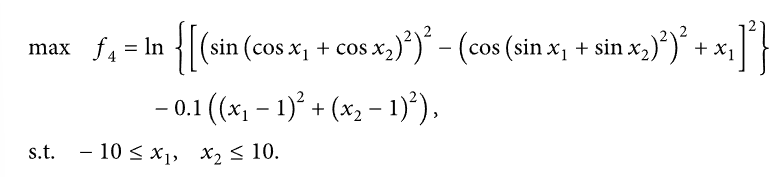

In [29]:
def mishra_function(arguments):
    return np.log(
        np.power((
                np.power(np.sin(
                    np.power((np.cos(arguments[0]) + np.cos(arguments[1])), 2)),
                    2) - np.power(
            np.cos(np.power((np.sin(arguments[0]) + np.sin(arguments[1])), 2)),
            2) + arguments[0]
        ), 2)
    ) - 0.1 * (np.power(arguments[0] - 1, 2) + np.power(arguments[1] - 1, 2))

-->Test number 0
Best solution found is:  [2.887404441833496, 1.8239672183990479]
And function result for this solution is:  2.283942222595215
Totally elapsed  19.2387273  seconds
-->Test number 1
Best solution found is:  [2.8865692615509033, 1.8232789039611816]
And function result for this solution is:  2.283949613571167
Totally elapsed  18.8062559  seconds
-->Test number 2
Best solution found is:  [2.8870465755462646, 1.8230690956115723]
And function result for this solution is:  2.2839484214782715
Totally elapsed  21.117546  seconds
-->Test number 3
Best solution found is:  [2.886326313018799, 1.8227068185806274]
And function result for this solution is:  2.2839488983154297
Totally elapsed  18.4577797  seconds
-->Test number 4
Best solution found is:  [2.8888211250305176, 1.8223795890808105]
And function result for this solution is:  2.283933401107788
Totally elapsed  20.7265477  seconds
-->Test number 5
Best solution found is:  [2.884915590286255, 1.8235986232757568]
And function r

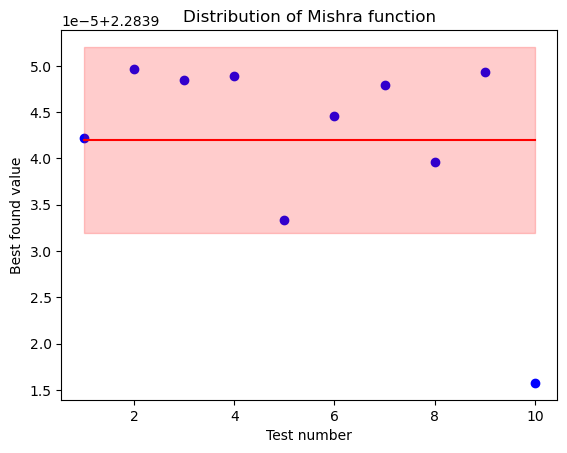

Dispersion is 1.011699168884661e-10


In [30]:
function_name = "Mishra function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_mishra_function_c_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_c_test(mishra_function, -10.0, 10.0, 100, 500, 0.4, 0.3)
    average_mishra_function_c_time += time_elapsed
    best_values[test_number] = best_value
average_mishra_function_c_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Стохастический тест

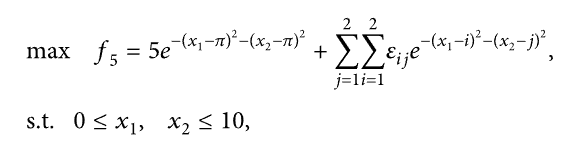

In [31]:
def stochastic_test(arguments):
    return 5 * np.exp(-1*np.power((arguments[0] - np.pi), 2) - np.power((arguments[1] - np.pi), 2)) + sum([np.random.rand() * np.exp(-1*np.power((arguments[0] - i), 2) - np.power((arguments[1] - j), 2)) for i in range(2) for j in range(2)])

-->Test number 0
Best solution found is:  [3.1414506435394287, 3.141256332397461]
And function result for this solution is:  5.000089645385742
Totally elapsed  68.8353771  seconds
-->Test number 1
Best solution found is:  [3.1422858238220215, 3.141862630844116]
And function result for this solution is:  5.000092506408691
Totally elapsed  72.4190813  seconds
-->Test number 2
Best solution found is:  [3.1425769329071045, 3.141309976577759]
And function result for this solution is:  5.000093936920166
Totally elapsed  71.9378184  seconds
-->Test number 3
Best solution found is:  [3.140676736831665, 3.1415371894836426]
And function result for this solution is:  5.000094413757324
Totally elapsed  72.2368077  seconds
-->Test number 4
Best solution found is:  [3.1419482231140137, 3.1424155235290527]
And function result for this solution is:  5.000097751617432
Totally elapsed  70.1151217  seconds
-->Test number 5
Best solution found is:  [3.1411757469177246, 3.142550230026245]
And function resu

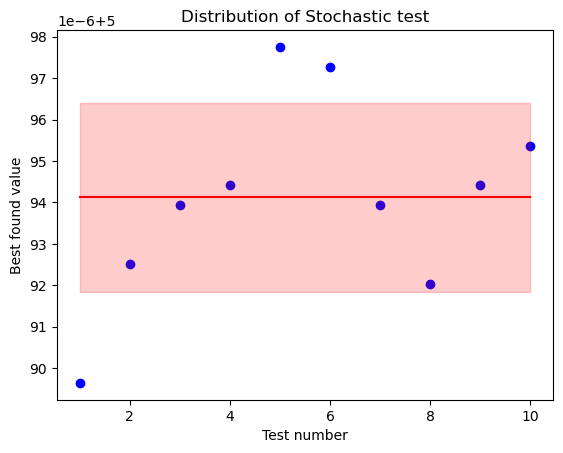

Dispersion is 5.193214747123421e-12


In [32]:
function_name = "Stochastic test"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_stochastic_test_c_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_c_test(stochastic_test, 0.0, 10.0, 100, 500, 0.4, 0.3)
    average_stochastic_test_c_time += time_elapsed
    best_values[test_number] = best_value
average_stochastic_test_c_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Тестирование функции Стеблинского

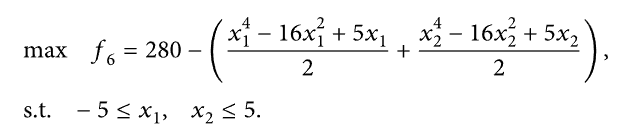

In [33]:
def styblinski_function(arguments):
    return 280 - ((arguments[0] ** 4 - 16 * arguments[0] ** 2 + 5 * arguments[
        0]) / 2 + (arguments[1] ** 4 - 16 * arguments[1] ** 2 + 5 * arguments[
        1]) / 2)

-->Test number 0
Best solution found is:  [-2.6459250450134277, -2.8451364040374756]
And function result for this solution is:  357.2240905761719
Totally elapsed  3.6459445  seconds
-->Test number 1
Best solution found is:  [-2.8966786861419678, -2.7891383171081543]
And function result for this solution is:  358.11383056640625
Totally elapsed  4.2716774  seconds
-->Test number 2
Best solution found is:  [-2.4101431369781494, -2.909959077835083]
And function result for this solution is:  354.79010009765625
Totally elapsed  4.5398614  seconds
-->Test number 3
Best solution found is:  [-2.7746222019195557, -2.9088969230651855]
And function result for this solution is:  358.0567932128906
Totally elapsed  3.7046726  seconds
-->Test number 4
Best solution found is:  [-2.8182549476623535, -2.437969923019409]
And function result for this solution is:  355.02471923828125
Totally elapsed  4.170659  seconds
-->Test number 5
Best solution found is:  [-2.7364695072174072, -2.9021847248077393]
And f

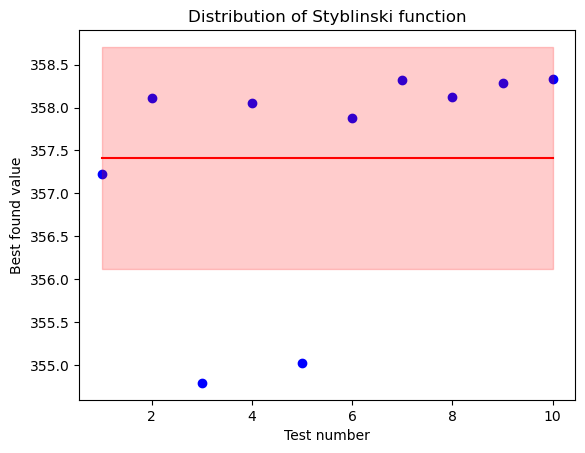

Dispersion is 1.668799107298255


In [34]:
function_name = "Styblinski function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_styblinski_function_c_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_c_test(styblinski_function, -5.0, 5.0, 100, 500, 0.4, 0.3)
    average_styblinski_function_c_time += time_elapsed
    best_values[test_number] = best_value
average_styblinski_function_c_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Тестирование функции Шуберта

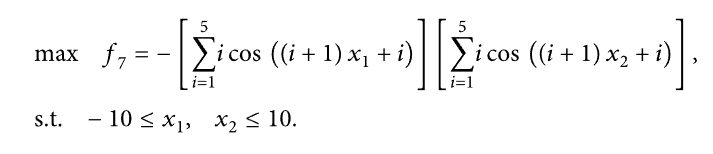

In [35]:
def shubert_function(arguments):
    return -1 * sum([i * np.cos((i + 1)*arguments[0] + i) for i in range(1, 6)]) * sum([i * np.cos((i + 1)*arguments[1] + i) for i in range(1, 6)])

-->Test number 0
Best solution found is:  [-1.4166327714920044, -7.0687947273254395]
And function result for this solution is:  186.085693359375
Totally elapsed  7.3035049  seconds
-->Test number 1
Best solution found is:  [-1.3922934532165527, -0.7775160074234009]
And function result for this solution is:  183.07118225097656
Totally elapsed  3.9391663  seconds
-->Test number 2
Best solution found is:  [-1.3758337497711182, 5.4837870597839355]
And function result for this solution is:  181.01475524902344
Totally elapsed  6.5745752  seconds
-->Test number 3
Best solution found is:  [-1.3965286016464233, 5.505435943603516]
And function result for this solution is:  183.70248413085938
Totally elapsed  7.7068851  seconds
-->Test number 4
Best solution found is:  [5.500401020050049, -1.4224493503570557]
And function result for this solution is:  186.0368194580078
Totally elapsed  3.4114869  seconds
-->Test number 5
Best solution found is:  [-7.063461780548096, -7.702006816864014]
And functi

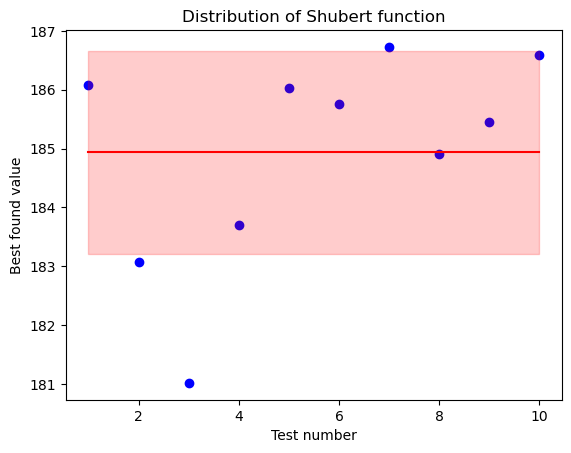

Dispersion is 2.9784825824224384


In [36]:
function_name = "Shubert function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_shubert_function_c_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_c_test(shubert_function, -10.0, 10.0, 100, 500, 0.4, 0.3)
    average_shubert_function_c_time += time_elapsed
    best_values[test_number] = best_value
average_shubert_function_c_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

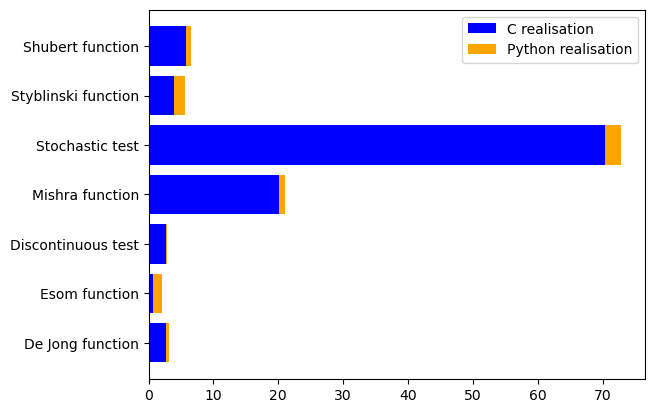

In [37]:
c_times_array = np.array([average_de_jong_function_c_time,
                      average_esom_function_c_time,
                      average_discontinuous_test_c_time,
                      average_mishra_function_c_time,
                      average_stochastic_test_c_time,
                      average_styblinski_function_c_time,
                      average_shubert_function_c_time])
python_times_array = [average_de_jong_function_python_time,
                      average_esom_function_python_time,
                      average_discontinuous_test_python_time,
                      average_mishra_function_python_time,
                      average_stochastic_test_python_time,
                      average_styblinski_function_python_time,
                      average_shubert_function_python_time]
ax1 = plt.subplot()
ax1.set_yticks([1, 2, 3, 4, 5, 6, 7])
ax1.set_yticklabels(["De Jong function",
"Esom function",
"Discontinuous test",
"Mishra function",
"Stochastic test",
"Styblinski function",
"Shubert function"])
ax1.barh([1, 2, 3, 4, 5, 6, 7], c_times_array, color="blue", label="C realisation")
ax1.barh([1, 2, 3, 4, 5, 6, 7], python_times_array, left=c_times_array, color="orange", label="Python realisation")
plt.legend(loc="upper right")

plt.show()

# Модификация Фурлеба

In [42]:
# Boys look for max, girls for minimum
# Discordance = boys/fireflies_number -> can modify to which part algorithm will go better

@jit(nopython=True)
def firefly_algorithm_furleb_modification(function, dimensions, bounds_array,
                                          fireflies_number,
                                          max_iteration, alpha, beta,
                                          discordance,
                                          random_movement_possibilities=10):
    # Initialize the swarm:
    boys_amount = fireflies_number * discordance
    # Firefly is a boy is it's number is < boys_amount
    fireflies = []

    for firefly_number in range(fireflies_number):
        new_firefly = []
        for dimension_number in range(dimensions):
            parameter = np.random.uniform(bounds_array[dimension_number][0],
                                          bounds_array[dimension_number][1])
            new_firefly.append(parameter)
        fireflies.append(new_firefly)

    fireflies = np.array(fireflies)
    intensities = []

    for firefly in fireflies:
        intensities.append(function(firefly))
    intensities = np.array(intensities)
    # print(fireflies)

    best_max_values = np.array([0.0 for i in range(max_iteration)])
    best_min_values = np.array([0.0 for i in range(max_iteration)])

    # Main loop
    for iteration in range(max_iteration):
        for i in range(fireflies_number):
            is_boy = (i < boys_amount)
            if is_boy and intensities[i] == np.max(
                    intensities):  # Boy with a max intensity
                for random_try in range(random_movement_possibilities):
                    random_direction = np.random.rand(dimensions)
                    new_possible_position = fireflies[
                                                i] + alpha * random_direction
                    for dimension_number in range(dimensions):
                        if new_possible_position[dimension_number] > \
                                bounds_array[dimension_number][1]:
                            new_possible_position[dimension_number] = \
                                bounds_array[dimension_number][1]
                        elif new_possible_position[dimension_number] < \
                                bounds_array[dimension_number][0]:
                            new_possible_position[dimension_number] = \
                                bounds_array[dimension_number][0]
                    new_possible_intensity = function(new_possible_position)
                    if new_possible_intensity > intensities[i]:
                        # If new position is brighter
                        fireflies[i] = new_possible_position
                        intensities[i] = new_possible_intensity
                        break
                continue
            elif not is_boy and intensities[i] == np.min(
                    intensities):  # Girl with min intensity
                for random_try in range(random_movement_possibilities):
                    random_direction = np.random.rand(dimensions)
                    new_possible_position = fireflies[
                                                i] + alpha * random_direction
                    for dimension_number in range(dimensions):
                        if new_possible_position[dimension_number] > \
                                bounds_array[dimension_number][1]:
                            new_possible_position[dimension_number] = \
                                bounds_array[dimension_number][1]
                        elif new_possible_position[dimension_number] < \
                                bounds_array[dimension_number][0]:
                            new_possible_position[dimension_number] = \
                                bounds_array[dimension_number][0]
                    new_possible_intensity = function(new_possible_position)
                    if new_possible_intensity < intensities[i]:
                        # If new position is less bright
                        fireflies[i] = new_possible_position
                        intensities[i] = new_possible_intensity
                        break
                continue
            for j in range(fireflies_number):
                if is_boy and j < boys_amount:  # They both are boys and we will check the condition
                    if intensities[j] > intensities[i]:  # Moving firefly
                        distance = np.sum(
                            np.square(fireflies[i] - fireflies[j]),
                            axis=-1)
                        a0 = intensities[j] / intensities[i] if \
                            intensities[i] != 0.0 else 1.0
                        new_position = fireflies[i] + a0 * np.exp(
                            -beta * distance) * (
                                               fireflies[j] - fireflies[i]) + (
                                               alpha * np.random.rand(
                                           dimensions))
                        for dimension_number in range(dimensions):
                            if new_position[dimension_number] > \
                                    bounds_array[dimension_number][1]:
                                new_position[dimension_number] = \
                                    bounds_array[dimension_number][1]
                            elif new_position[dimension_number] < \
                                    bounds_array[dimension_number][0]:
                                new_position[dimension_number] = \
                                    bounds_array[dimension_number][0]
                        fireflies[i] = new_position
                        intensities[i] = function(new_position)
                elif is_boy and j > boys_amount:  # It's a boy and we saw a girl - going away from her
                    if intensities[i] == np.max(
                            intensities):
                        continue
                    distance = np.sum(
                        np.square(fireflies[i] - fireflies[j]),
                        axis=-1)
                    a0 = intensities[j] / intensities[i] if \
                        intensities[i] != 0.0 else 1.0
                    new_position = fireflies[i] - a0 * np.exp(
                        -beta * distance) * (
                                           fireflies[j] - fireflies[i]) - (
                                           alpha * np.random.rand(
                                       dimensions))
                    for dimension_number in range(dimensions):
                        if new_position[dimension_number] > \
                                bounds_array[dimension_number][1]:
                            new_position[dimension_number] = \
                                bounds_array[dimension_number][1]
                        elif new_position[dimension_number] < \
                                bounds_array[dimension_number][0]:
                            new_position[dimension_number] = \
                                bounds_array[dimension_number][0]
                    fireflies[i] = new_position
                    intensities[i] = function(new_position)
                elif not is_boy and j < boys_amount:  # It's a girl and we see a boy - going away from him
                    if intensities[i] == np.min(
                            intensities):
                        continue
                    distance = np.sum(
                        np.square(fireflies[i] - fireflies[j]),
                        axis=-1)
                    a0 = intensities[i] / intensities[j] if \
                        intensities[j] != 0.0 else 1.0
                    new_position = fireflies[i] - a0 * np.exp(
                        -beta * distance) * (
                                           fireflies[j] - fireflies[i]) - (
                                           alpha * np.random.rand(
                                       dimensions))
                    for dimension_number in range(dimensions):
                        if new_position[dimension_number] > \
                                bounds_array[dimension_number][1]:
                            new_position[dimension_number] = \
                                bounds_array[dimension_number][1]
                        elif new_position[dimension_number] < \
                                bounds_array[dimension_number][0]:
                            new_position[dimension_number] = \
                                bounds_array[dimension_number][0]
                    if function(new_position) > intensities[i]:
                            fireflies[i] = new_position
                            intensities[i] = function(new_position)
                else:  # It's a girl and we saw a girl - going to her
                    if intensities[j] < intensities[i]:  # Moving firefly
                        distance = np.sum(
                            np.square(fireflies[i] - fireflies[j]),
                            axis=-1)
                        a0 = intensities[i] / intensities[j] if \
                            intensities[j] != 0.0 else 1.0
                        new_position = fireflies[i] + a0 * np.exp(
                            -beta * distance) * (
                                               fireflies[j] - fireflies[i]) + (
                                               alpha * np.random.rand(
                                           dimensions))
                        for dimension_number in range(dimensions):
                            if new_position[dimension_number] > \
                                    bounds_array[dimension_number][1]:
                                new_position[dimension_number] = \
                                    bounds_array[dimension_number][1]
                            elif new_position[dimension_number] < \
                                    bounds_array[dimension_number][0]:
                                new_position[dimension_number] = \
                                    bounds_array[dimension_number][0]
                        if function(new_position) < intensities[i]:
                            fireflies[i] = new_position
                            intensities[i] = function(new_position)

        best_max_values[iteration] = np.max(intensities)
        best_min_values[iteration] = np.min(intensities)
        # If we didn't find any better direction, we left this firefly

    best_max_intensity = intensities[0]
    best_max_solution = fireflies[0]
    best_min_intensity = intensities[0]
    best_min_solution = fireflies[0]

    for number, intensity in enumerate(intensities):
        if intensity > best_max_intensity:
            best_max_intensity = intensity
            best_max_solution = fireflies[number]
        elif intensity < best_min_intensity:
            best_min_intensity = intensity
            best_min_solution = fireflies[number]

    return best_max_intensity, best_max_solution, best_min_intensity, best_min_solution, best_max_values, best_min_values

In [43]:
def draw_comparsion_graphic(best_values_original, best_values_furleb, iterations_number, function_name):
    x = np.array([i for i in range(1, iterations_number + 1)])
    plt.title("Performance of " + function_name)
    plt.xlabel("Iteration number")
    plt.ylabel("Functional value")
    plt.plot(x, best_values_original, color="blue", label="Original modification")
    plt.plot(x, best_values_furleb, color="red", label="Furleb modification")
    plt.grid(color="green", linestyle="--", linewidth=0.5)
    plt.legend(loc="upper right")
    plt.show()

In [44]:
def draw_graphic_furleb_modification(best_values, min_values, iterations_number, function_name):
    x = np.array([i for i in range(1, iterations_number + 1)])
    plt.title("Performance of " + function_name)
    plt.xlabel("Iteration number")
    plt.ylabel("Functional value")
    plt.plot(x, best_values, color="red", label="Max value")
    plt.plot(x, min_values, color="blue", label="Min value")
    plt.grid(color="green", linestyle="--", linewidth=0.5)
    plt.legend(loc="upper right")
    plt.show()

In [45]:
def perform_test_furleb_modification(function_name, function, min_argument, max_argument, fireflies_number, iterations_number, alpha, beta, discordance, draw_graph=True):
    bonds = [(min_argument, max_argument), (min_argument, max_argument)]

    start_time = time.perf_counter_ns()
    best_max_intensity, best_max_solution, best_min_intensity, best_min_solution, best_max_values, best_min_values = firefly_algorithm_furleb_modification(function, 2,
                                                      np.array(bonds),
                                                      fireflies_number, iterations_number, alpha, beta, discordance)
    time_elapsed = time.perf_counter_ns() - start_time
    print("Best max solution found is: ", best_max_solution)
    print("And function result for this solution is: ", best_max_intensity)
    print("Best min solution found is: ", best_min_solution)
    print("And function result for this solution is: ", best_min_intensity)
    print("Totally elapsed ", time_elapsed / 1_000_000_000, " seconds")
    if draw_graph:
        draw_graphic_furleb_modification(best_max_values, best_min_values, iterations_number, function_name)
    return best_max_intensity, time_elapsed / 1_000_000_000

In [46]:
def perform_comparsion_test(function_name, function, min_argument, max_argument, fireflies_number, iterations_number, alpha, beta, discordance, draw_graph=True):
    bonds = [(min_argument, max_argument), (min_argument, max_argument)]
    
    start_time_furleb = time.perf_counter_ns()
    best_max_intensity, best_max_solution, best_min_intensity, best_min_solution, best_max_values, best_min_values = firefly_algorithm_furleb_modification(function, 2,
                                                      np.array(bonds),
                                                      fireflies_number, iterations_number, alpha, beta, discordance)
    time_elapsed_furleb = time.perf_counter_ns() - start_time_furleb
    start_time = time.perf_counter_ns()
    best_solution, best_intensity, best_values = firefly_algorithm(function, 2,
                                                      np.array(bonds),
                                                      fireflies_number, iterations_number, alpha, beta)
    time_elapsed = time.perf_counter_ns() - start_time
    print("Best solution found by original is: ", best_solution)
    print("And function result for this solution is: ", best_intensity)
    print("Totally elapsed for original ", time_elapsed / 1_000_000_000, " seconds")
    
    print("Best solution found by furleb modification is: ", best_max_intensity)
    print("And function result for this solution is: ", best_max_solution)
    print("Totally elapsed for furleb modification ", time_elapsed_furleb / 1_000_000_000, " seconds")
    
    if draw_graph:
        draw_comparsion_graphic(best_values, best_max_values, iterations_number, function_name)

In [47]:
for test_number in range(TESTS_AMOUNT):
    perform_test_furleb_modification("shubert_function", shubert_function, -10.0, 10.0, 50, 500, 0.4, 0.3, 0.50, True)

NameError: name 'shubert_function' is not defined

## Тестирование функции Де Джонга

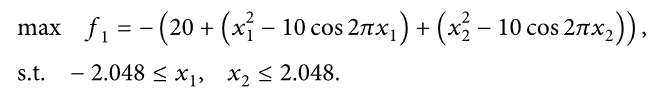

In [48]:
@jit(nopython=True)
def second_de_jong_function(arguments):
    return -1.0 * ( 20 + (np.power(arguments[0], 2) - 10*(np.cos(2*np.pi * arguments[0]))) + (np.power(arguments[1], 2) - 10*(np.cos(2*np.pi * arguments[1]))))

-->Test number 0
Best max solution found is:  [0.03549647 0.08965571]
And function result for this solution is:  -1.8021320791080004
Best min solution found is:  [1.51071365 1.51339383]
And function result for this solution is:  -44.514577857689545
Totally elapsed  9.1597021  seconds


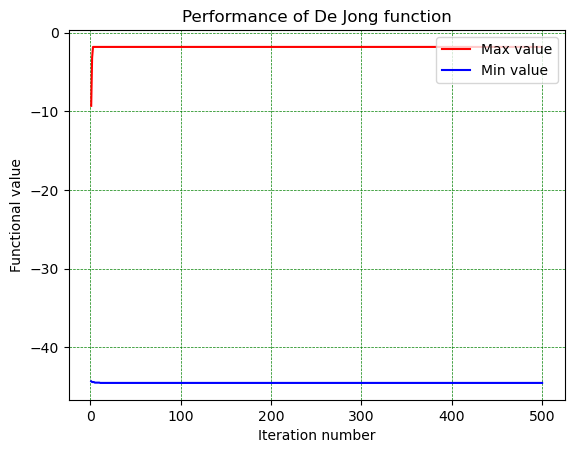

-->Test number 1
Best max solution found is:  [-0.99224221 -0.99178563]
And function result for this solution is:  -1.9933769404060886
Best min solution found is:  [1.50455348 1.50847035]
And function result for this solution is:  -44.52091257473363
Totally elapsed  3.9021402  seconds


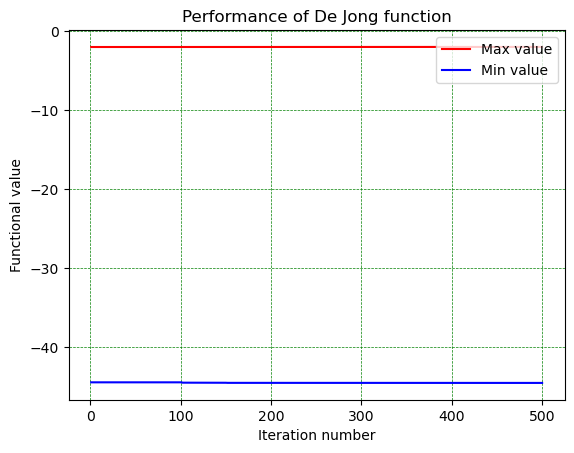

-->Test number 2
Best max solution found is:  [-1.0012159  -0.98945192]
And function result for this solution is:  -2.003694411061417
Best min solution found is:  [1.50929568 1.50951516]
And function result for this solution is:  -44.52169152109548
Totally elapsed  3.8112468  seconds


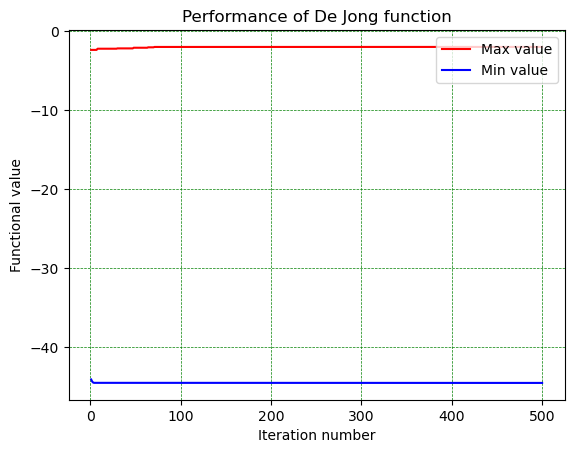

-->Test number 3
Best max solution found is:  [0.07387757 0.00586453]
And function result for this solution is:  -1.0704195177501816
Best min solution found is:  [1.50889061 1.50842402]
And function result for this solution is:  -44.52249101559842
Totally elapsed  4.0638848  seconds


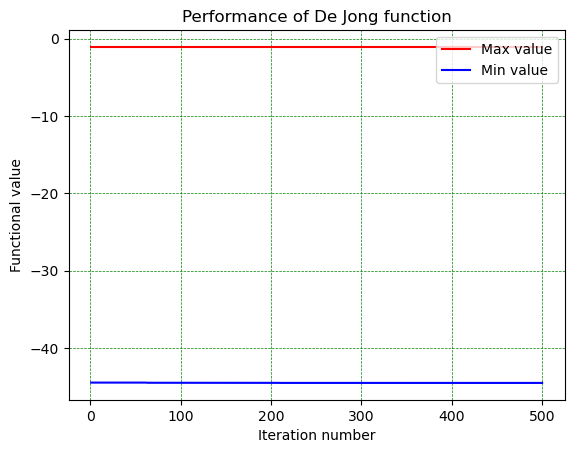

-->Test number 4
Best max solution found is:  [0.00441617 0.99484028]
And function result for this solution is:  -0.9988307382218391
Best min solution found is:  [-1.5014331  -1.50202336]
And function result for this solution is:  -44.509162025728166
Totally elapsed  4.0803515  seconds


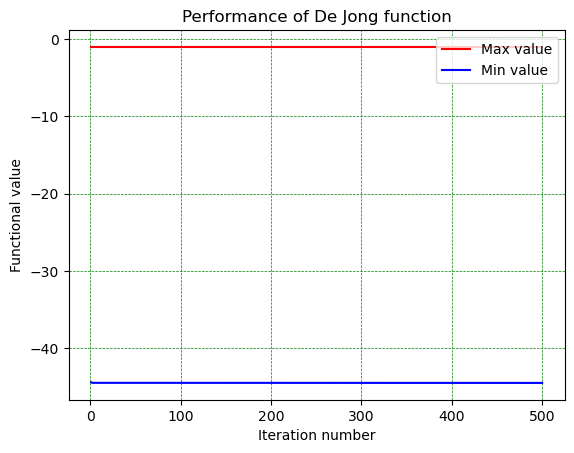

-->Test number 5
Best max solution found is:  [0.09497722 0.02606945]
And function result for this solution is:  -1.871941151684826
Best min solution found is:  [-1.50221929  1.51569084]
And function result for this solution is:  -44.50445025209697
Totally elapsed  3.7309702  seconds


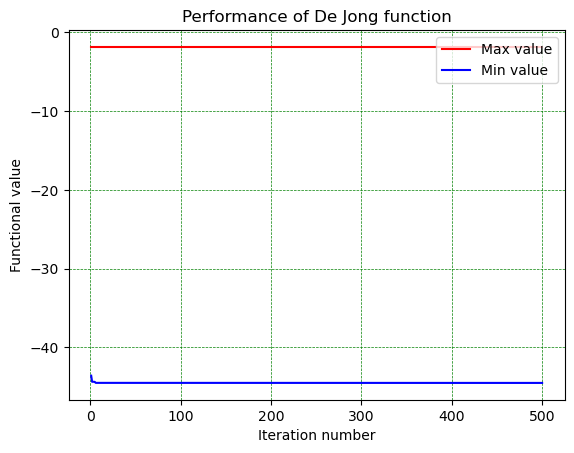

-->Test number 6
Best max solution found is:  [1.03856741 0.02011179]
And function result for this solution is:  -1.4509384461043453
Best min solution found is:  [1.50259327 1.51396411]
And function result for this solution is:  -44.51008036182829
Totally elapsed  3.9193571  seconds


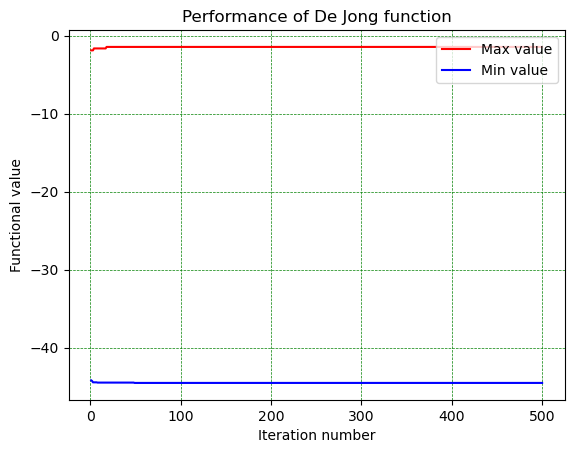

-->Test number 7
Best max solution found is:  [-0.98963392 -0.98551859]
And function result for this solution is:  -2.0131923565249945
Best min solution found is:  [1.50701635 1.50813028]
And function result for this solution is:  -44.52279428013492
Totally elapsed  3.9775662  seconds


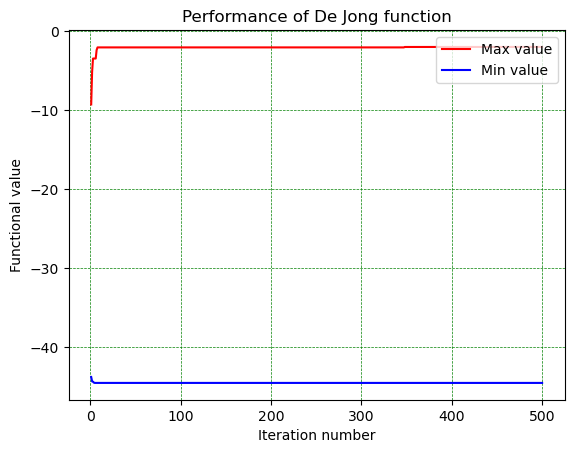

-->Test number 8
Best max solution found is:  [ 0.00516262 -0.01306219]
And function result for this solution is:  -0.039118127870480635
Best min solution found is:  [1.50863874 1.51499957]
And function result for this solution is:  -44.51210941864688
Totally elapsed  4.223486  seconds


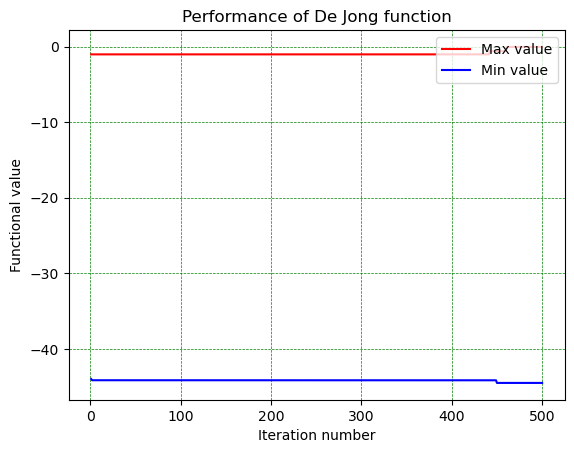

-->Test number 9
Best max solution found is:  [0.05899132 0.00339663]
And function result for this solution is:  -0.6848600492356436
Best min solution found is:  [1.5065743 1.5134349]
And function result for this solution is:  -44.51611352073435
Totally elapsed  3.7302822  seconds


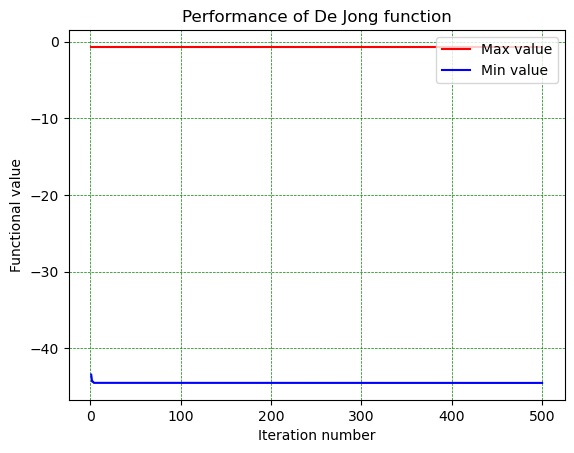

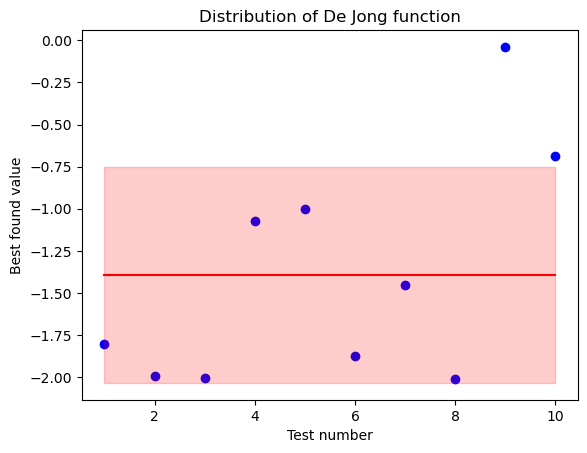

Dispersion is 0.41120549059871375


In [49]:
function_name = "De Jong function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_de_jong_function_python_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_test_furleb_modification(function_name, second_de_jong_function, -2.048, 2.048, 100, 500, 0.4, 0.3, 0.5, draw_graph=True)
    average_de_jong_function_python_time += time_elapsed
    best_values[test_number] = best_value
average_de_jong_function_python_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Тестирование функции Есома

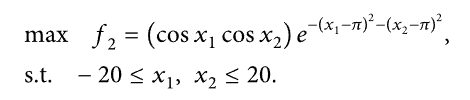

In [58]:
@jit(nopython=True)
def esom_function(arguments):
    return (np.cos(arguments[0]) * np.cos(arguments[1]) * np.exp(
        -1 * np.power((arguments[0] - np.pi), 2) - np.power(
            (arguments[1] - np.pi), 2)))

-->Test number 0
Best max solution found is:  [3.41897279 3.81869065]
And function result for this solution is:  0.43884311163004364
Best min solution found is:  [1.29888416 3.13335385]
And function result for this solution is:  -0.009002024268763459
Totally elapsed  8.3018394  seconds


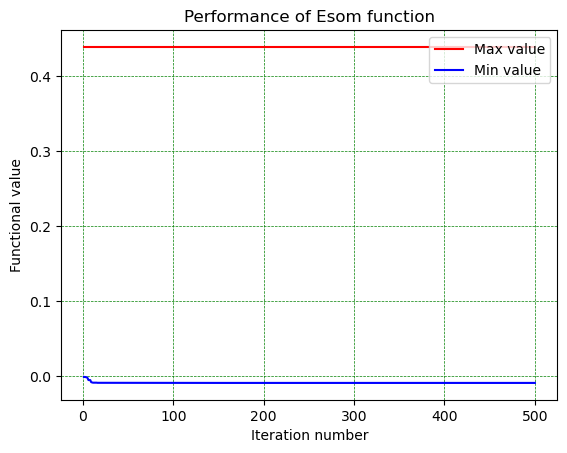

-->Test number 1
Best max solution found is:  [3.51422813 4.48096633]
And function result for this solution is:  0.030920736947525933
Best min solution found is:  [3.14248198 4.98025464]
And function result for this solution is:  -0.00900535226399261
Totally elapsed  3.3502709  seconds


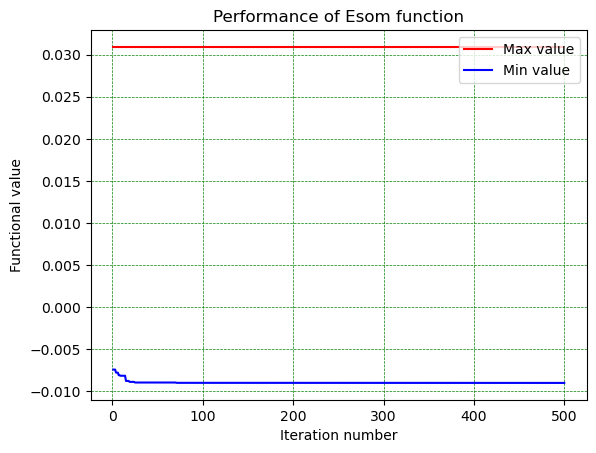

-->Test number 2
Best max solution found is:  [3.38067168 3.12577354]
And function result for this solution is:  0.9172364134837967
Best min solution found is:  [3.15878482 4.97101353]
And function result for this solution is:  -0.008997804029903963
Totally elapsed  3.4262899  seconds


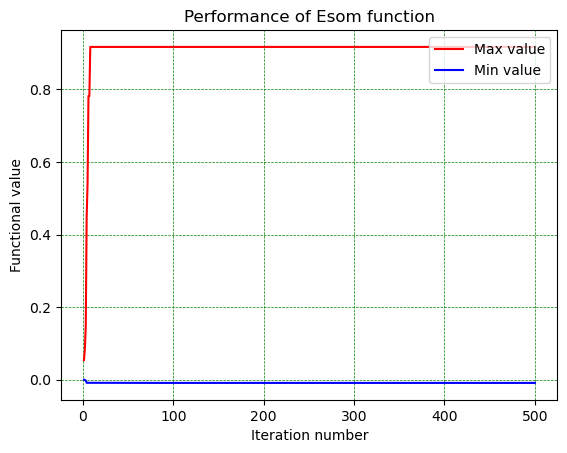

-->Test number 3
Best max solution found is:  [1.31088456 5.72030026]
And function result for this solution is:  9.855404073668232e-06
Best min solution found is:  [1.3047602  3.13650292]
And function result for this solution is:  -0.00900532410311014
Totally elapsed  3.3075408  seconds


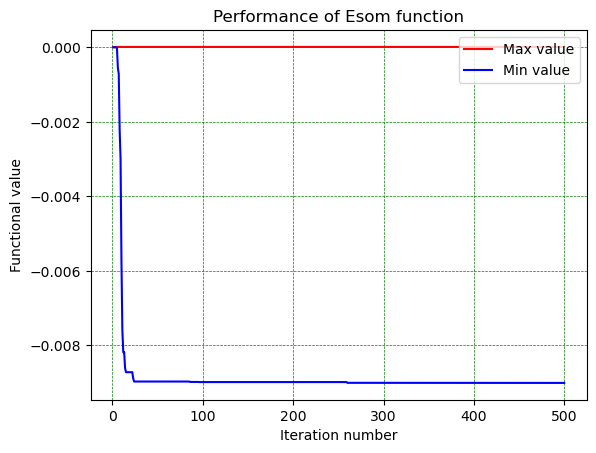

-->Test number 4
Best max solution found is:  [5.71481118 1.38442245]
And function result for this solution is:  9.483569447776133e-06
Best min solution found is:  [4.98401189 3.14827427]
And function result for this solution is:  -0.009002589421177598
Totally elapsed  3.2442837  seconds


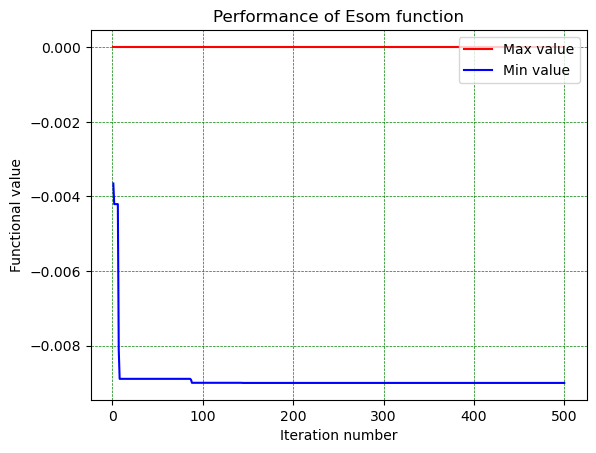

-->Test number 5
Best max solution found is:  [1.39661663 5.76089923]
And function result for this solution is:  7.493145605352741e-06
Best min solution found is:  [3.13570996 1.30477758]
And function result for this solution is:  -0.009005207158905112
Totally elapsed  3.4642788  seconds


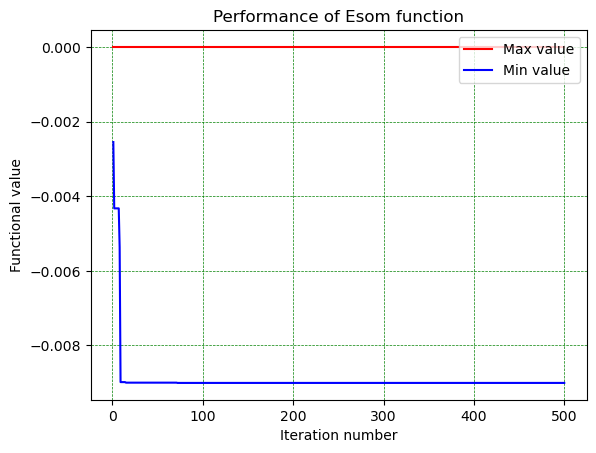

-->Test number 6
Best max solution found is:  [13.86962786 12.59467884]
And function result for this solution is:  4.264103972023885e-90
Best min solution found is:  [3.11927441 5.25114428]
And function result for this solution is:  -0.005986178123800044
Totally elapsed  3.5614346  seconds


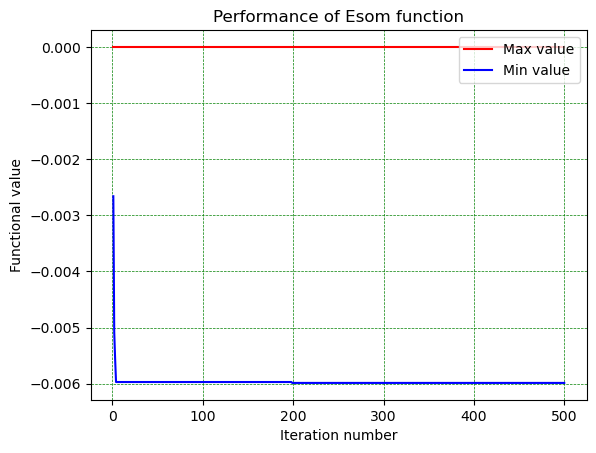

-->Test number 7
Best max solution found is:  [15.47843094 14.75370991]
And function result for this solution is:  1.2335660059133048e-125
Best min solution found is:  [7.63198314 3.17008847]
And function result for this solution is:  -3.8486176820416435e-10
Totally elapsed  3.4050813  seconds


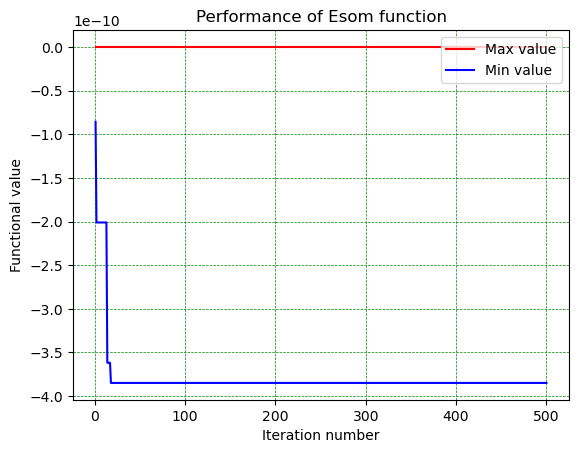

-->Test number 8
Best max solution found is:  [6.51895408 1.33598125]
And function result for this solution is:  9.656772828931231e-08
Best min solution found is:  [4.99496607 3.13840227]
And function result for this solution is:  -0.008985383508304171
Totally elapsed  3.3473177  seconds


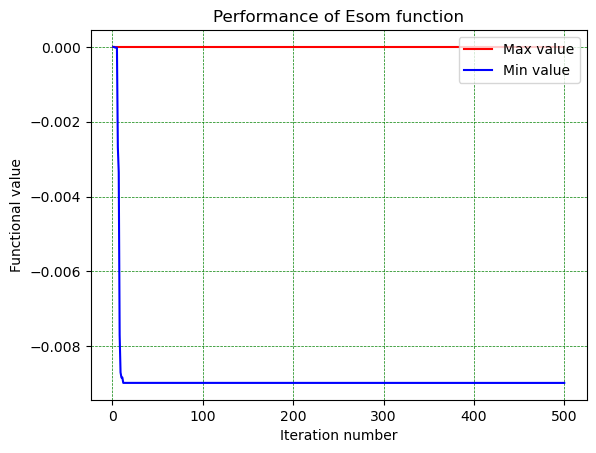

-->Test number 9
Best max solution found is:  [5.07880503 6.67542089]
And function result for this solution is:  2.9285329777460976e-08
Best min solution found is:  [3.14263637 4.97823679]
And function result for this solution is:  -0.009005663269657694
Totally elapsed  3.3734951  seconds


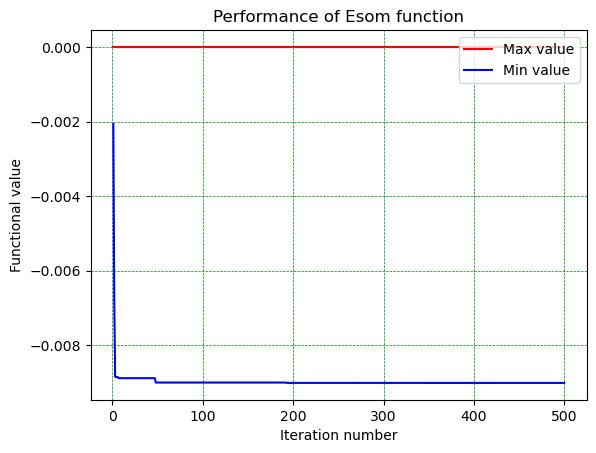

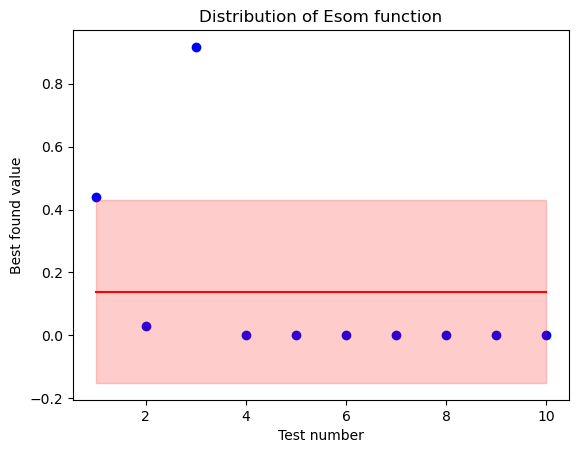

Dispersion is 0.08424775561509598


In [61]:
function_name = "Esom function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_esom_function_python_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_test_furleb_modification(function_name, esom_function, -20.0, 20.0, 100, 500, 0.4, 0.3, 0.5, draw_graph=True)
    average_esom_function_python_time += time_elapsed
    best_values[test_number] = best_value
average_esom_function_python_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Прерывистый тест

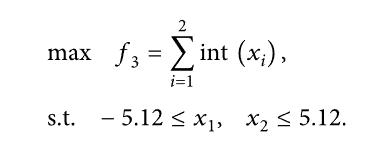

In [50]:
@jit(nopython=True)
def discontinuous_test(arguments):
    return int(arguments[0]) + int(arguments[1])

-->Test number 0
Best max solution found is:  [5.12 5.12]
And function result for this solution is:  10
Best min solution found is:  [-5.12 -5.12]
And function result for this solution is:  -10
Totally elapsed  8.7844794  seconds


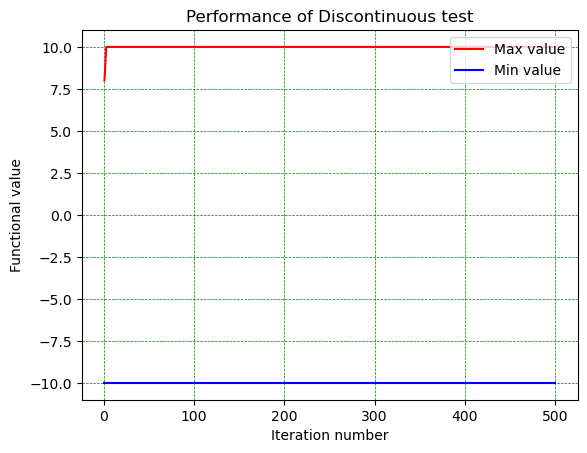

-->Test number 1
Best max solution found is:  [5.04933954 5.12      ]
And function result for this solution is:  10
Best min solution found is:  [-5.12 -5.12]
And function result for this solution is:  -10
Totally elapsed  2.7700724  seconds


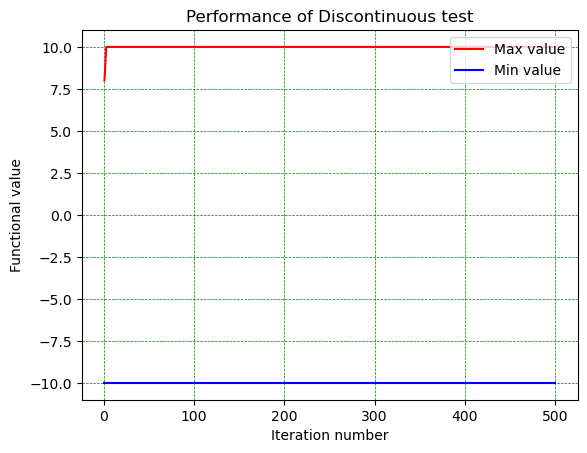

-->Test number 2
Best max solution found is:  [2.91165817 1.99647536]
And function result for this solution is:  3
Best min solution found is:  [-5.12 -5.12]
And function result for this solution is:  -10
Totally elapsed  2.7792111  seconds


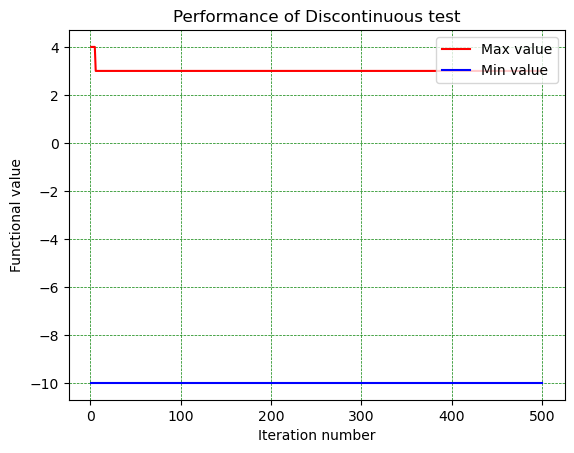

-->Test number 3
Best max solution found is:  [4.16143942 4.5812511 ]
And function result for this solution is:  8
Best min solution found is:  [-5.12 -5.12]
And function result for this solution is:  -10
Totally elapsed  2.9516509  seconds


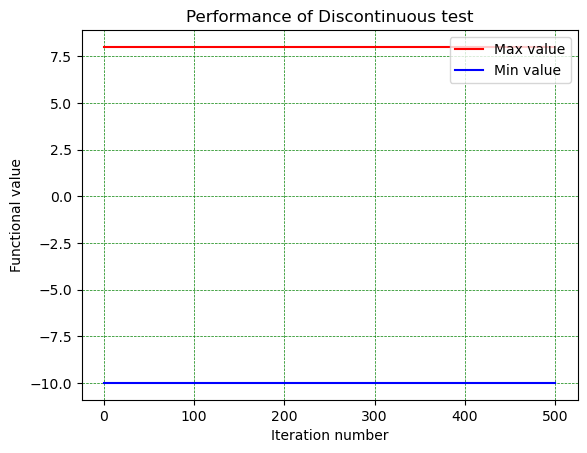

-->Test number 4
Best max solution found is:  [5.12 5.12]
And function result for this solution is:  10
Best min solution found is:  [-5.12 -5.12]
And function result for this solution is:  -10
Totally elapsed  2.7387278  seconds


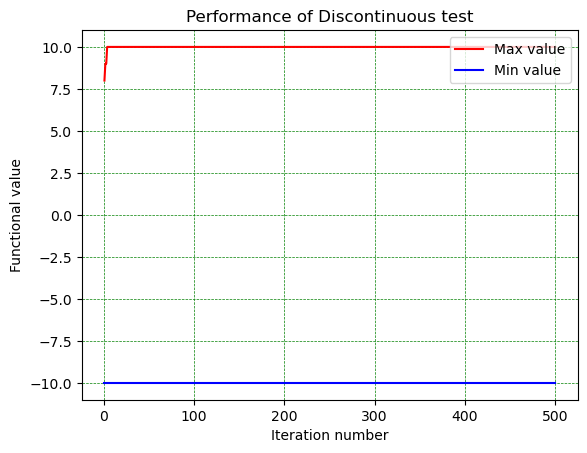

-->Test number 5
Best max solution found is:  [5.12 5.12]
And function result for this solution is:  10
Best min solution found is:  [-5.12 -5.12]
And function result for this solution is:  -10
Totally elapsed  2.8216586  seconds


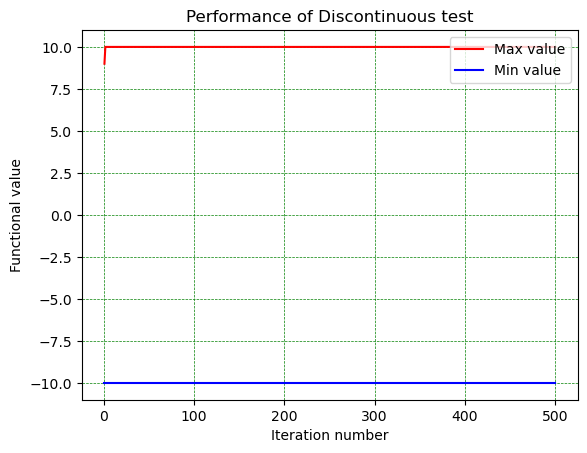

-->Test number 6
Best max solution found is:  [5.12 5.12]
And function result for this solution is:  10
Best min solution found is:  [-5.12 -5.12]
And function result for this solution is:  -10
Totally elapsed  2.8649667  seconds


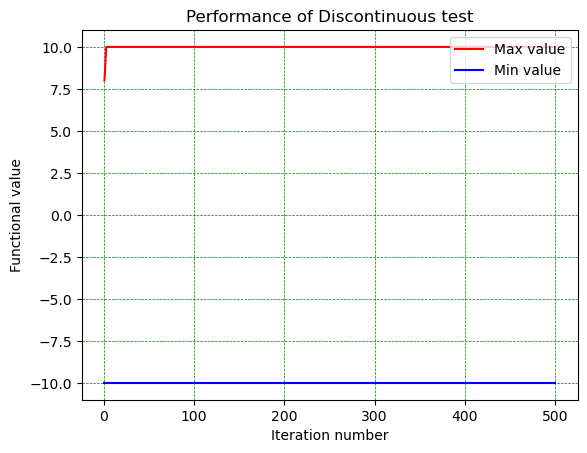

-->Test number 7
Best max solution found is:  [3.92835021 3.97240925]
And function result for this solution is:  6
Best min solution found is:  [-5.12 -5.12]
And function result for this solution is:  -10
Totally elapsed  2.9323225  seconds


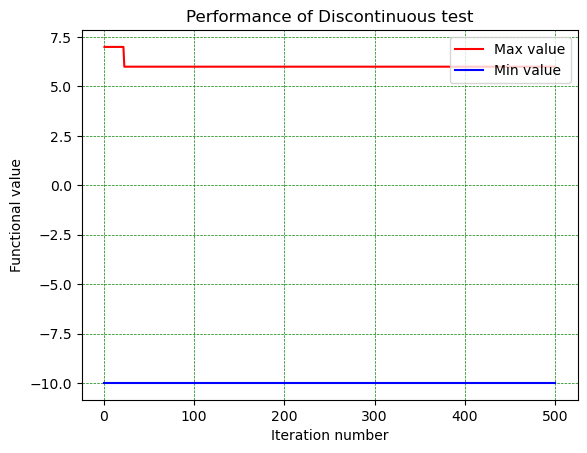

-->Test number 8
Best max solution found is:  [5.00936201 4.34338434]
And function result for this solution is:  9
Best min solution found is:  [-5.12 -5.12]
And function result for this solution is:  -10
Totally elapsed  2.9101444  seconds


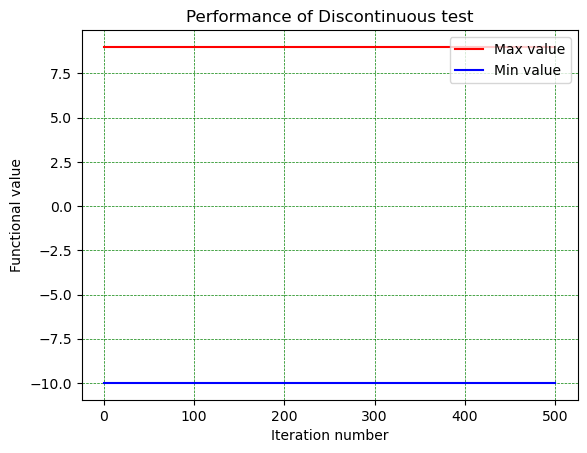

-->Test number 9
Best max solution found is:  [2.99880338 3.95862987]
And function result for this solution is:  5
Best min solution found is:  [-5.12 -5.12]
And function result for this solution is:  -10
Totally elapsed  2.8491275  seconds


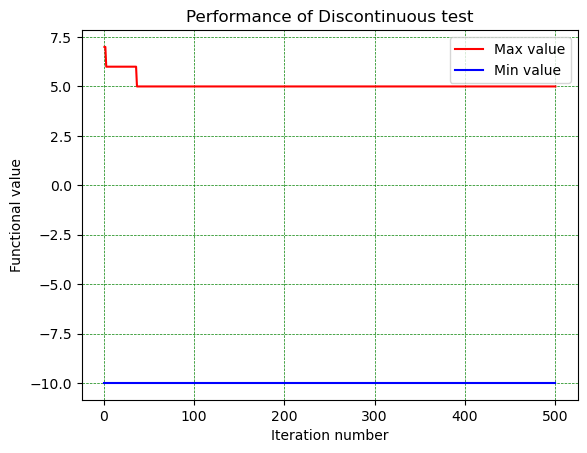

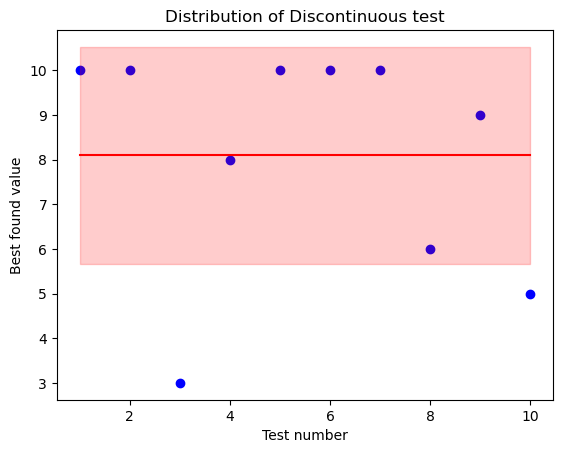

Dispersion is 5.890000000000001


In [51]:
function_name = "Discontinuous test"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_discontinuous_test_python_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_test_furleb_modification(function_name, discontinuous_test, -5.12, 5.12, 100, 500, 0.4, 0.3, 0.5, draw_graph=True)
    average_discontinuous_test_python_time += time_elapsed
    best_values[test_number] = best_value
average_discontinuous_test_python_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Тестирование функции Мишры

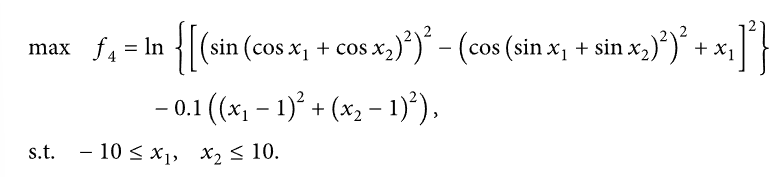

In [64]:
@jit(nopython=True)
def mishra_function(arguments):
    return np.log(
        np.power((
                np.power(np.sin(
                    np.power((np.cos(arguments[0]) + np.cos(arguments[1])), 2)),
                    2) - np.power(
            np.cos(np.power((np.sin(arguments[0]) + np.sin(arguments[1])), 2)),
            2) + arguments[0]
        ), 2)
    ) - 0.1 * (np.power(arguments[0] - 1, 2) + np.power(arguments[1] - 1, 2))

-->Test number 0
Best max solution found is:  [2.92506592 1.6054947 ]
And function result for this solution is:  2.179126713612831
Best min solution found is:  [-10. -10.]
And function result for this solution is:  -19.586807012462604
Totally elapsed  9.2005631  seconds


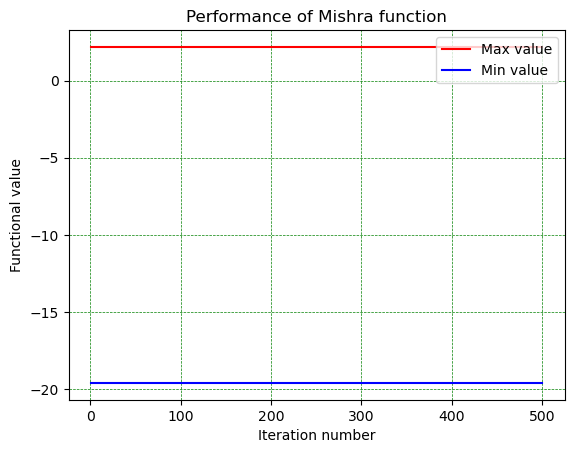

-->Test number 1
Best max solution found is:  [2.87396063 1.78830977]
And function result for this solution is:  2.2785020799289994
Best min solution found is:  [ 0.72606574 -9.50020131]
And function result for this solution is:  -30.729031418385823
Totally elapsed  3.4951004  seconds


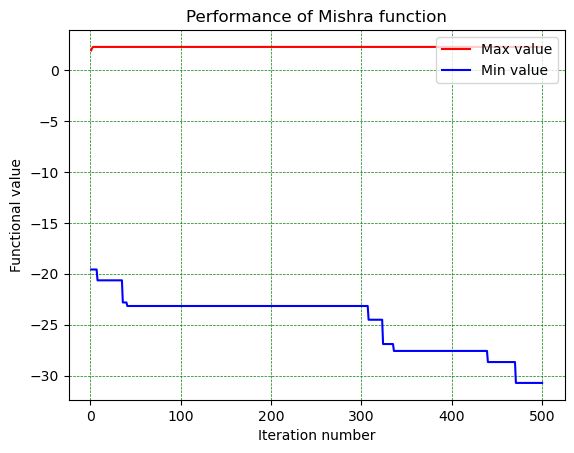

-->Test number 2
Best max solution found is:  [2.99257244 1.69474171]
And function result for this solution is:  2.2325133296534787
Best min solution found is:  [ 0.7237607  -9.50371262]
And function result for this solution is:  -32.220410752456324
Totally elapsed  3.5588033  seconds


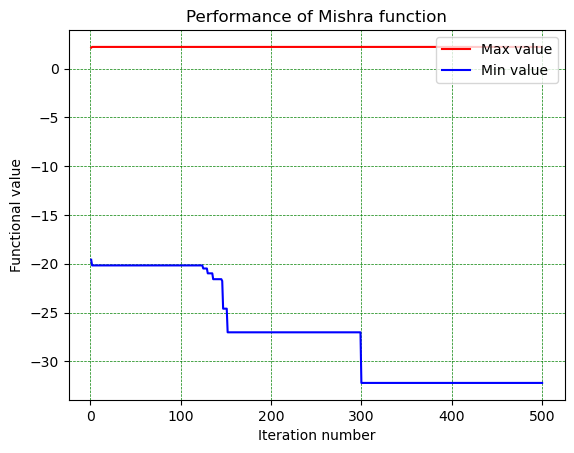

-->Test number 3
Best max solution found is:  [2.86576578 1.88518747]
And function result for this solution is:  2.273921103853926
Best min solution found is:  [ 0.57655013 -9.28891499]
And function result for this solution is:  -26.66419803112912
Totally elapsed  3.3840654  seconds


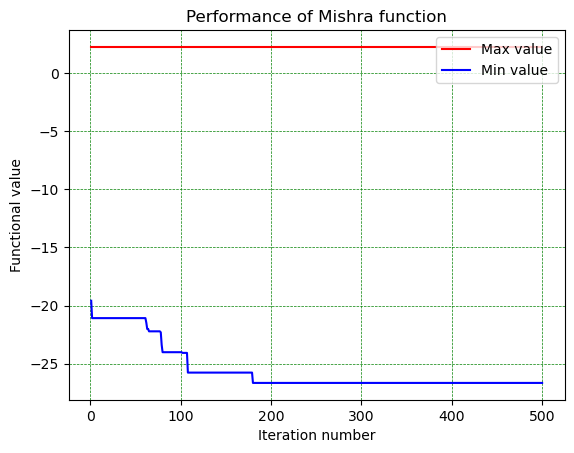

-->Test number 4
Best max solution found is:  [2.46750633 2.16330982]
And function result for this solution is:  1.9451196763620355
Best min solution found is:  [ 0.96837726 -8.96294143]
And function result for this solution is:  -25.851707960656405
Totally elapsed  3.7043944  seconds


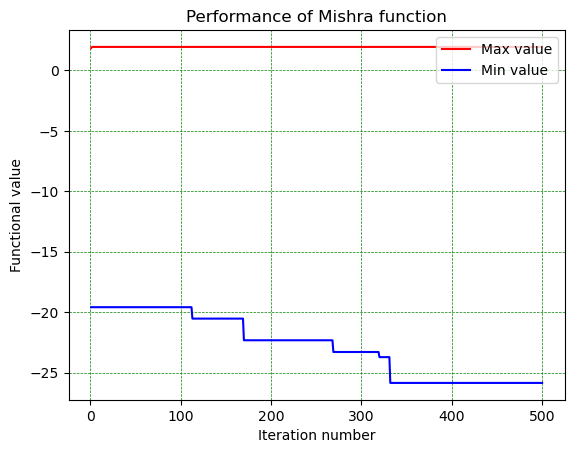

-->Test number 5
Best max solution found is:  [2.9324937  1.87589484]
And function result for this solution is:  2.26146600406815
Best min solution found is:  [ 0.87084494 -9.2482722 ]
And function result for this solution is:  -33.78677640153457
Totally elapsed  3.4787025  seconds


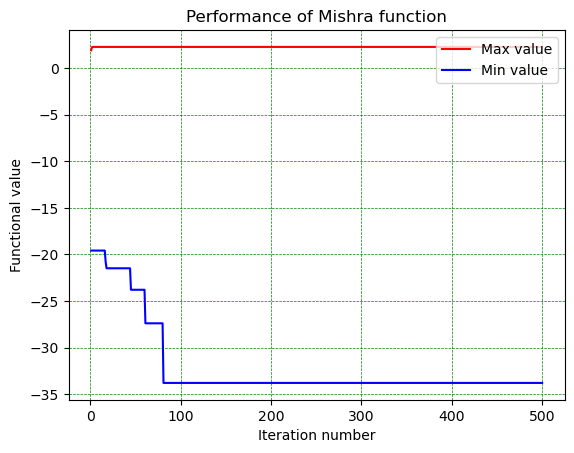

-->Test number 6
Best max solution found is:  [2.19039387 2.56989097]
And function result for this solution is:  1.7631615683241297
Best min solution found is:  [-10. -10.]
And function result for this solution is:  -19.586807012462604
Totally elapsed  3.5920242  seconds


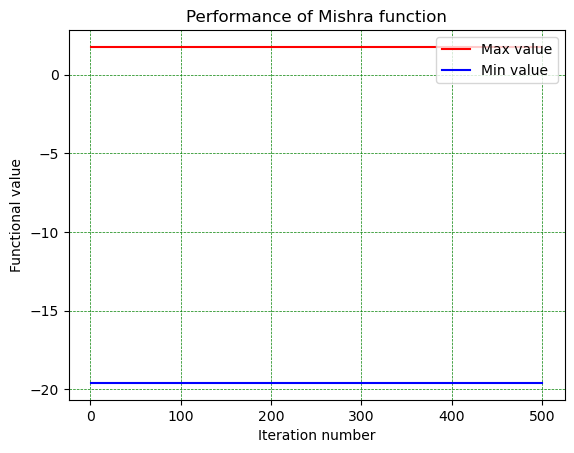

-->Test number 7
Best max solution found is:  [2.61518058 2.09229766]
And function result for this solution is:  2.0938461303439015
Best min solution found is:  [ 0.84569606 -9.29876444]
And function result for this solution is:  -26.46306966933853
Totally elapsed  3.4731965  seconds


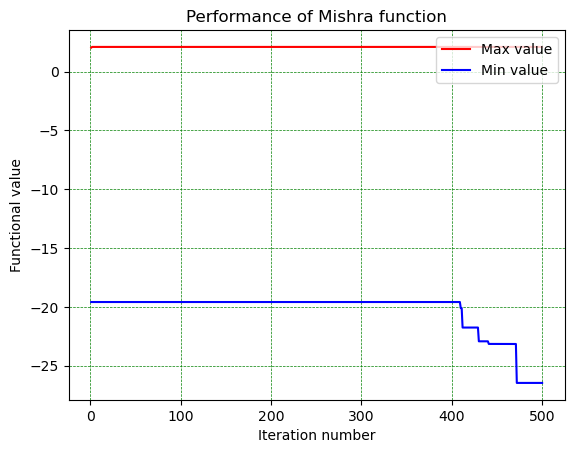

-->Test number 8
Best max solution found is:  [4.56642394 2.93034673]
And function result for this solution is:  1.492694481005763
Best min solution found is:  [0.72568911 9.34898048]
And function result for this solution is:  -23.81295272325782
Totally elapsed  3.4079851  seconds


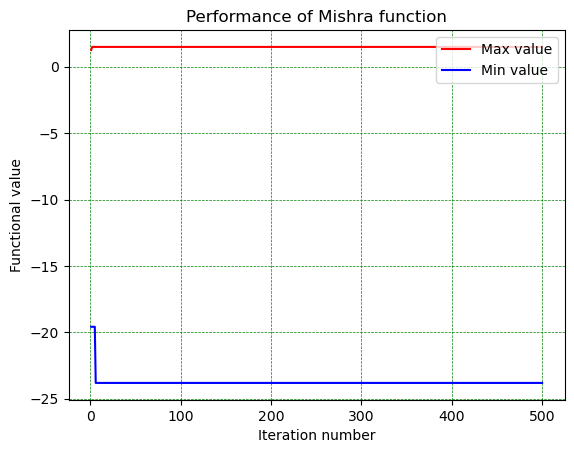

-->Test number 9
Best max solution found is:  [2.77057604 1.92053445]
And function result for this solution is:  2.2464877717616707
Best min solution found is:  [ 0.88052467 -9.22773219]
And function result for this solution is:  -30.414560302975723
Totally elapsed  3.5293117  seconds


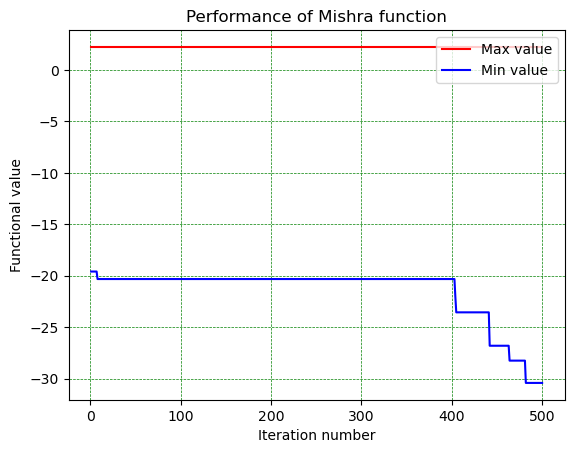

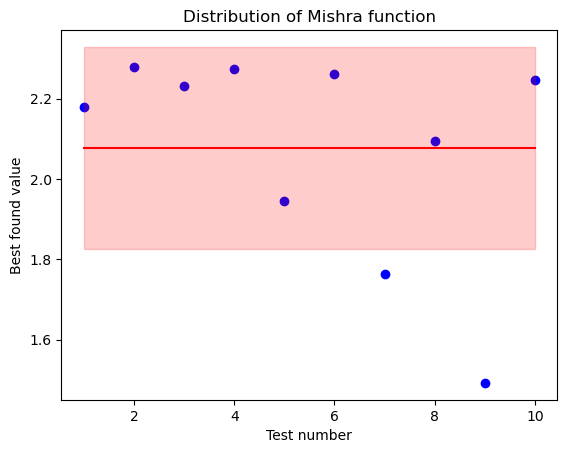

Dispersion is 0.06343317954386538


In [52]:
function_name = "Mishra function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_mishra_function_python_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_test_furleb_modification(function_name, mishra_function, -10.0, 10.0, 100, 500, 0.4, 0.3, 0.5, draw_graph=True)
    average_mishra_function_python_time += time_elapsed
    best_values[test_number] = best_value
average_mishra_function_python_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Стохастический тест

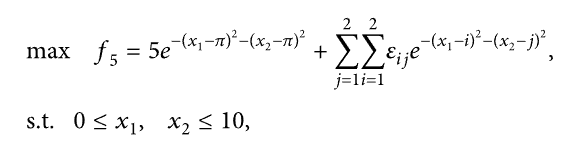

In [66]:
@jit(nopython=True)
def stochastic_test(arguments):
    return 5 * np.exp(-1*np.power((arguments[0] - np.pi), 2) - np.power((arguments[1] - np.pi), 2)) + sum([np.random.rand() * np.exp(-1*np.power((arguments[0] - i), 2) - np.power((arguments[1] - j), 2)) for i in range(2) for j in range(2)])

-->Test number 0
Best max solution found is:  [3.14230541 3.13850675]
And function result for this solution is:  5.000008306272825
Best min solution found is:  [10. 10.]
And function result for this solution is:  6.958222589098276e-41
Totally elapsed  7.8937162  seconds


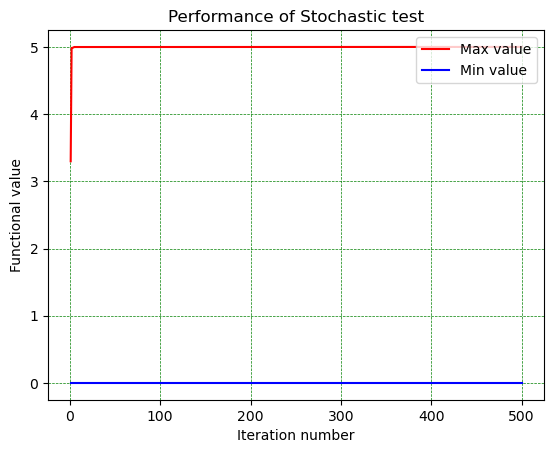

-->Test number 1
Best max solution found is:  [3.13903069 3.14044272]
And function result for this solution is:  4.999996307110135
Best min solution found is:  [10. 10.]
And function result for this solution is:  6.958222589098276e-41
Totally elapsed  2.2597785  seconds


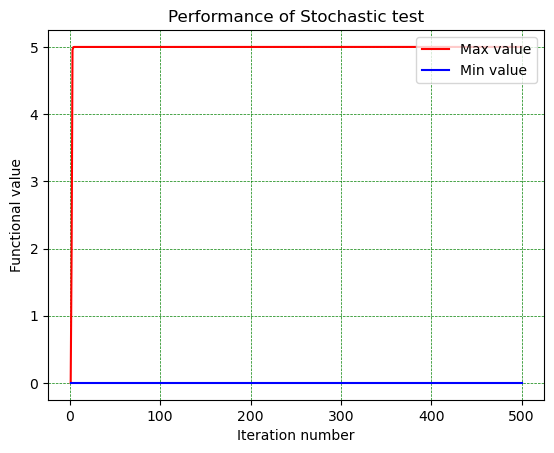

-->Test number 2
Best max solution found is:  [3.14301007 3.141163  ]
And function result for this solution is:  5.000019625024328
Best min solution found is:  [10. 10.]
And function result for this solution is:  6.958222589098276e-41
Totally elapsed  2.1950818  seconds


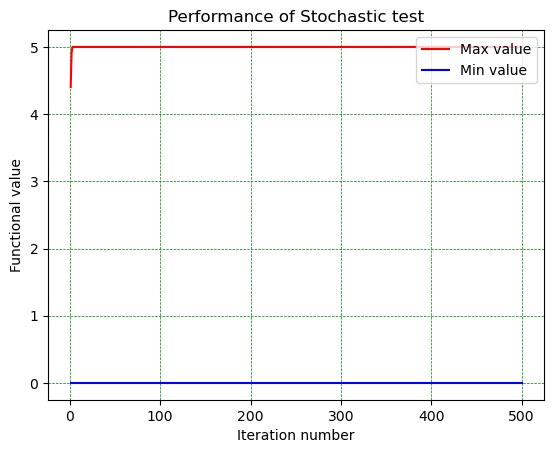

-->Test number 3
Best max solution found is:  [3.14015164 3.1414825 ]
And function result for this solution is:  5.0000942619971696
Best min solution found is:  [10. 10.]
And function result for this solution is:  6.958222589098276e-41
Totally elapsed  2.3189512  seconds


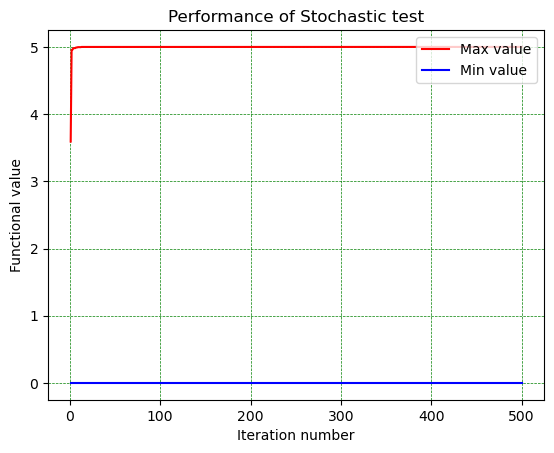

-->Test number 4
Best max solution found is:  [3.14365302 3.14290262]
And function result for this solution is:  4.99998115903569
Best min solution found is:  [10. 10.]
And function result for this solution is:  6.958222589098276e-41
Totally elapsed  2.2342048  seconds


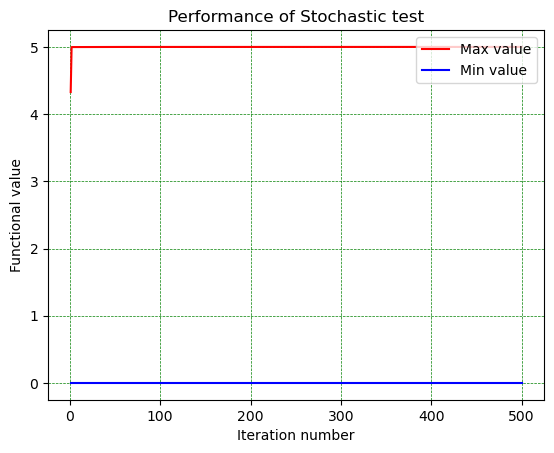

-->Test number 5
Best max solution found is:  [3.13922918 3.14005981]
And function result for this solution is:  5.0000238356645434
Best min solution found is:  [10. 10.]
And function result for this solution is:  6.958222589098276e-41
Totally elapsed  2.1898499  seconds


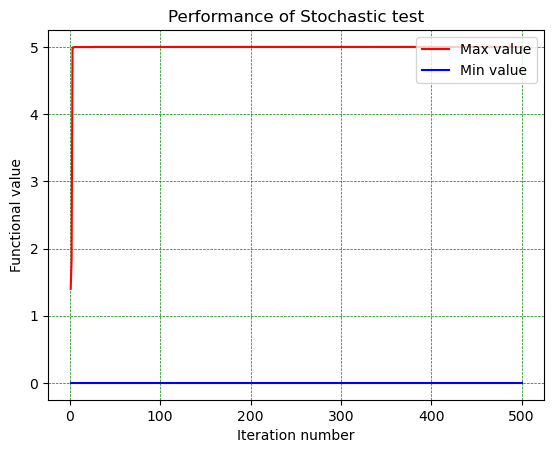

-->Test number 6
Best max solution found is:  [3.14147448 3.14249946]
And function result for this solution is:  5.0000471902823405
Best min solution found is:  [10. 10.]
And function result for this solution is:  6.958222589098276e-41
Totally elapsed  2.2510871  seconds


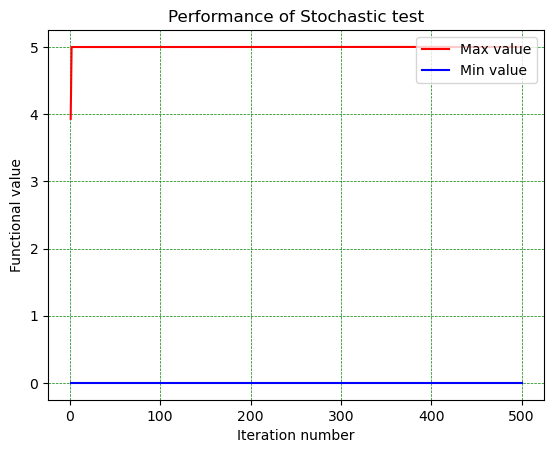

-->Test number 7
Best max solution found is:  [3.14435046 3.1420075 ]
And function result for this solution is:  4.9999756054826285
Best min solution found is:  [10. 10.]
And function result for this solution is:  6.958222589098276e-41
Totally elapsed  2.3629025  seconds


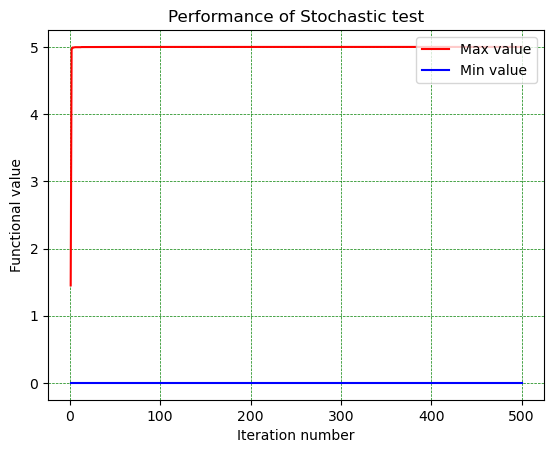

-->Test number 8
Best max solution found is:  [3.14391299 3.14010389]
And function result for this solution is:  4.9999927279378475
Best min solution found is:  [10. 10.]
And function result for this solution is:  6.958222589098276e-41
Totally elapsed  2.2707694  seconds


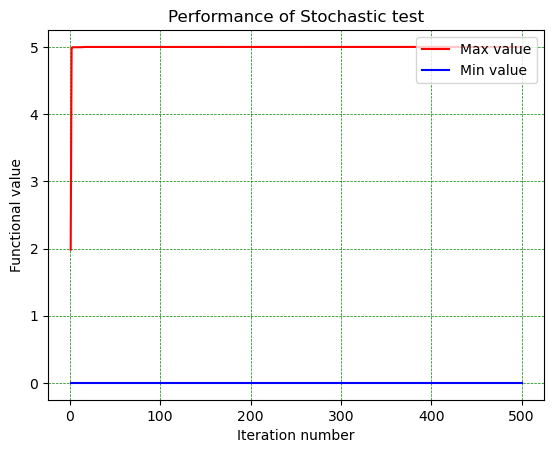

-->Test number 9
Best max solution found is:  [3.14369854 3.14276146]
And function result for this solution is:  5.000049138837604
Best min solution found is:  [10. 10.]
And function result for this solution is:  6.958222589098276e-41
Totally elapsed  2.1999931  seconds


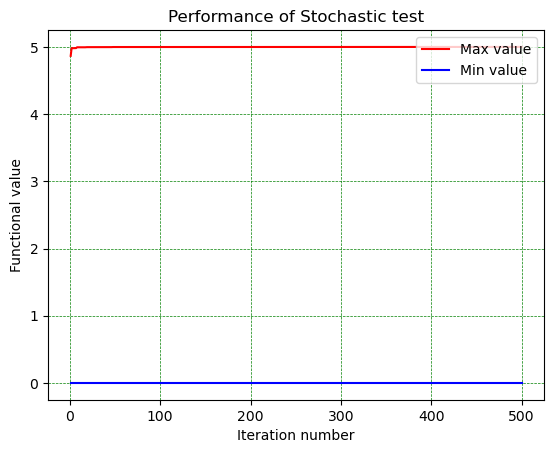

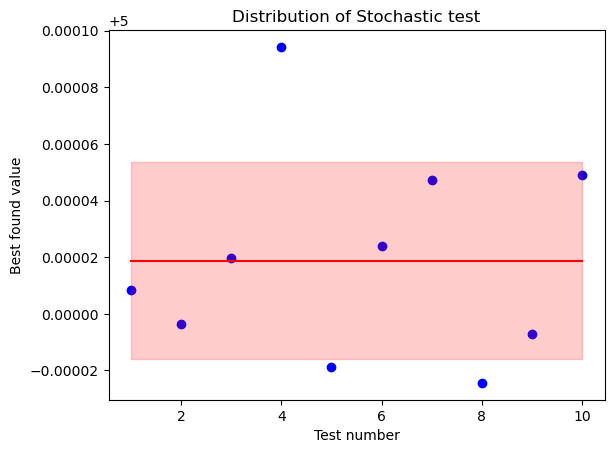

Dispersion is 1.2025411667196998e-09


In [67]:
function_name = "Stochastic test"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_stochastic_test_python_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_test_furleb_modification(function_name, stochastic_test, 0.0, 10.0, 100, 500, 0.4, 0.3, 0.5, draw_graph=True)
    average_stochastic_test_python_time += time_elapsed
    best_values[test_number] = best_value
average_stochastic_test_python_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Тестирование функции Стеблинского

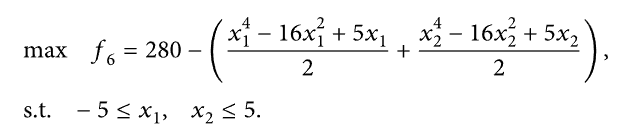

In [68]:
@jit(nopython=True)
def styblinski_function(arguments):
    return 280 - ((arguments[0] ** 4 - 16 * arguments[0] ** 2 + 5 * arguments[
        0]) / 2 + (arguments[1] ** 4 - 16 * arguments[1] ** 2 + 5 * arguments[
        1]) / 2)

-->Test number 0
Best max solution found is:  [-2.8681338  -2.88419047]
And function result for this solution is:  358.30449084023786
Best min solution found is:  [5. 5.]
And function result for this solution is:  30.0
Totally elapsed  6.8531894  seconds


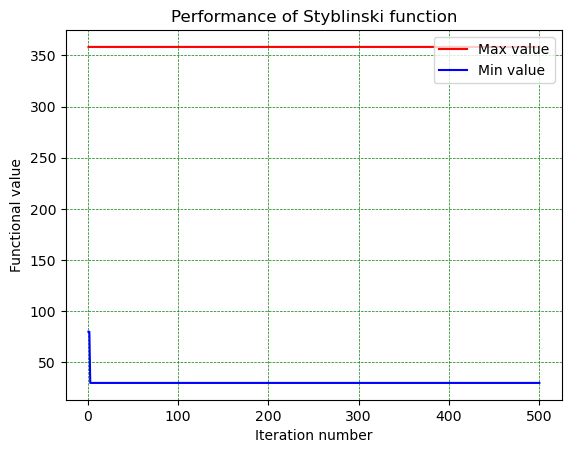

-->Test number 1
Best max solution found is:  [-2.8680412  -2.90140951]
And function result for this solution is:  358.310729426423
Best min solution found is:  [5. 5.]
And function result for this solution is:  30.0
Totally elapsed  2.5711854  seconds


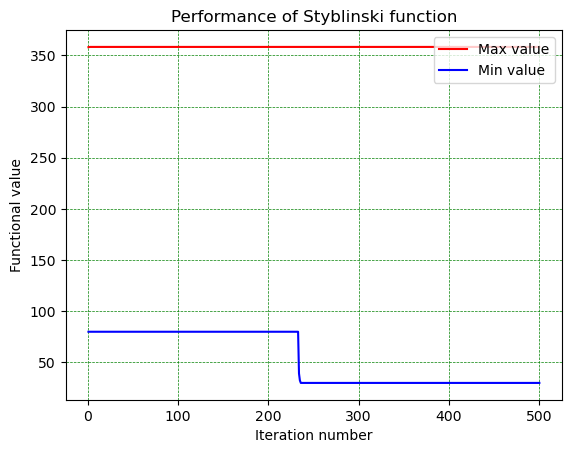

-->Test number 2
Best max solution found is:  [-2.90037355 -2.89815393]
And function result for this solution is:  358.3316592652982
Best min solution found is:  [5. 5.]
And function result for this solution is:  30.0
Totally elapsed  1.3814805  seconds


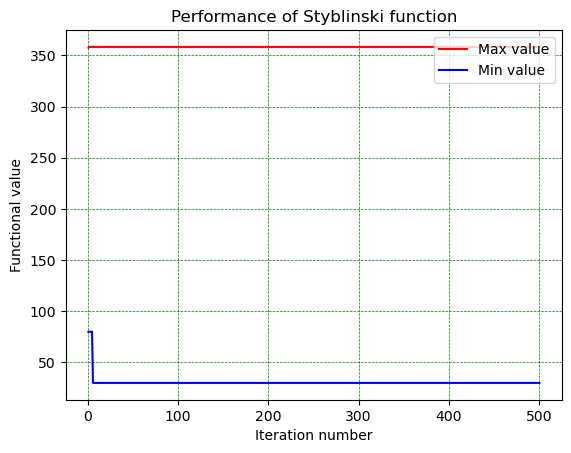

-->Test number 3
Best max solution found is:  [-2.86791967 -2.8974188 ]
And function result for this solution is:  358.3100153395344
Best min solution found is:  [5. 5.]
And function result for this solution is:  30.0
Totally elapsed  1.3816887  seconds


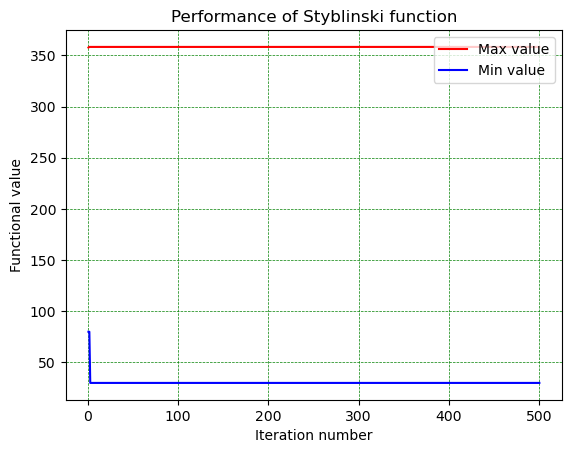

-->Test number 4
Best max solution found is:  [-2.87688353 -2.835331  ]
And function result for this solution is:  358.2415571093527
Best min solution found is:  [5. 5.]
And function result for this solution is:  30.0
Totally elapsed  1.3116542  seconds


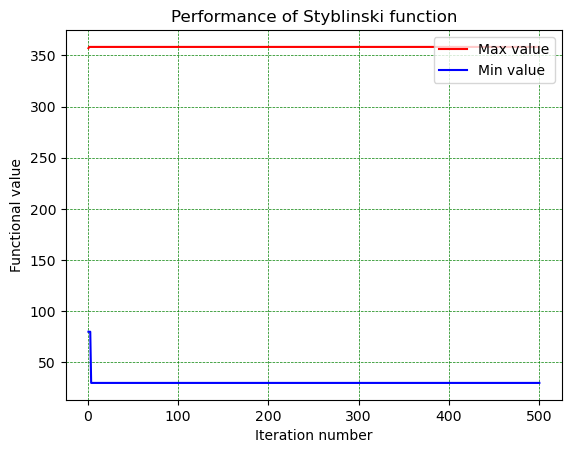

-->Test number 5
Best max solution found is:  [-2.89340197 -2.90220374]
And function result for this solution is:  358.3305317307385
Best min solution found is:  [5. 5.]
And function result for this solution is:  30.0
Totally elapsed  1.2691986  seconds


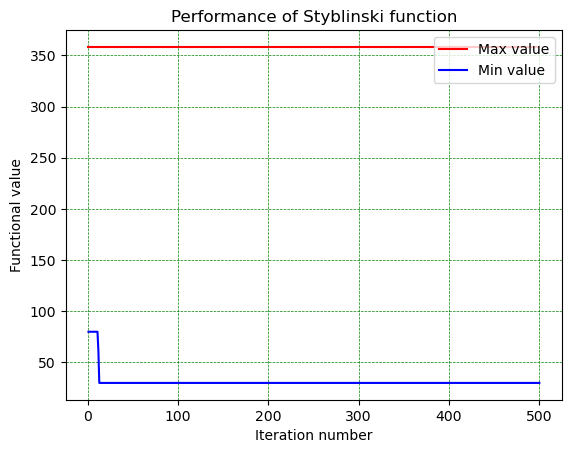

-->Test number 6
Best max solution found is:  [-2.77194306 -2.90145064]
And function result for this solution is:  358.04591550970633
Best min solution found is:  [5. 5.]
And function result for this solution is:  30.0
Totally elapsed  1.3630794  seconds


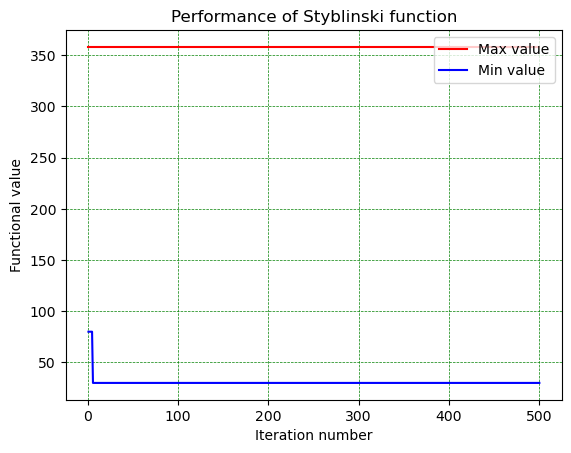

-->Test number 7
Best max solution found is:  [-2.88467593 -2.89761457]
And function result for this solution is:  358.3256162496113
Best min solution found is:  [5. 5.]
And function result for this solution is:  30.0
Totally elapsed  1.3650206  seconds


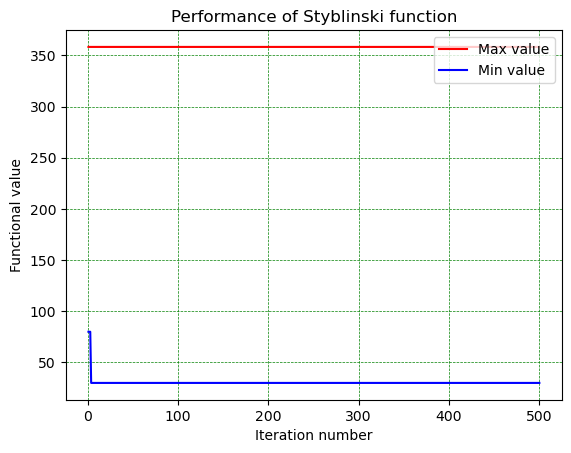

-->Test number 8
Best max solution found is:  [-2.87519052 -2.88262581]
And function result for this solution is:  358.31106600981457
Best min solution found is:  [5. 5.]
And function result for this solution is:  30.0
Totally elapsed  1.3360413  seconds


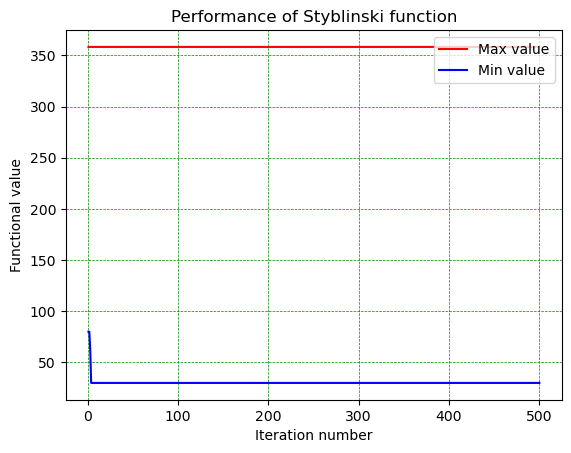

-->Test number 9
Best max solution found is:  [-2.91116527 -2.86274161]
And function result for this solution is:  358.30294115972345
Best min solution found is:  [5. 5.]
And function result for this solution is:  30.0
Totally elapsed  1.4312403  seconds


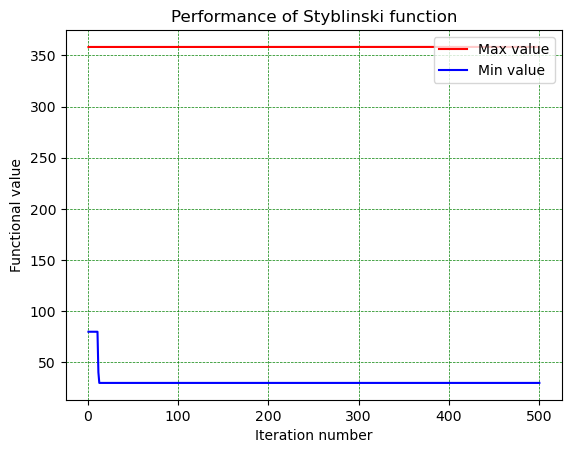

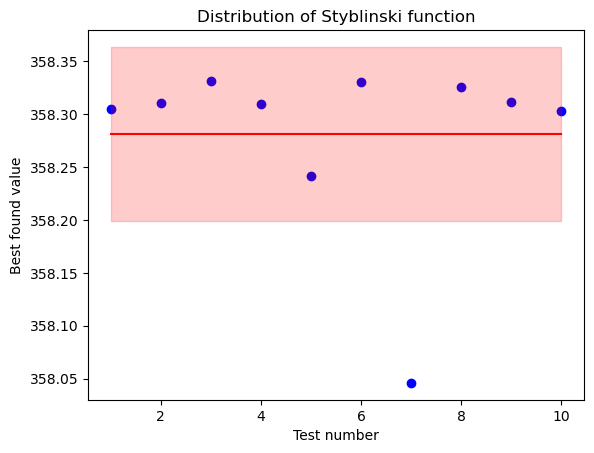

Dispersion is 0.006749170474647388


In [69]:
function_name = "Styblinski function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_styblinski_function_python_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_test_furleb_modification(function_name, styblinski_function, -5.0, 5.0, 100, 500, 0.4, 0.3, 0.5, draw_graph=True)
    average_styblinski_function_python_time += time_elapsed
    best_values[test_number] = best_value
average_styblinski_function_python_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Тестирование функции Шуберта

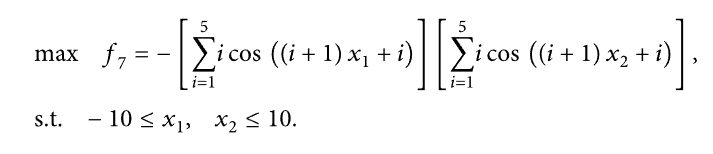

In [70]:
@jit(nopython=True)
def shubert_function(arguments):
    return -1 * sum([i * np.cos((i + 1)*arguments[0] + i) for i in range(1, 6)]) * sum([i * np.cos((i + 1)*arguments[1] + i) for i in range(1, 6)])

-->Test number 0
Best max solution found is:  [-7.0793851  -7.70639535]
And function result for this solution is:  186.6848176784057
Best min solution found is:  [-7.08568649 -0.8005252 ]
And function result for this solution is:  -210.47034800578052
Totally elapsed  11.5367523  seconds


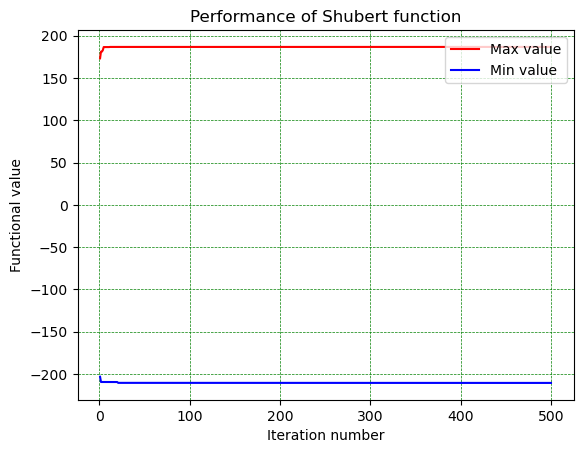

-->Test number 1
Best max solution found is:  [-1.42272757  5.48558034]
And function result for this solution is:  186.70117006188684
Best min solution found is:  [-7.08389726 -7.08488899]
And function result for this solution is:  -210.4771510915564
Totally elapsed  5.6684042  seconds


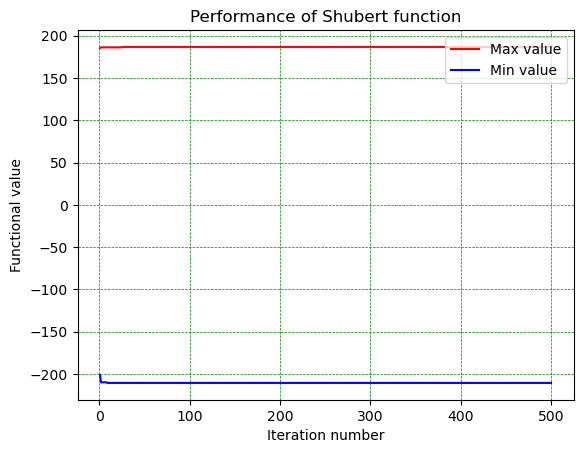

-->Test number 2
Best max solution found is:  [-0.80232308 -1.42566214]
And function result for this solution is:  186.7213858382185
Best min solution found is:  [-7.08362885 -7.08640392]
And function result for this solution is:  -210.46133583139226
Totally elapsed  5.6646989  seconds


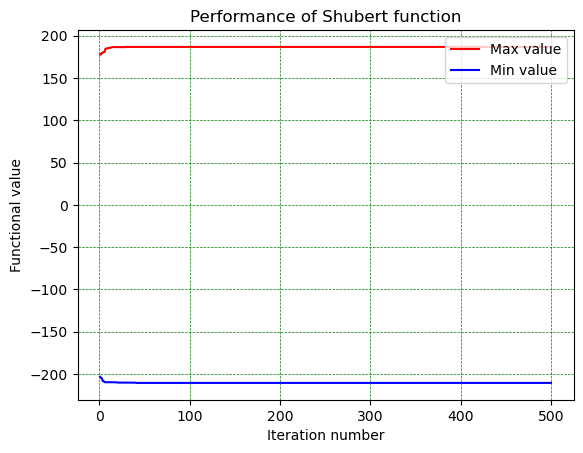

-->Test number 3
Best max solution found is:  [-7.71302902 -7.08104739]
And function result for this solution is:  186.6658114203724
Best min solution found is:  [-0.79691401  5.48324375]
And function result for this solution is:  -210.45303516558516
Totally elapsed  5.7425358  seconds


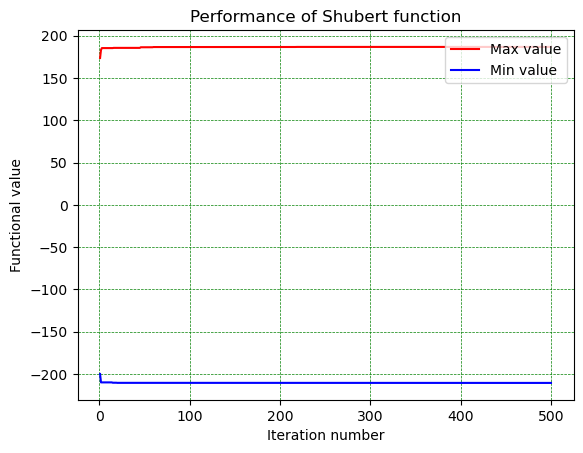

-->Test number 4
Best max solution found is:  [-7.7073421  -7.08332509]
And function result for this solution is:  186.72863518748304
Best min solution found is:  [-7.07984023 -7.08419662]
And function result for this solution is:  -210.44764609898908
Totally elapsed  5.894163  seconds


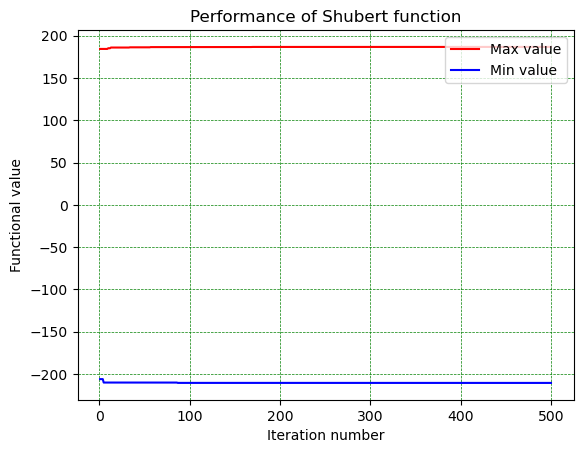

-->Test number 5
Best max solution found is:  [-7.08637954 -7.70538346]
And function result for this solution is:  186.69263207751328
Best min solution found is:  [-7.08454008 -7.08123064]
And function result for this solution is:  -210.46673599984612
Totally elapsed  6.0634524  seconds


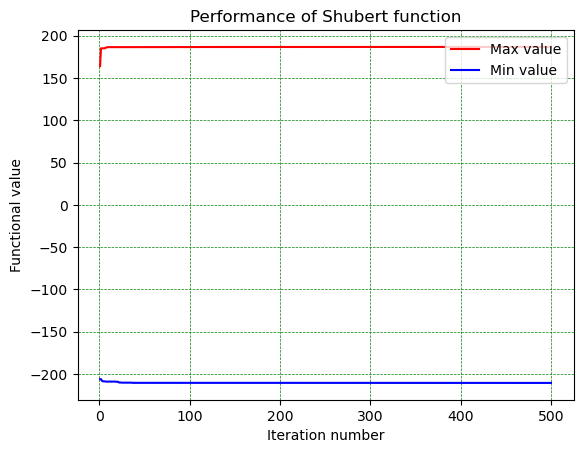

-->Test number 6
Best max solution found is:  [ 4.85446037 -7.08322948]
And function result for this solution is:  186.70062591022253
Best min solution found is:  [-0.80254899 -0.79962975]
And function result for this solution is:  -210.4687362506527
Totally elapsed  6.260079  seconds


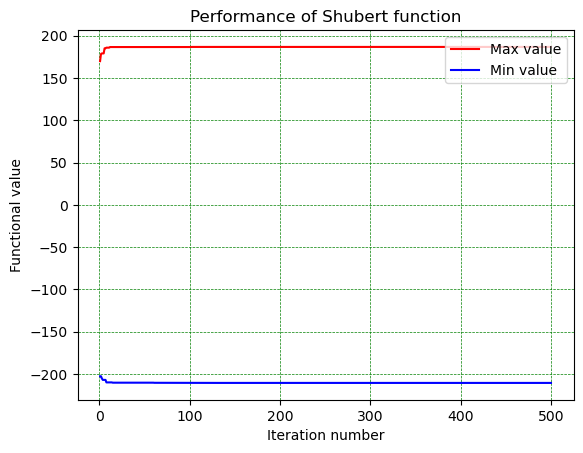

-->Test number 7
Best max solution found is:  [4.85645481 5.48177299]
And function result for this solution is:  186.72229806556265
Best min solution found is:  [-7.08510043 -7.08444097]
And function result for this solution is:  -210.4737876911395
Totally elapsed  6.1725571  seconds


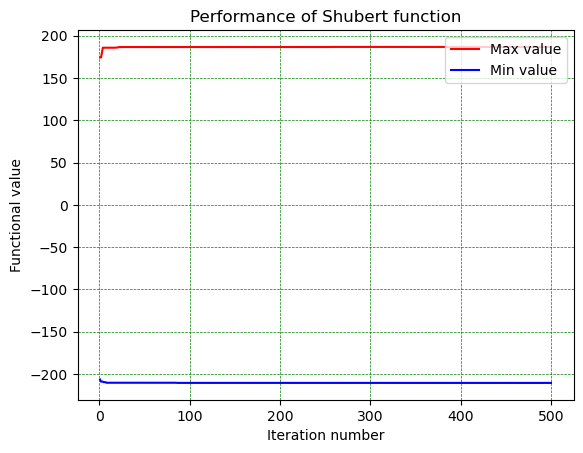

-->Test number 8
Best max solution found is:  [-1.42419095 -0.79813949]
And function result for this solution is:  186.71834587500226
Best min solution found is:  [-7.08177494 -7.08223757]
And function result for this solution is:  -210.47081892695675
Totally elapsed  6.0792171  seconds


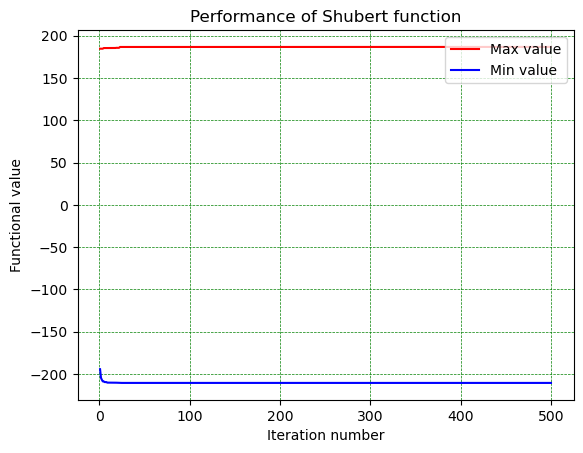

-->Test number 9
Best max solution found is:  [4.86145893 5.48651268]
And function result for this solution is:  186.67451132480568
Best min solution found is:  [-7.08637405 -7.08631124]
And function result for this solution is:  -210.44220049001444
Totally elapsed  6.2486888  seconds


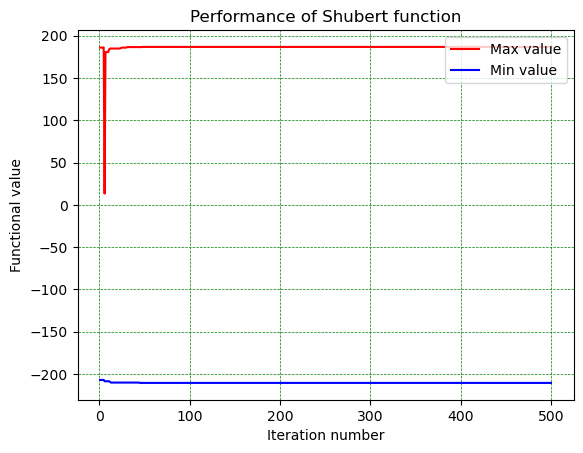

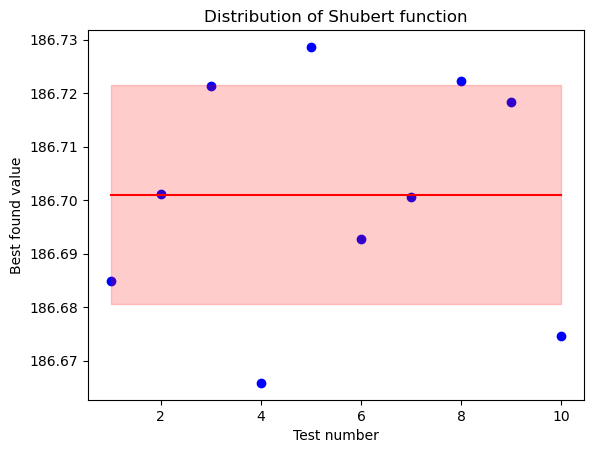

Dispersion is 0.00042057120868910886


In [71]:
function_name = "Shubert function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_shubert_function_python_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_test_furleb_modification(function_name, shubert_function, -10.0, 10.0, 100, 500, 0.4, 0.3, 0.5, draw_graph=True)
    average_shubert_function_python_time += time_elapsed
    best_values[test_number] = best_value
average_shubert_function_python_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

# Сравнительные тесты

## Тестирование функции Де Джонга

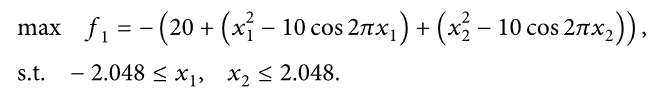

-->Test number 0
Best solution found by original is:  [-0.00522787  0.01917261]
And function result for this solution is:  -0.07826076216420397
Totally elapsed for original  1.8048874  seconds
Best solution found by furleb modification is:  -0.9270312311945919
And function result for this solution is:  [0.00389313 0.06877759]
Totally elapsed for furleb modification  3.561069  seconds


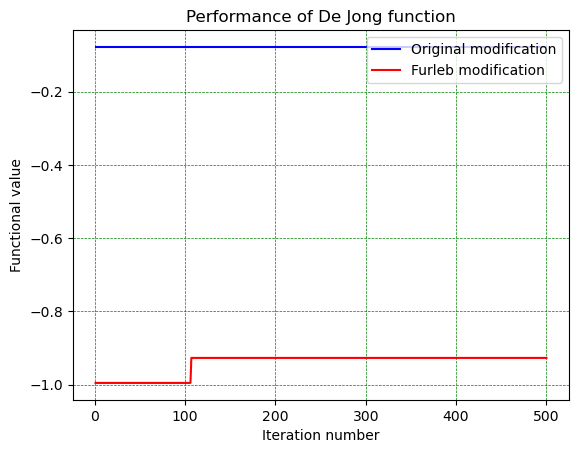

-->Test number 1
Best solution found by original is:  [1.01567163e+00 3.30344898e-05]
And function result for this solution is:  -1.08002941857972
Totally elapsed for original  0.5807271  seconds
Best solution found by furleb modification is:  -0.9994548747695706
And function result for this solution is:  [-0.99664588  0.00445162]
Totally elapsed for furleb modification  3.8803504  seconds


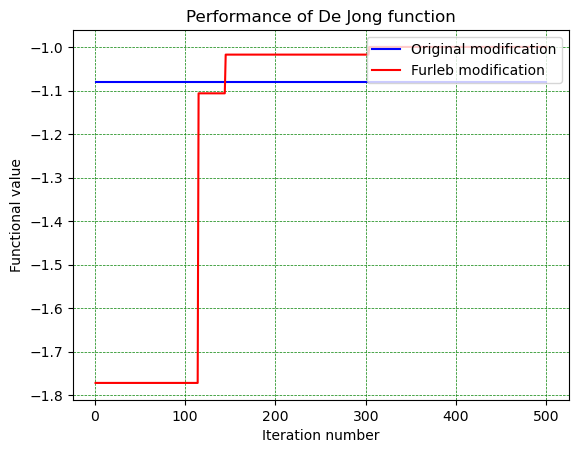

-->Test number 2
Best solution found by original is:  [0.01548764 0.01334263]
And function result for this solution is:  -0.0828486896181726
Totally elapsed for original  0.0797317  seconds
Best solution found by furleb modification is:  -0.5058903121381153
And function result for this solution is:  [0.01693296 0.04775424]
Totally elapsed for furleb modification  3.3053038  seconds


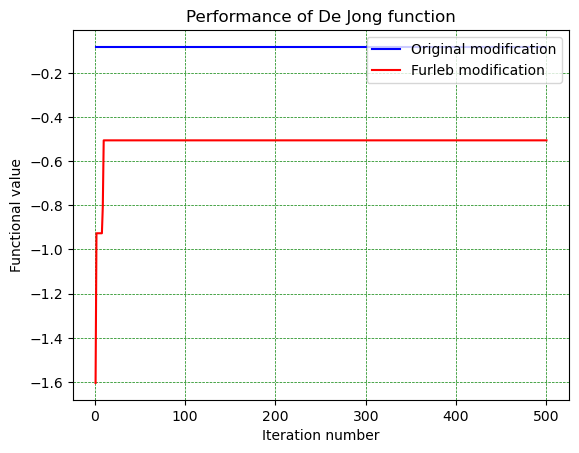

-->Test number 3
Best solution found by original is:  [0.02808879 0.06558877]
And function result for this solution is:  -0.9976338670306077
Totally elapsed for original  0.3289485  seconds
Best solution found by furleb modification is:  -1.1578152537087423
And function result for this solution is:  [1.00229007 0.0277322 ]
Totally elapsed for furleb modification  4.3021394  seconds


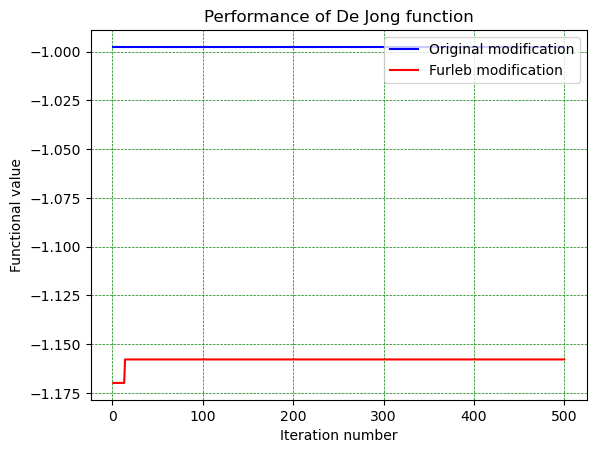

-->Test number 4
Best solution found by original is:  [-0.00632235  0.035217  ]
And function result for this solution is:  -0.25298507575194407
Totally elapsed for original  0.1463646  seconds
Best solution found by furleb modification is:  -1.11514312794149
And function result for this solution is:  [ 0.01566474 -0.97594114]
Totally elapsed for furleb modification  3.9033997  seconds


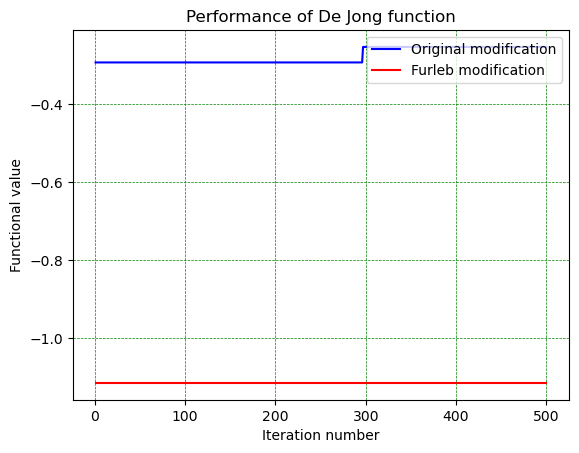

-->Test number 5
Best solution found by original is:  [-0.99562355  0.02411509]
And function result for this solution is:  -1.1101997688289558
Totally elapsed for original  0.1405983  seconds
Best solution found by furleb modification is:  -1.1089539319627626
And function result for this solution is:  [ 0.01205208 -0.97420239]
Totally elapsed for furleb modification  3.9317092  seconds


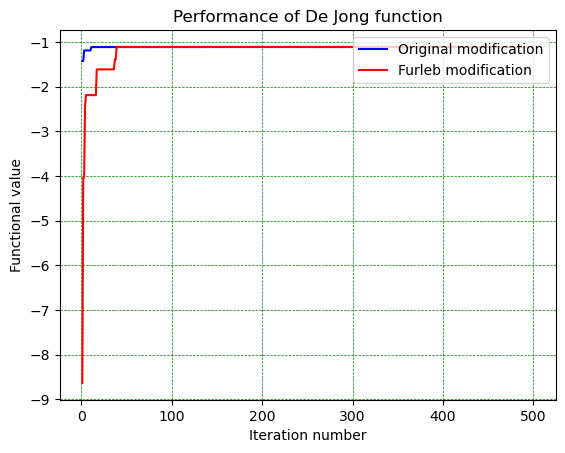

-->Test number 6
Best solution found by original is:  [0.0113822 1.041839 ]
And function result for this solution is:  -1.4546700782267532
Totally elapsed for original  0.587516  seconds
Best solution found by furleb modification is:  -1.993063629661096
And function result for this solution is:  [-0.99767855 -0.99204904]
Totally elapsed for furleb modification  3.5876057  seconds


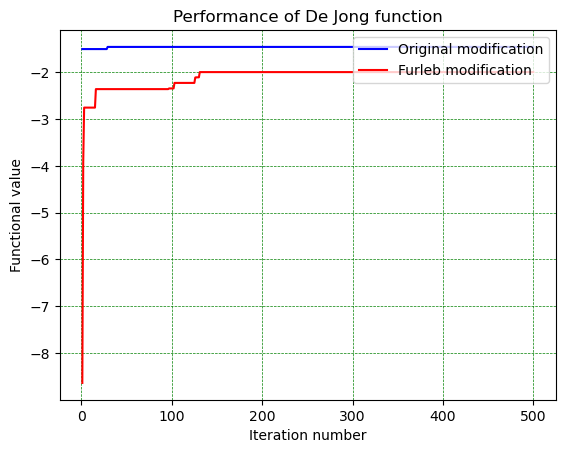

-->Test number 7
Best solution found by original is:  [0.02977534 1.060789  ]
And function result for this solution is:  -2.021250894276461
Totally elapsed for original  0.6888499  seconds
Best solution found by furleb modification is:  -1.0065654813058629
And function result for this solution is:  [ 0.00741155 -0.99685141]
Totally elapsed for furleb modification  3.7591385  seconds


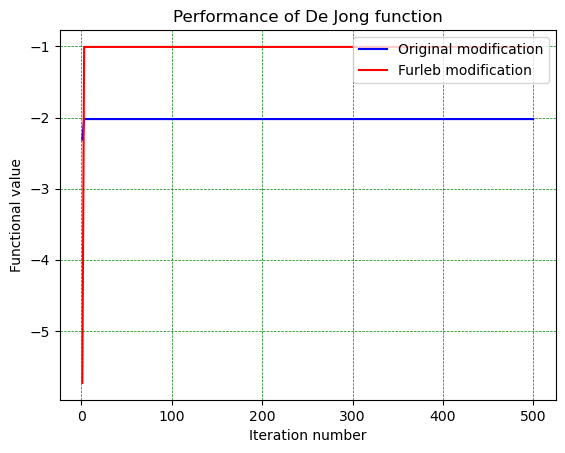

-->Test number 8
Best solution found by original is:  [-0.0064818   0.02364289]
And function result for this solution is:  -0.11902975654053982
Totally elapsed for original  0.0959924  seconds
Best solution found by furleb modification is:  -0.7809346913659745
And function result for this solution is:  [0.04995533 0.03831638]
Totally elapsed for furleb modification  3.9442023  seconds


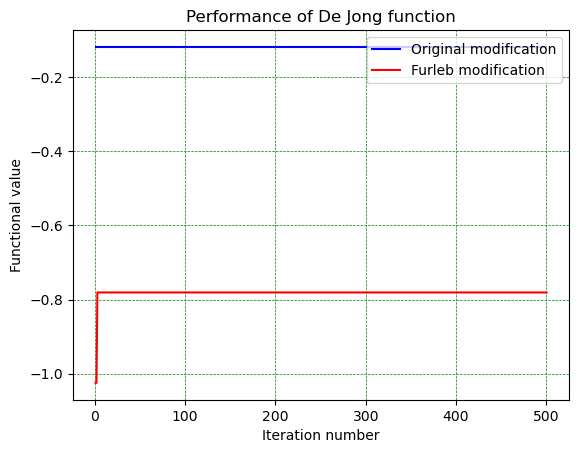

-->Test number 9
Best solution found by original is:  [0.01513684 0.0657822 ]
And function result for this solution is:  -0.8918326666942349
Totally elapsed for original  0.2817774  seconds
Best solution found by furleb modification is:  -1.04268072876655
And function result for this solution is:  [ 0.01551522 -0.99486024]
Totally elapsed for furleb modification  4.2094509  seconds


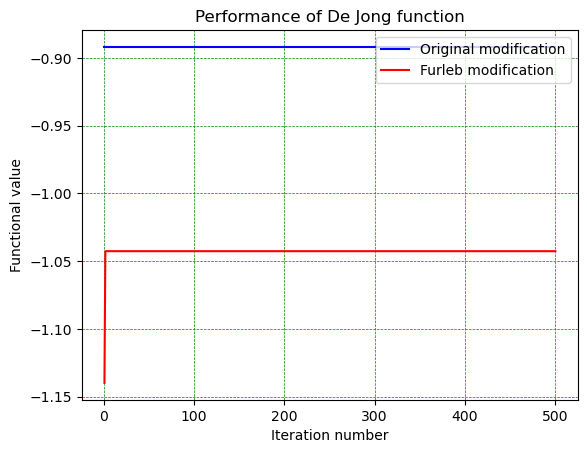

In [53]:
function_name = "De Jong function"
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    perform_comparsion_test(function_name, second_de_jong_function, -2.048, 2.048, 100, 500, 0.4, 0.3, 0.5, draw_graph=True)

## Тестирование функции Есома

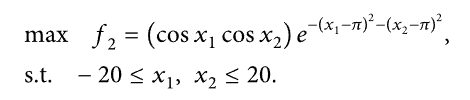

-->Test number 0
Best solution found by original is:  [3.13745651 3.57272343]
And function result for this solution is:  0.754374276834236
Totally elapsed for original  2.0953059  seconds
Best solution found by furleb modification is:  0.9235352729422918
And function result for this solution is:  [3.2019823  3.36350857]
Totally elapsed for furleb modification  8.5480903  seconds


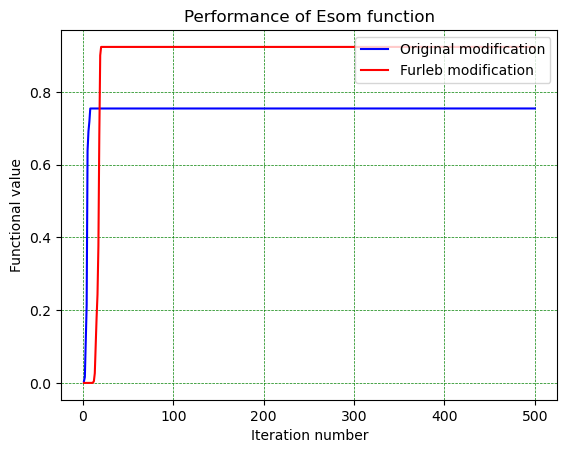

-->Test number 1
Best solution found by original is:  [3.13978891 3.16273924]
And function result for this solution is:  0.9993245641034534
Totally elapsed for original  1.0835307  seconds
Best solution found by furleb modification is:  5.891938513212134e-06
And function result for this solution is:  [1.28543738 5.8289882 ]
Totally elapsed for furleb modification  2.838932  seconds


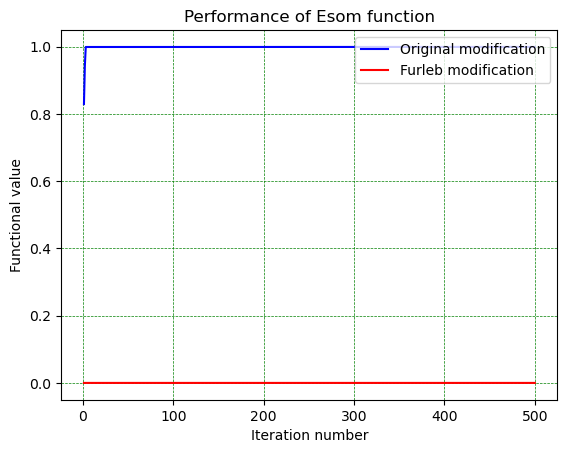

-->Test number 2
Best solution found by original is:  [3.14081326 3.14229559]
And function result for this solution is:  0.9999983476376557
Totally elapsed for original  2.7613982  seconds
Best solution found by furleb modification is:  1.8119444644320844e-05
And function result for this solution is:  [1.39046595 5.55921966]
Totally elapsed for furleb modification  2.9645444  seconds


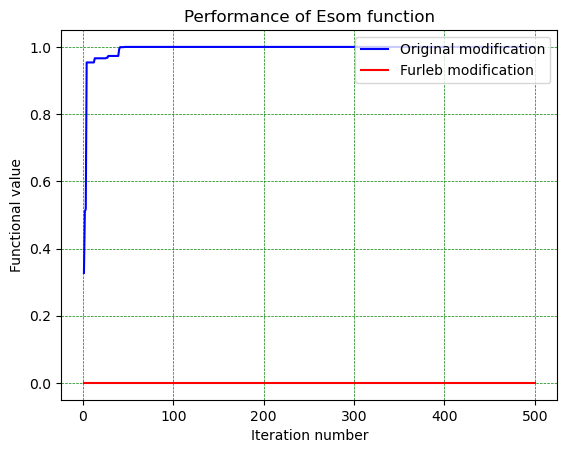

-->Test number 3
Best solution found by original is:  [4.23948378 4.483143  ]
And function result for this solution is:  0.005126809281642863
Totally elapsed for original  1.064268  seconds
Best solution found by furleb modification is:  4.4789973089845963e-08
And function result for this solution is:  [6.62726163 4.98984427]
Totally elapsed for furleb modification  2.8143073  seconds


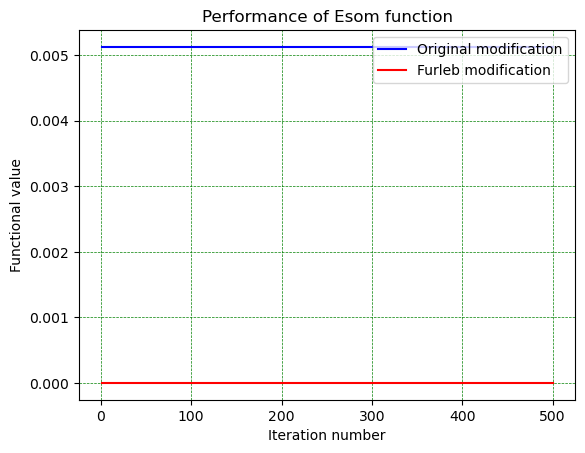

-->Test number 4
Best solution found by original is:  [0.71527246 1.57062091]
And function result for this solution is:  3.114920802737176e-08
Totally elapsed for original  2.2051991  seconds
Best solution found by furleb modification is:  5.439119071233177e-222
And function result for this solution is:  [19.15968529 19.0423286 ]
Totally elapsed for furleb modification  2.8130143  seconds


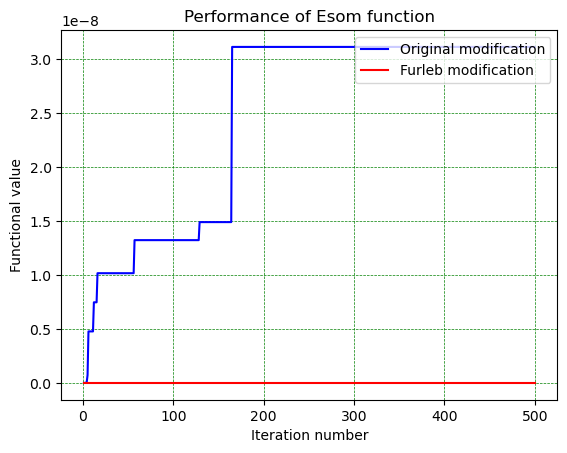

-->Test number 5
Best solution found by original is:  [3.19741567 3.60760917]
And function result for this solution is:  0.7156197974007222
Totally elapsed for original  2.2083702  seconds
Best solution found by furleb modification is:  0.008196936660239022
And function result for this solution is:  [3.30889835 4.63320553]
Totally elapsed for furleb modification  2.9899483  seconds


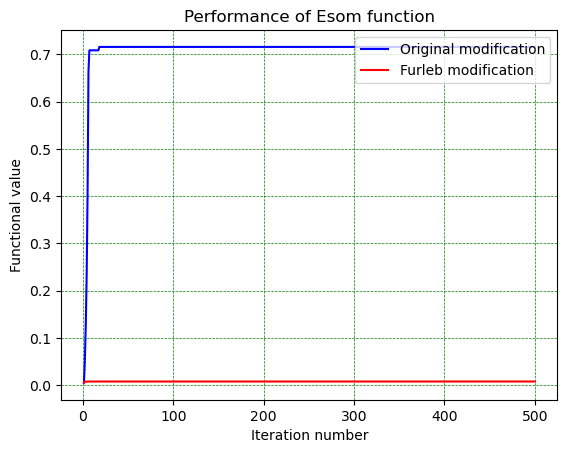

-->Test number 6
Best solution found by original is:  [1.3351463  5.02327906]
And function result for this solution is:  7.923052749452668e-05
Totally elapsed for original  1.723618  seconds
Best solution found by furleb modification is:  2.9250551608447486e-06
And function result for this solution is:  [5.96671162 1.30775728]
Totally elapsed for furleb modification  3.0516754  seconds


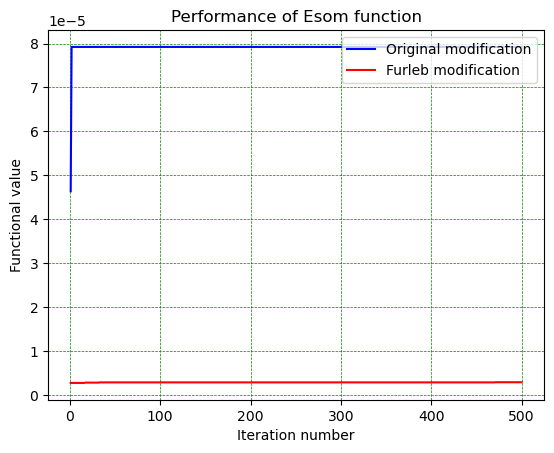

-->Test number 7
Best solution found by original is:  [3.21537226 3.23457278]
And function result for this solution is:  0.9790801043955594
Totally elapsed for original  2.1064668  seconds
Best solution found by furleb modification is:  0.03970238328385724
And function result for this solution is:  [4.02035125 4.24263161]
Totally elapsed for furleb modification  3.0159789  seconds


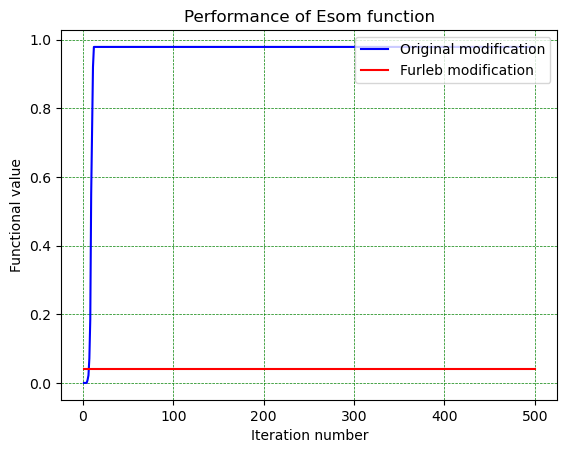

-->Test number 8
Best solution found by original is:  [3.17817747 3.63846035]
And function result for this solution is:  0.6853917248663596
Totally elapsed for original  0.7412262  seconds
Best solution found by furleb modification is:  0.04161521189890316
And function result for this solution is:  [3.2204265  4.46674292]
Totally elapsed for furleb modification  3.163704  seconds


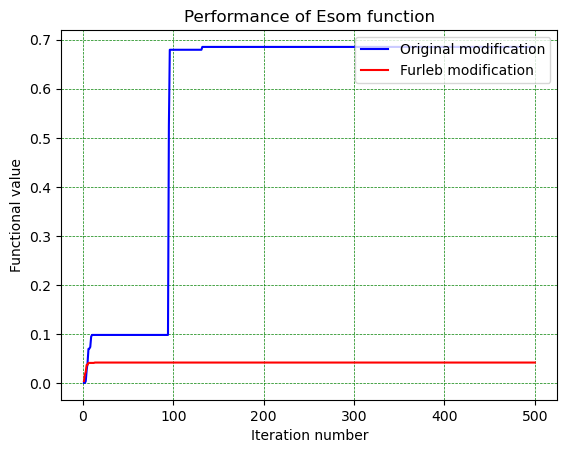

-->Test number 9
Best solution found by original is:  [4.25220752 3.12254998]
And function result for this solution is:  0.12929085016779487
Totally elapsed for original  2.3543263  seconds
Best solution found by furleb modification is:  0.0
And function result for this solution is:  [-20. -20.]
Totally elapsed for furleb modification  2.1598645  seconds


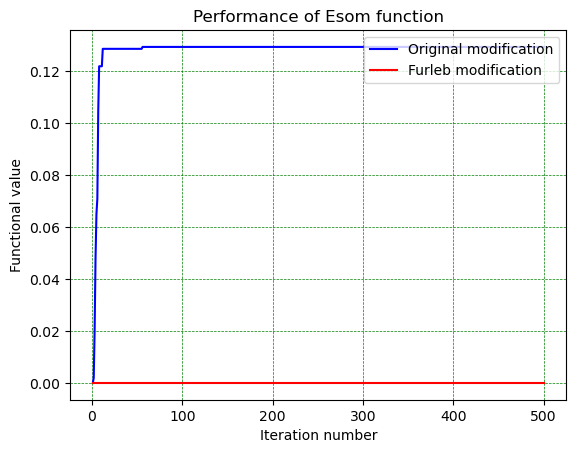

In [54]:
function_name = "Esom function"
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    perform_comparsion_test(function_name, esom_function, -20.0, 20.0, 100, 500, 0.4, 0.3, 0.5, draw_graph=True)

## Прерывистый тест

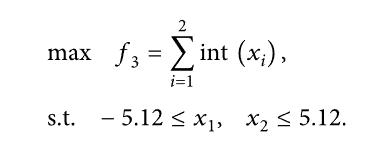

-->Test number 0
Best solution found by original is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed for original  1.8920512  seconds
Best solution found by furleb modification is:  6
And function result for this solution is:  [2.91570425 4.99621233]
Totally elapsed for furleb modification  2.8031531  seconds


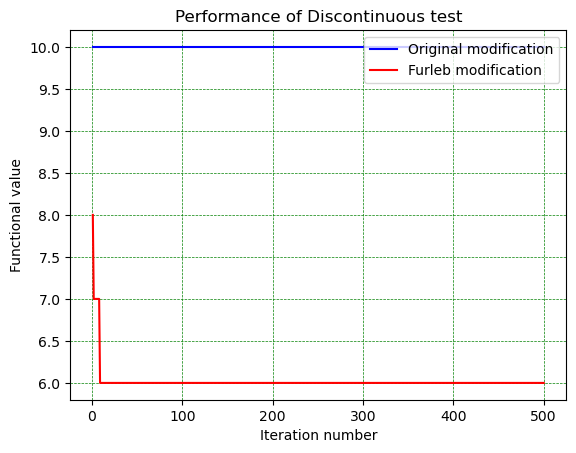

-->Test number 1
Best solution found by original is:  [5.12       5.09225546]
And function result for this solution is:  10
Totally elapsed for original  0.1507926  seconds
Best solution found by furleb modification is:  9
And function result for this solution is:  [4.03233353 5.12      ]
Totally elapsed for furleb modification  3.0847004  seconds


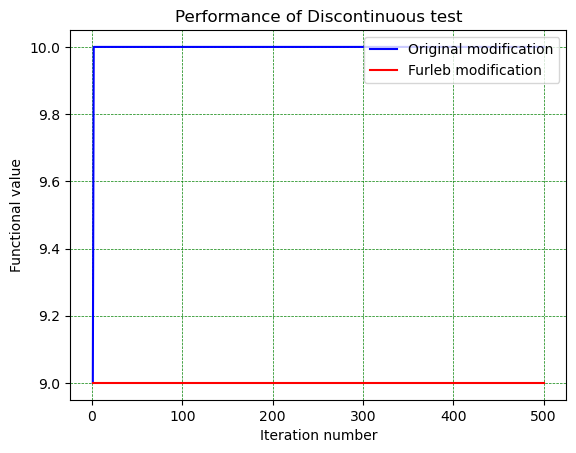

-->Test number 2
Best solution found by original is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed for original  0.1120505  seconds
Best solution found by furleb modification is:  10
And function result for this solution is:  [5.12 5.12]
Totally elapsed for furleb modification  2.8530308  seconds


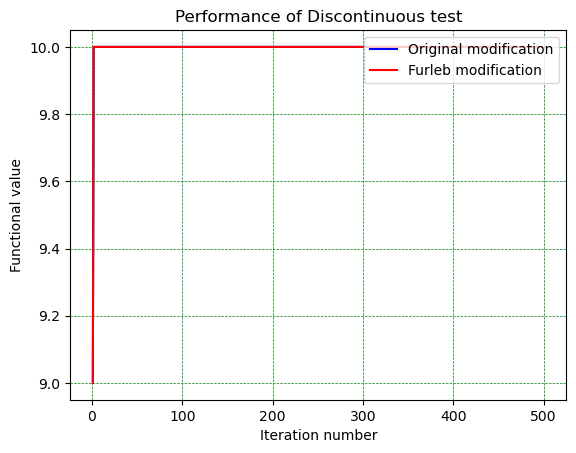

-->Test number 3
Best solution found by original is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed for original  0.124041  seconds
Best solution found by furleb modification is:  9
And function result for this solution is:  [4.28250416 5.12      ]
Totally elapsed for furleb modification  2.9140015  seconds


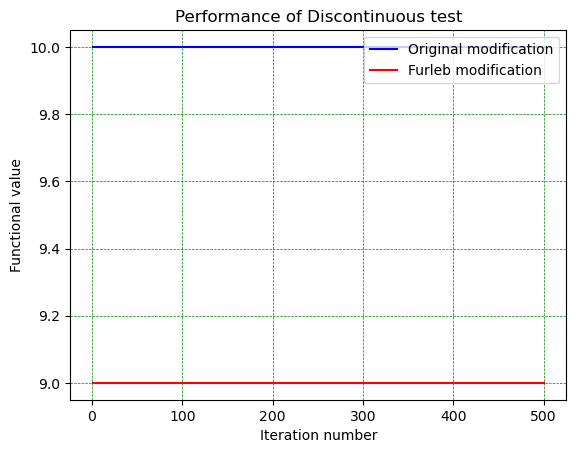

-->Test number 4
Best solution found by original is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed for original  0.1075279  seconds
Best solution found by furleb modification is:  7
And function result for this solution is:  [4.94472424 3.94125685]
Totally elapsed for furleb modification  2.8018952  seconds


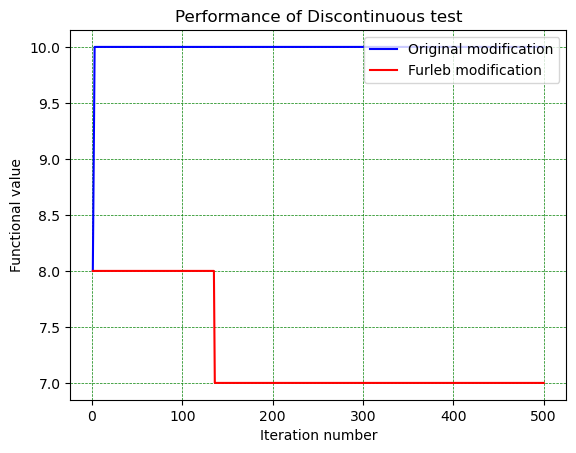

-->Test number 5
Best solution found by original is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed for original  0.1239868  seconds
Best solution found by furleb modification is:  7
And function result for this solution is:  [4.78188358 3.78914248]
Totally elapsed for furleb modification  2.9184428  seconds


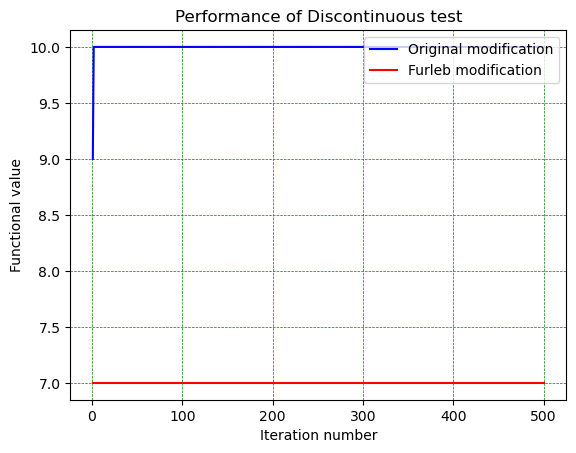

-->Test number 6
Best solution found by original is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed for original  0.1157472  seconds
Best solution found by furleb modification is:  9
And function result for this solution is:  [5.12      4.1988992]
Totally elapsed for furleb modification  2.8001069  seconds


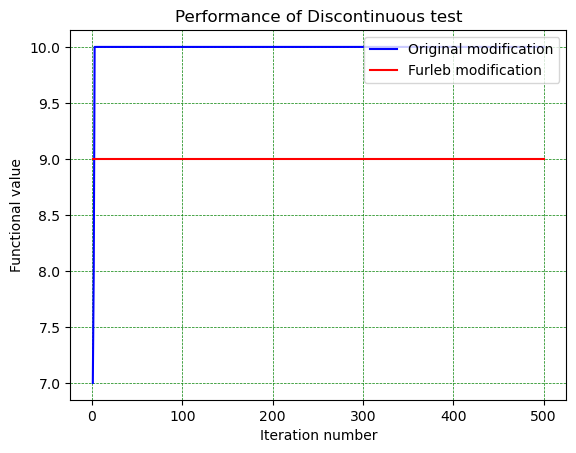

-->Test number 7
Best solution found by original is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed for original  0.1269649  seconds
Best solution found by furleb modification is:  10
And function result for this solution is:  [5.12 5.12]
Totally elapsed for furleb modification  2.8417173  seconds


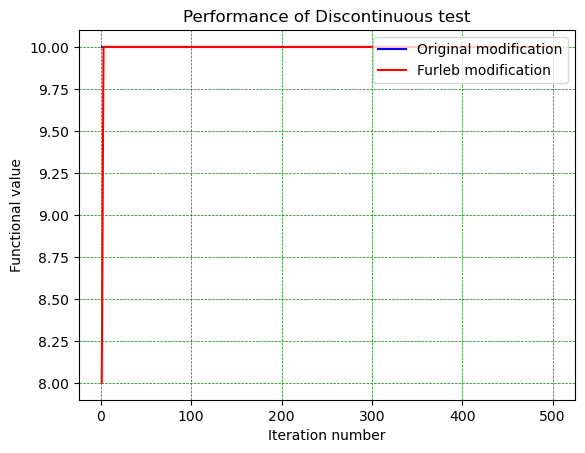

-->Test number 8
Best solution found by original is:  [5.03936572 5.12      ]
And function result for this solution is:  10
Totally elapsed for original  0.1235067  seconds
Best solution found by furleb modification is:  10
And function result for this solution is:  [5.12 5.12]
Totally elapsed for furleb modification  2.9291461  seconds


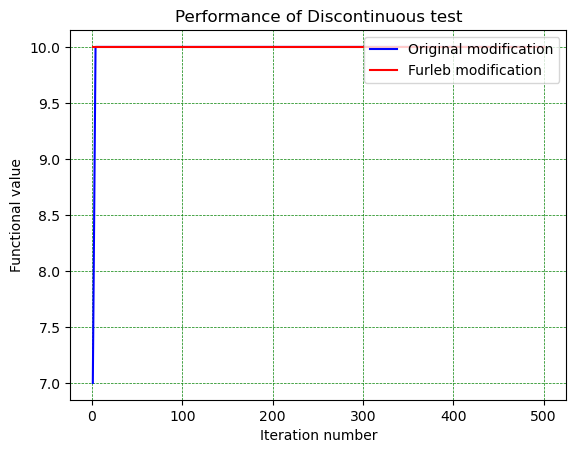

-->Test number 9
Best solution found by original is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed for original  0.1307403  seconds
Best solution found by furleb modification is:  10
And function result for this solution is:  [5.05915851 5.12      ]
Totally elapsed for furleb modification  2.9365782  seconds


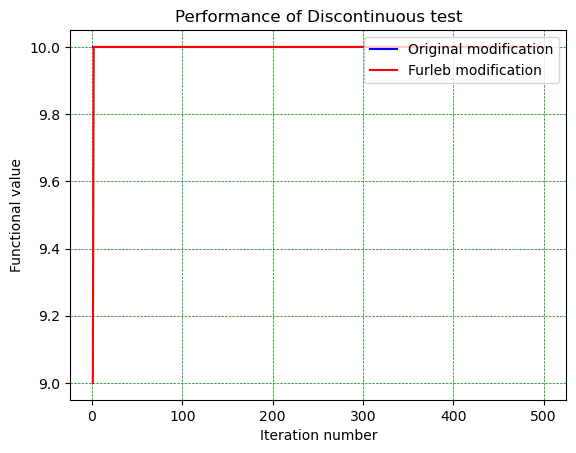

In [55]:
function_name = "Discontinuous test"
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    perform_comparsion_test(function_name, discontinuous_test, -5.12, 5.12, 100, 500, 0.4, 0.3, 0.5, draw_graph=True)

## Тестирование функции Мишры

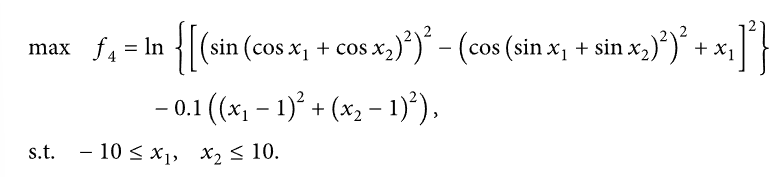

-->Test number 0
Best solution found by original is:  [2.88650147 1.82399251]
And function result for this solution is:  2.2839476121256723
Totally elapsed for original  0.9456436  seconds
Best solution found by furleb modification is:  1.9362127249432675
And function result for this solution is:  [3.70696642 1.82534445]
Totally elapsed for furleb modification  3.6429069  seconds


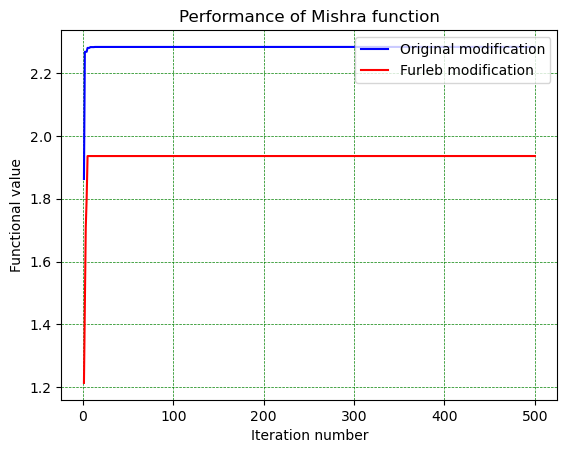

-->Test number 1
Best solution found by original is:  [2.88671429 1.82341211]
And function result for this solution is:  2.2839490533966997
Totally elapsed for original  1.3872755  seconds
Best solution found by furleb modification is:  2.271619697178669
And function result for this solution is:  [2.90232278 1.75344905]
Totally elapsed for furleb modification  3.5951253  seconds


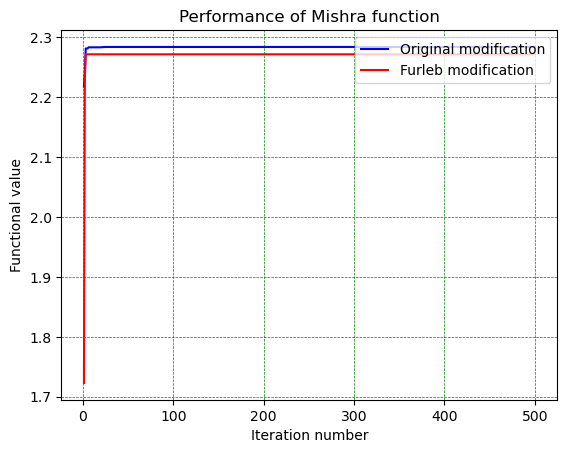

-->Test number 2
Best solution found by original is:  [3.64820214 1.80283015]
And function result for this solution is:  1.939229880385494
Totally elapsed for original  1.1094726  seconds
Best solution found by furleb modification is:  2.2387055388254575
And function result for this solution is:  [2.90103566 1.6892775 ]
Totally elapsed for furleb modification  3.586534  seconds


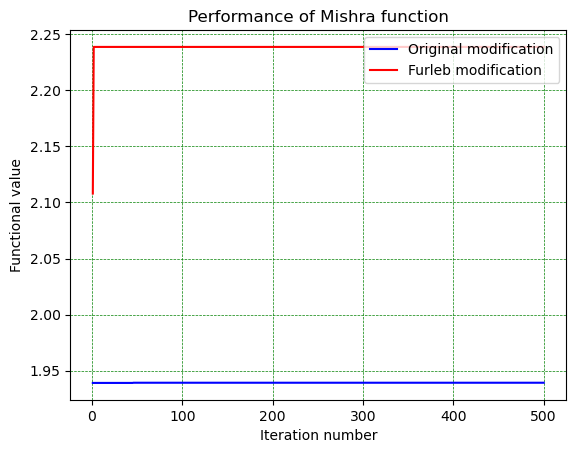

-->Test number 3
Best solution found by original is:  [2.88407546 1.82368612]
And function result for this solution is:  2.2839359303730165
Totally elapsed for original  0.9434202  seconds
Best solution found by furleb modification is:  2.2350488274416738
And function result for this solution is:  [3.01963811 1.73269346]
Totally elapsed for furleb modification  3.3826961  seconds


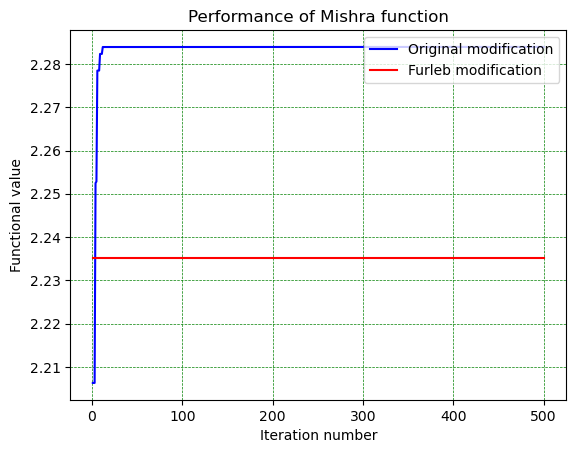

-->Test number 4
Best solution found by original is:  [2.88543727 1.82452673]
And function result for this solution is:  2.2839455212737056
Totally elapsed for original  1.123705  seconds
Best solution found by furleb modification is:  2.198049293921478
And function result for this solution is:  [2.84985422 1.99520408]
Totally elapsed for furleb modification  3.4981599  seconds


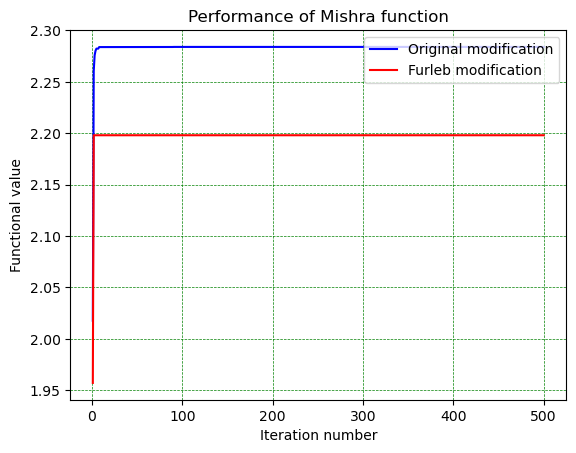

-->Test number 5
Best solution found by original is:  [2.8874384 1.8240103]
And function result for this solution is:  2.283941493329272
Totally elapsed for original  1.3800048  seconds
Best solution found by furleb modification is:  2.237747388695417
And function result for this solution is:  [2.91700071 1.92327935]
Totally elapsed for furleb modification  3.4369866  seconds


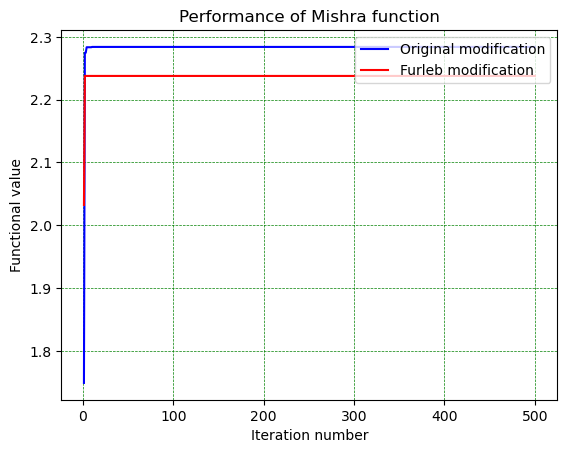

-->Test number 6
Best solution found by original is:  [2.88835111 1.82006047]
And function result for this solution is:  2.2839229262953253
Totally elapsed for original  1.1089325  seconds
Best solution found by furleb modification is:  2.280391093312905
And function result for this solution is:  [2.86845432 1.86083706]
Totally elapsed for furleb modification  3.4423452  seconds


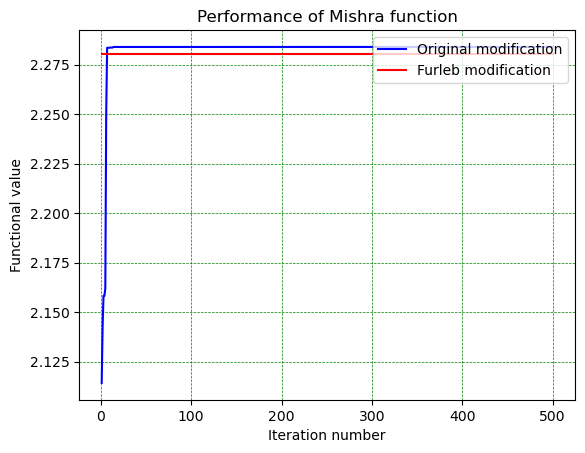

-->Test number 7
Best solution found by original is:  [2.88653432 1.82354629]
And function result for this solution is:  2.283949226394118
Totally elapsed for original  0.945535  seconds
Best solution found by furleb modification is:  1.672887956743402
And function result for this solution is:  [ 4.38898421 -0.07975126]
Totally elapsed for furleb modification  3.3259807  seconds


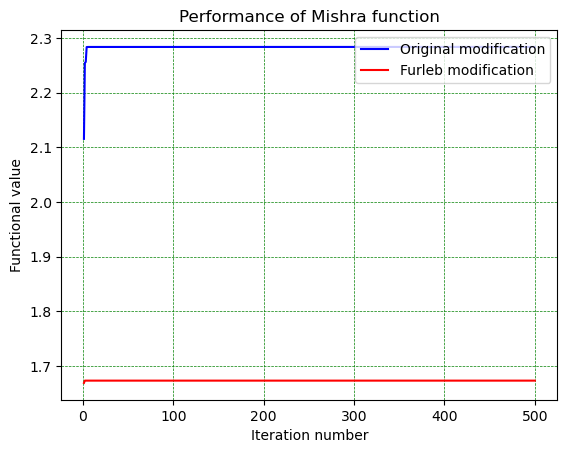

-->Test number 8
Best solution found by original is:  [2.88595687 1.82240232]
And function result for this solution is:  2.283946252028636
Totally elapsed for original  1.0826542  seconds
Best solution found by furleb modification is:  2.1261527468634647
And function result for this solution is:  [3.13356666 1.666681  ]
Totally elapsed for furleb modification  3.3309386  seconds


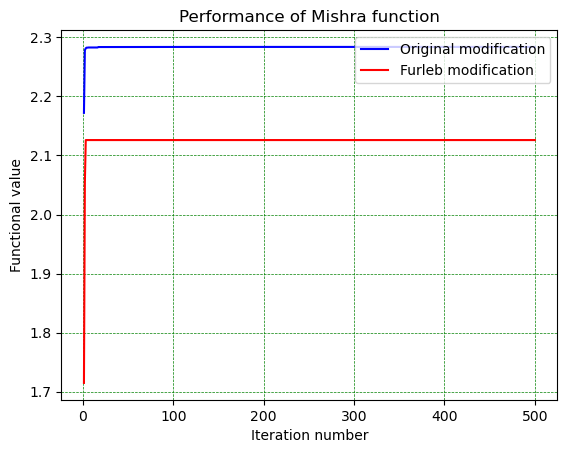

-->Test number 9
Best solution found by original is:  [2.88712566 1.82357613]
And function result for this solution is:  2.283946620251007
Totally elapsed for original  1.2875139  seconds
Best solution found by furleb modification is:  2.061341638828874
And function result for this solution is:  [3.09607351 1.5454739 ]
Totally elapsed for furleb modification  3.5021617  seconds


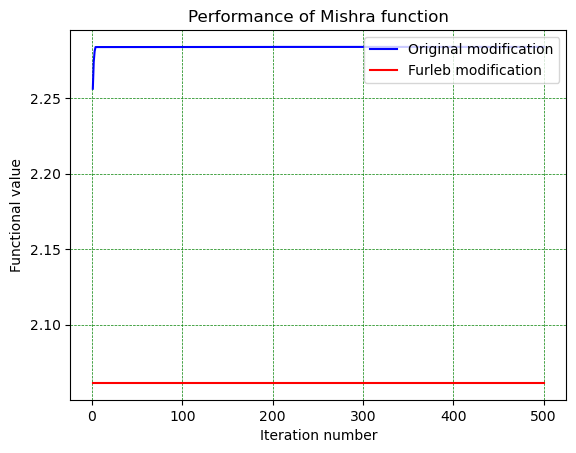

In [56]:
function_name = "Mishra function"
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    perform_comparsion_test(function_name, mishra_function, -10.0, 10.0, 100, 500, 0.4, 0.3, 0.5, draw_graph=True)

## Стохастический тест

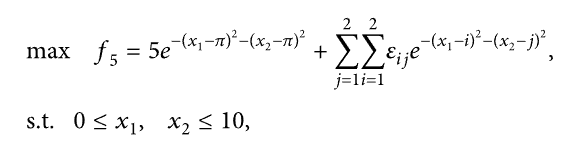

-->Test number 0
Best solution found by original is:  [3.14266953 3.14171268]
And function result for this solution is:  5.000086623033889
Totally elapsed for original  3.1643519  seconds
Best solution found by furleb modification is:  5.000077304704722
And function result for this solution is:  [3.14357776 3.14228217]
Totally elapsed for furleb modification  8.1559774  seconds


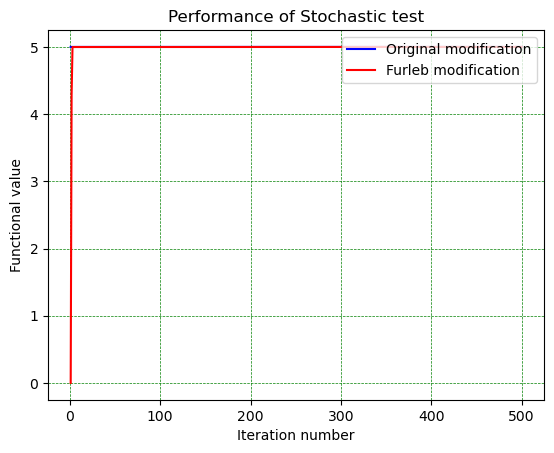

-->Test number 1
Best solution found by original is:  [3.14092063 3.14287376]
And function result for this solution is:  5.000088117065474
Totally elapsed for original  3.3022484  seconds
Best solution found by furleb modification is:  5.0000174049179344
And function result for this solution is:  [3.14191132 3.14500333]
Totally elapsed for furleb modification  2.4386494  seconds


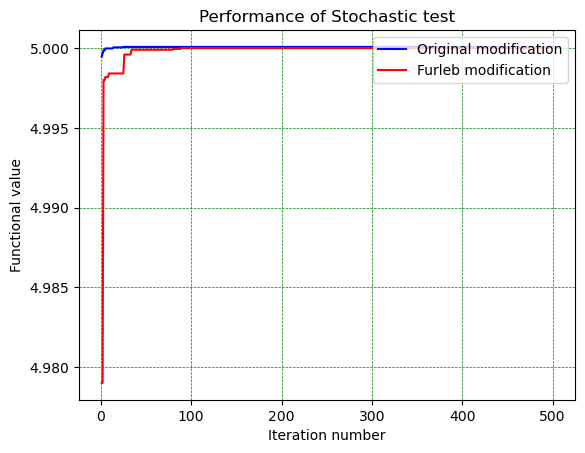

-->Test number 2
Best solution found by original is:  [3.14068391 3.14174075]
And function result for this solution is:  5.0000887103222595
Totally elapsed for original  3.4594659  seconds
Best solution found by furleb modification is:  5.000043673949533
And function result for this solution is:  [3.1430372  3.13890157]
Totally elapsed for furleb modification  2.3430671  seconds


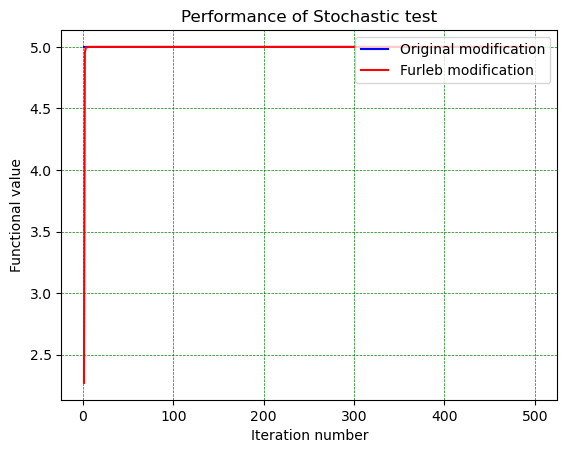

-->Test number 3
Best solution found by original is:  [3.1416492  3.14027237]
And function result for this solution is:  5.000092420973813
Totally elapsed for original  3.1496786  seconds
Best solution found by furleb modification is:  5.000047010395402
And function result for this solution is:  [3.14367105 3.14140306]
Totally elapsed for furleb modification  2.3925844  seconds


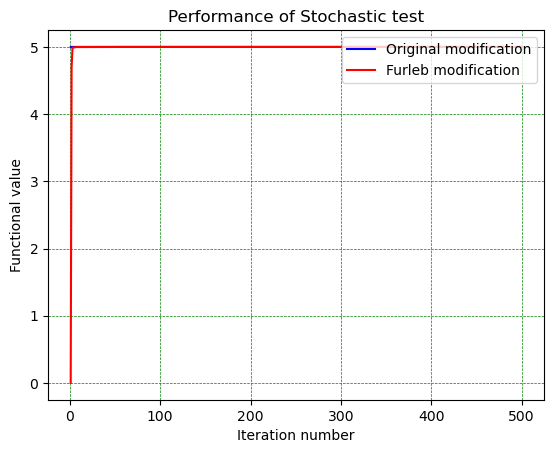

-->Test number 4
Best solution found by original is:  [3.14081611 3.1427521 ]
And function result for this solution is:  5.000083790315706
Totally elapsed for original  3.1925713  seconds
Best solution found by furleb modification is:  5.000068140064416
And function result for this solution is:  [3.14098436 3.14268185]
Totally elapsed for furleb modification  2.3599848  seconds


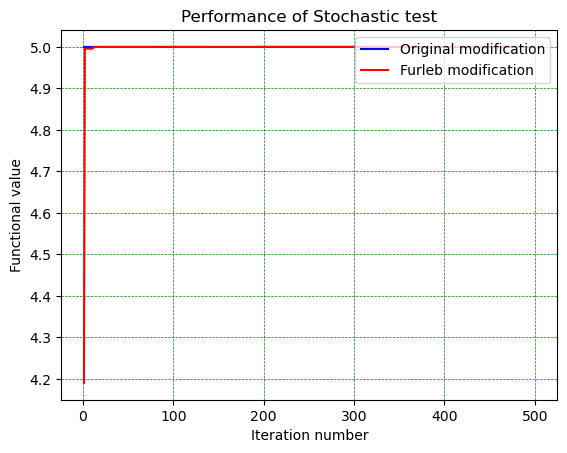

-->Test number 5
Best solution found by original is:  [3.13959105 3.14213833]
And function result for this solution is:  5.000082938325605
Totally elapsed for original  3.1684131  seconds
Best solution found by furleb modification is:  4.999948745161116
And function result for this solution is:  [3.13669579 3.14025515]
Totally elapsed for furleb modification  2.3835455  seconds


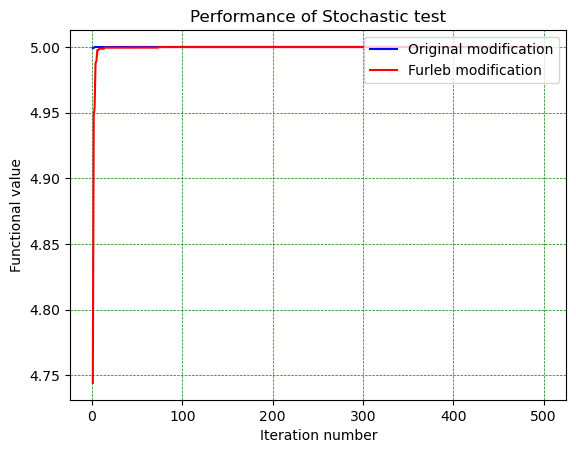

-->Test number 6
Best solution found by original is:  [3.14165203 3.1405872 ]
And function result for this solution is:  5.000095647727637
Totally elapsed for original  3.3399994  seconds
Best solution found by furleb modification is:  5.00008283390937
And function result for this solution is:  [3.14042308 3.14090299]
Totally elapsed for furleb modification  2.269956  seconds


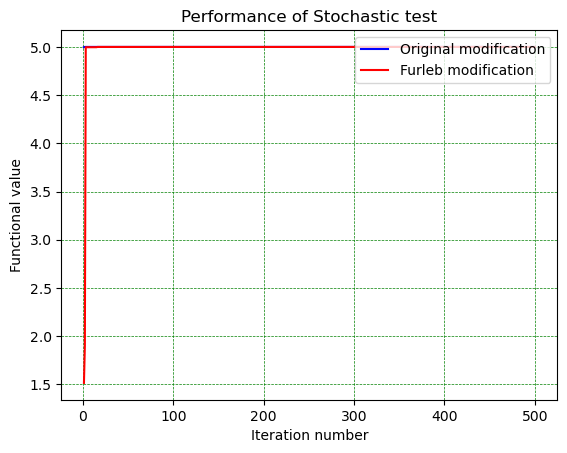

-->Test number 7
Best solution found by original is:  [3.14125395 3.14287863]
And function result for this solution is:  5.0000904397222
Totally elapsed for original  3.2202996  seconds
Best solution found by furleb modification is:  5.000091923400239
And function result for this solution is:  [3.14149729 3.14065163]
Totally elapsed for furleb modification  2.3010216  seconds


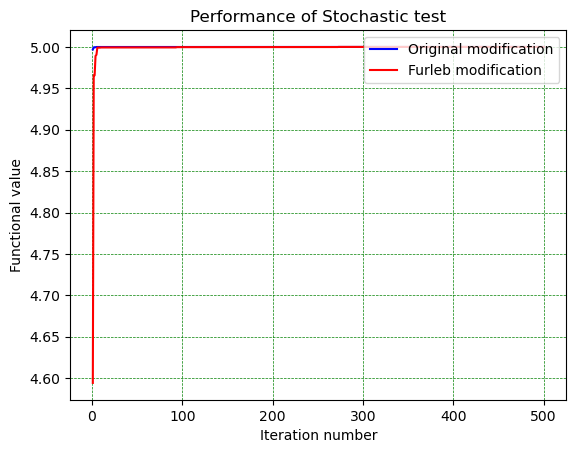

-->Test number 8
Best solution found by original is:  [3.14157598 3.14119068]
And function result for this solution is:  5.000097391022516
Totally elapsed for original  3.1018712  seconds
Best solution found by furleb modification is:  5.00001388642748
And function result for this solution is:  [3.13742789 3.14146674]
Totally elapsed for furleb modification  2.4710927  seconds


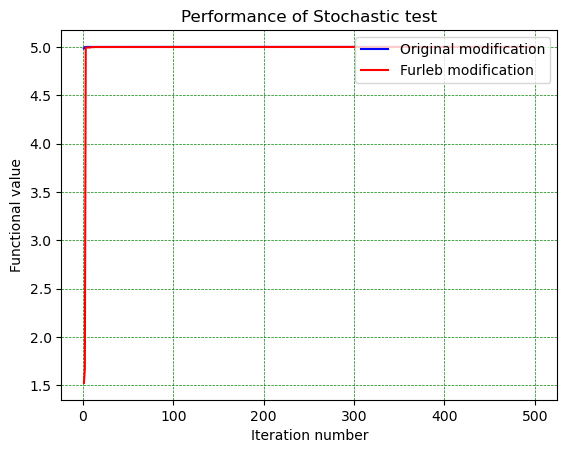

-->Test number 9
Best solution found by original is:  [3.14017836 3.14261795]
And function result for this solution is:  5.000089016787852
Totally elapsed for original  3.0613667  seconds
Best solution found by furleb modification is:  4.999907960327897
And function result for this solution is:  [3.14653445 3.14510805]
Totally elapsed for furleb modification  2.2036039  seconds


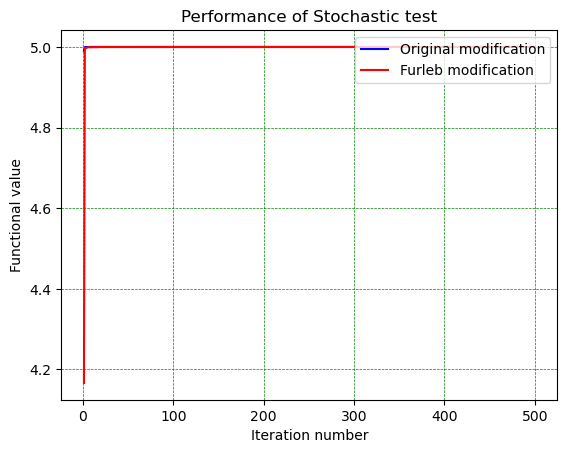

In [57]:
function_name = "Stochastic test"
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    perform_comparsion_test(function_name, stochastic_test, 0.0, 10.0, 100, 500, 0.4, 0.3, 0.5, draw_graph=True)

## Тестирование функции Стеблинского

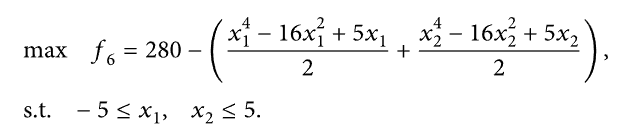

-->Test number 0
Best solution found by original is:  [-2.83589733 -2.51025598]
And function result for this solution is:  355.92184179015095
Totally elapsed for original  4.3245055  seconds
Best solution found by furleb modification is:  358.2770899933681
And function result for this solution is:  [-2.89365593 -2.84734923]
Totally elapsed for furleb modification  9.1395937  seconds


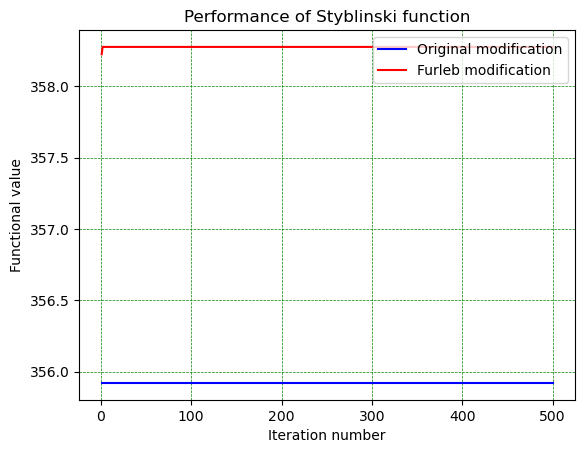

-->Test number 1
Best solution found by original is:  [-2.81248901 -2.78085325]
And function result for this solution is:  357.9437082894982
Totally elapsed for original  1.9279907  seconds
Best solution found by furleb modification is:  358.33125950794454
And function result for this solution is:  [-2.8979066  -2.89801695]
Totally elapsed for furleb modification  3.1286108  seconds


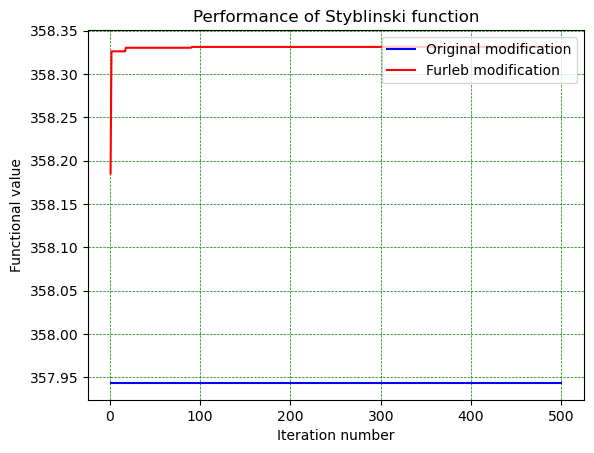

-->Test number 2
Best solution found by original is:  [-2.8658075  -2.85087828]
And function result for this solution is:  358.26093231544576
Totally elapsed for original  0.8687616  seconds
Best solution found by furleb modification is:  358.317672658397
And function result for this solution is:  [-2.89833165 -2.8747466 ]
Totally elapsed for furleb modification  3.1068627  seconds


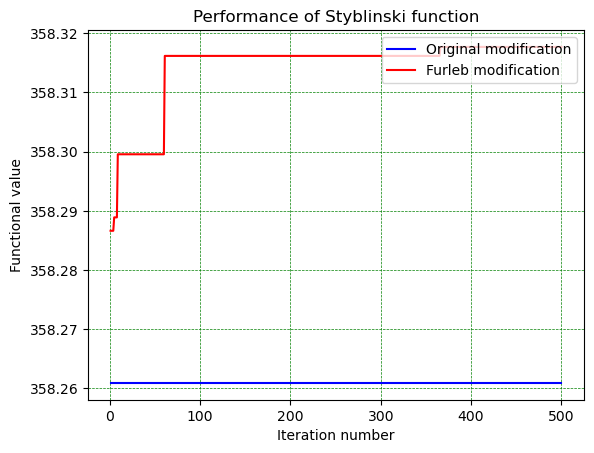

-->Test number 3
Best solution found by original is:  [-2.7750174  -2.73805289]
And function result for this solution is:  357.6113540787193
Totally elapsed for original  2.076654  seconds
Best solution found by furleb modification is:  358.30101811116526
And function result for this solution is:  [-2.89570429 -2.86140591]
Totally elapsed for furleb modification  3.4234064  seconds


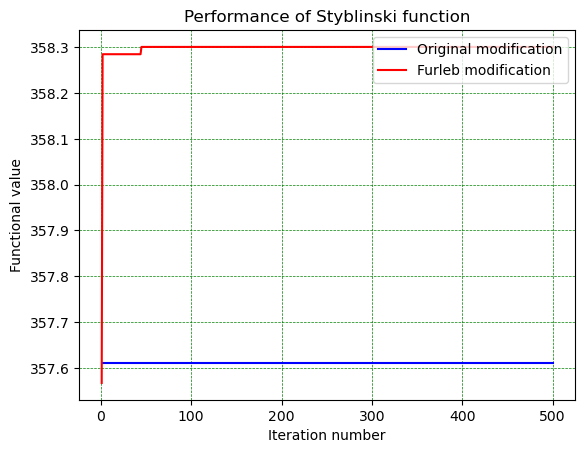

-->Test number 4
Best solution found by original is:  [-2.85387927 -2.73859744]
And function result for this solution is:  357.84569128621615
Totally elapsed for original  2.7204125  seconds
Best solution found by furleb modification is:  358.32189495372984
And function result for this solution is:  [-2.87901797 -2.90080154]
Totally elapsed for furleb modification  3.1651064  seconds


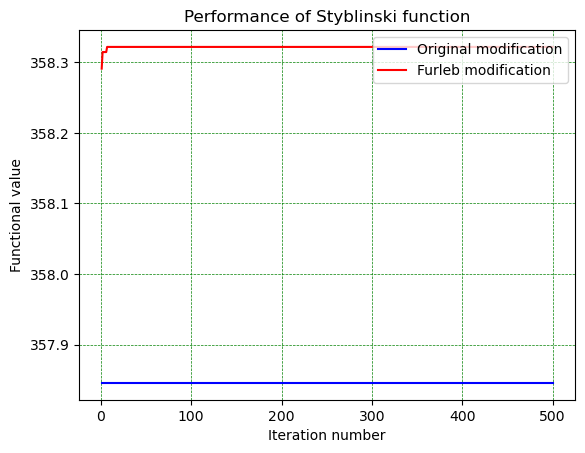

-->Test number 5
Best solution found by original is:  [-2.65228612 -2.86973583]
And function result for this solution is:  357.31137443923456
Totally elapsed for original  2.4014122  seconds
Best solution found by furleb modification is:  358.2254744751476
And function result for this solution is:  [-2.85901901 -2.83778792]
Totally elapsed for furleb modification  2.2320149  seconds


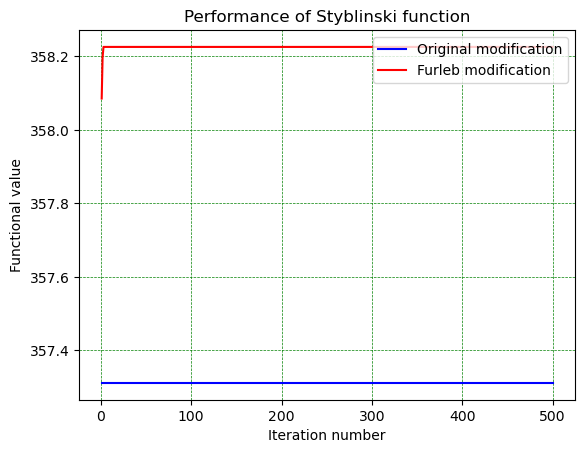

-->Test number 6
Best solution found by original is:  [-2.86067061 -2.80888016]
And function result for this solution is:  358.15098132797516
Totally elapsed for original  2.0891974  seconds
Best solution found by furleb modification is:  358.32881446883675
And function result for this solution is:  [-2.89164257 -2.9114323 ]
Totally elapsed for furleb modification  3.2192876  seconds


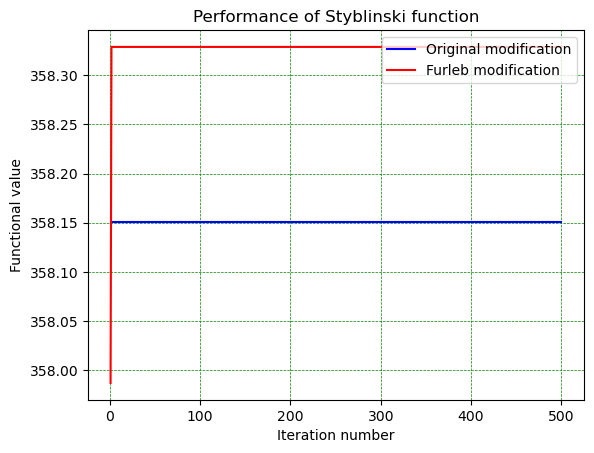

-->Test number 7
Best solution found by original is:  [-2.72430711 -2.9041251 ]
And function result for this solution is:  357.8097982990161
Totally elapsed for original  2.5258999  seconds
Best solution found by furleb modification is:  358.2721981965931
And function result for this solution is:  [-2.84397242 -2.90274462]
Totally elapsed for furleb modification  3.3799623  seconds


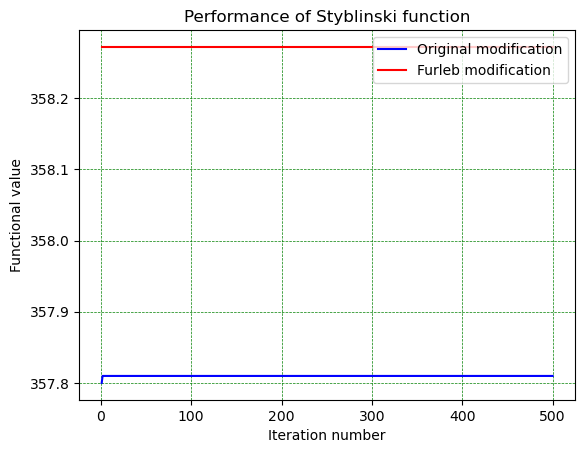

-->Test number 8
Best solution found by original is:  [-2.89211683 -2.89777757]
And function result for this solution is:  358.3295141689045
Totally elapsed for original  2.6640226  seconds
Best solution found by furleb modification is:  358.3297231372853
And function result for this solution is:  [-2.89141858 -2.90137608]
Totally elapsed for furleb modification  3.03398  seconds


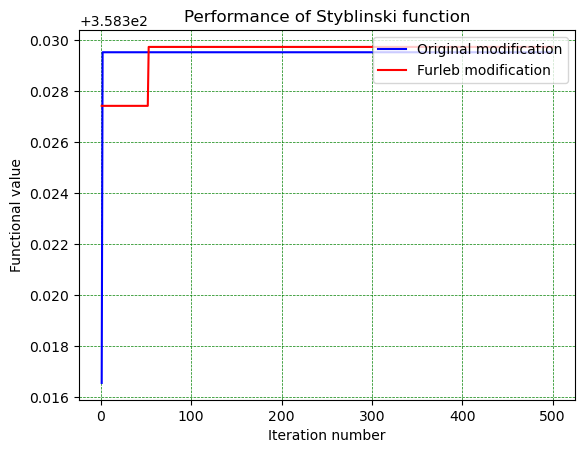

-->Test number 9
Best solution found by original is:  [-2.83286048 -2.78557036]
And function result for this solution is:  358.01681850764874
Totally elapsed for original  1.6637893  seconds
Best solution found by furleb modification is:  358.33084347075857
And function result for this solution is:  [-2.89862489 -2.89565021]
Totally elapsed for furleb modification  3.0732368  seconds


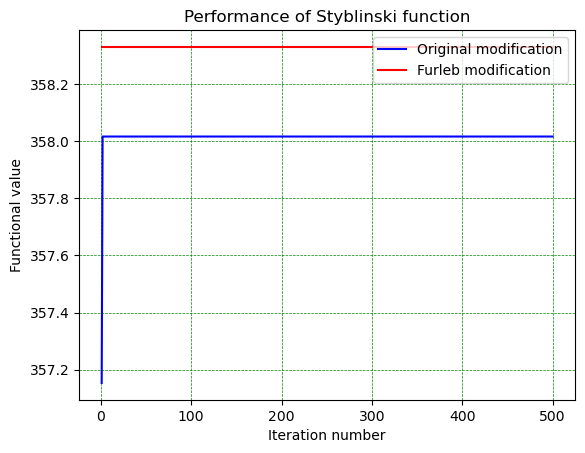

In [58]:
function_name = "Styblinski function"
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    perform_comparsion_test(function_name, styblinski_function, -5.0, 5.0, 100, 500, 0.4, 0.3, 0.5, draw_graph=True)

## Тестирование функции Шуберта

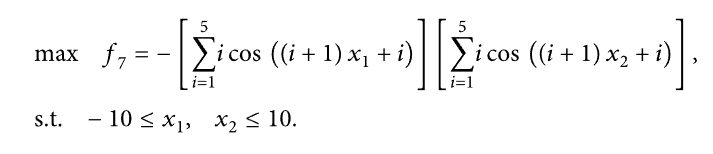

-->Test number 0
Best solution found by original is:  [-7.05942747 -1.42773591]
And function result for this solution is:  185.44011577519314
Totally elapsed for original  2.7727714  seconds
Best solution found by furleb modification is:  186.707433275607
And function result for this solution is:  [-7.70534308 -7.08236272]
Totally elapsed for furleb modification  12.4902115  seconds


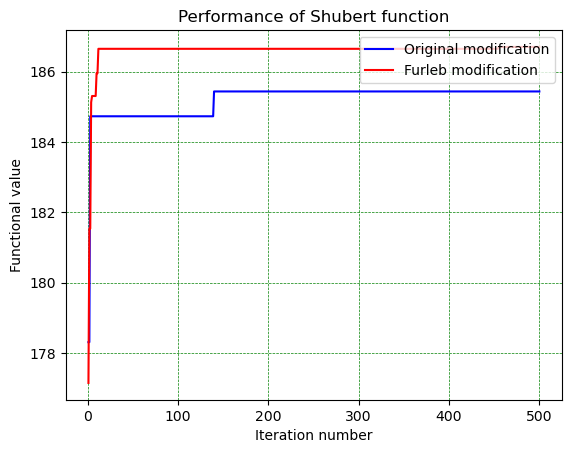

-->Test number 1
Best solution found by original is:  [-7.04870266 -7.69840062]
And function result for this solution is:  183.84874397861773
Totally elapsed for original  0.725362  seconds
Best solution found by furleb modification is:  186.17212063260615
And function result for this solution is:  [5.49876238 4.85716257]
Totally elapsed for furleb modification  5.8033516  seconds


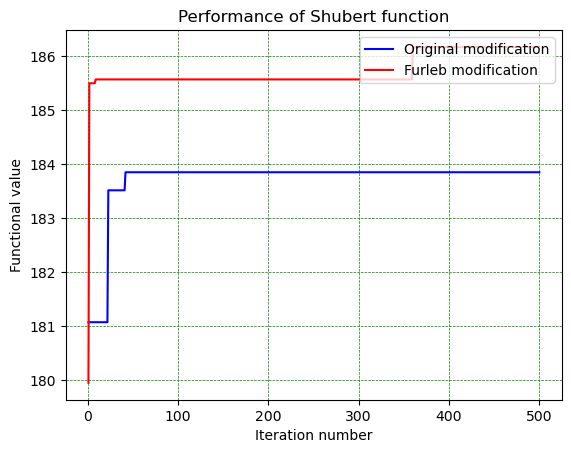

-->Test number 2
Best solution found by original is:  [-7.02987652 -1.42118034]
And function result for this solution is:  180.4317027065727
Totally elapsed for original  0.6999491  seconds
Best solution found by furleb modification is:  186.56578874836333
And function result for this solution is:  [5.49143354 4.85690801]
Totally elapsed for furleb modification  6.0264068  seconds


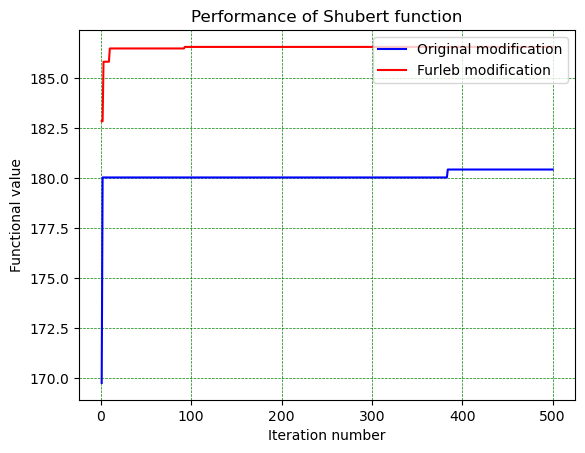

-->Test number 3
Best solution found by original is:  [-1.41357871  5.48371235]
And function result for this solution is:  186.41743406561093
Totally elapsed for original  0.8158345  seconds
Best solution found by furleb modification is:  186.16368113250977
And function result for this solution is:  [ 5.48469575 -7.69284684]
Totally elapsed for furleb modification  5.9281279  seconds


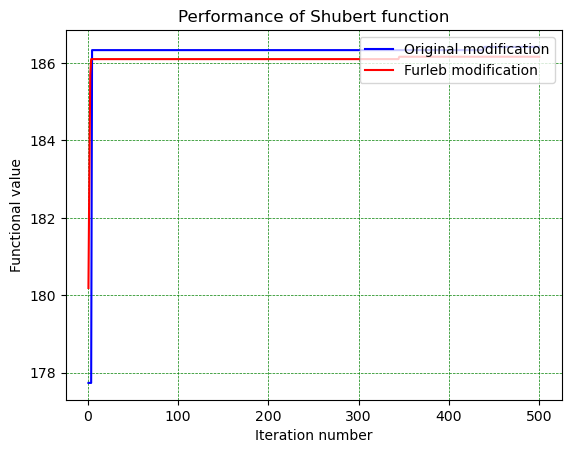

-->Test number 4
Best solution found by original is:  [5.48937058 4.85929515]
And function result for this solution is:  186.63388405351165
Totally elapsed for original  0.7424189  seconds
Best solution found by furleb modification is:  186.1809781605635
And function result for this solution is:  [-0.79975774 -7.69299382]
Totally elapsed for furleb modification  5.8658364  seconds


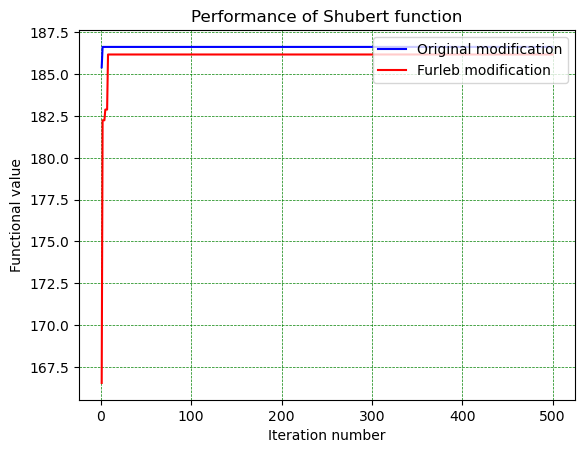

-->Test number 5
Best solution found by original is:  [-1.40595449 -0.79865085]
And function result for this solution is:  185.86372244329056
Totally elapsed for original  0.6284357  seconds
Best solution found by furleb modification is:  186.72554418904917
And function result for this solution is:  [-0.79890213 -1.42450151]
Totally elapsed for furleb modification  5.9161649  seconds


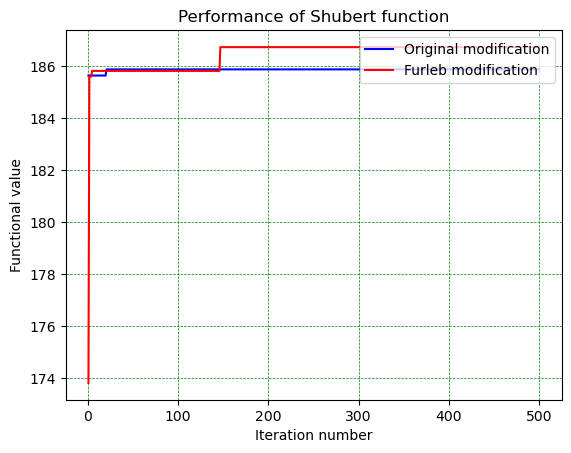

-->Test number 6
Best solution found by original is:  [-7.066217 -1.422494]
And function result for this solution is:  186.05631382965777
Totally elapsed for original  0.1784632  seconds
Best solution found by furleb modification is:  186.35117820182668
And function result for this solution is:  [-0.78720244 -1.42548255]
Totally elapsed for furleb modification  5.8373879  seconds


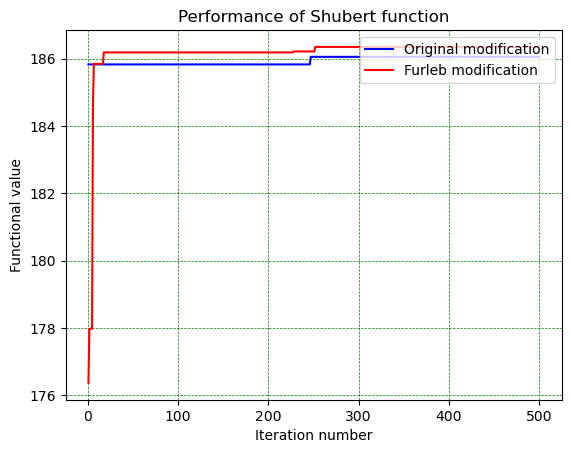

-->Test number 7
Best solution found by original is:  [-7.07596787 -7.699729  ]
And function result for this solution is:  186.43341310734013
Totally elapsed for original  0.8395688  seconds
Best solution found by furleb modification is:  186.58326987495573
And function result for this solution is:  [-7.09134735  4.86029222]
Totally elapsed for furleb modification  5.779151  seconds


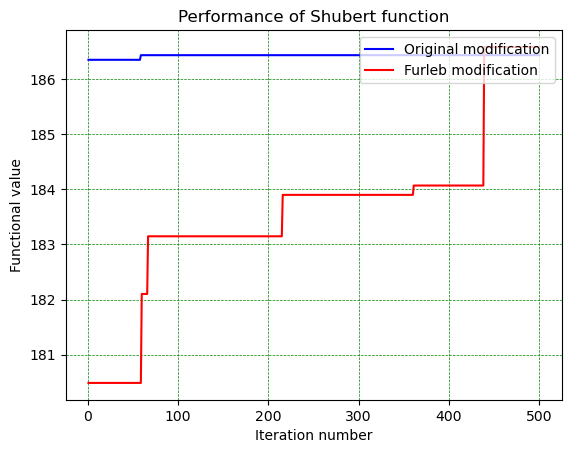

-->Test number 8
Best solution found by original is:  [-0.78849969  4.85127045]
And function result for this solution is:  186.3157878828332
Totally elapsed for original  0.4971885  seconds
Best solution found by furleb modification is:  186.72326362882038
And function result for this solution is:  [-7.70918472 -7.0851371 ]
Totally elapsed for furleb modification  6.444213  seconds


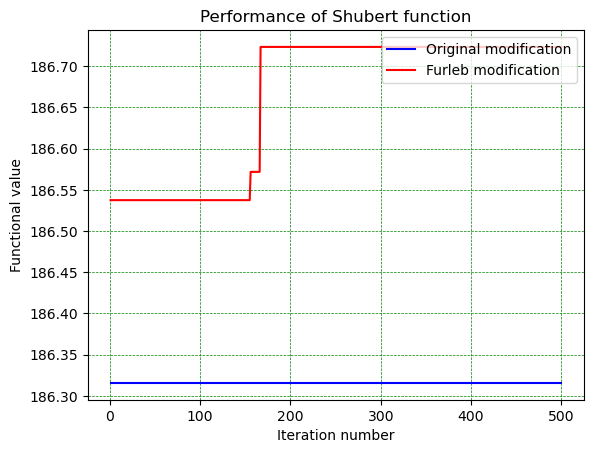

-->Test number 9
Best solution found by original is:  [-0.76856547 -7.66247372]
And function result for this solution is:  179.63619636496412
Totally elapsed for original  0.7489961  seconds
Best solution found by furleb modification is:  186.72879657887287
And function result for this solution is:  [-7.08254769 -7.70812686]
Totally elapsed for furleb modification  5.8653591  seconds


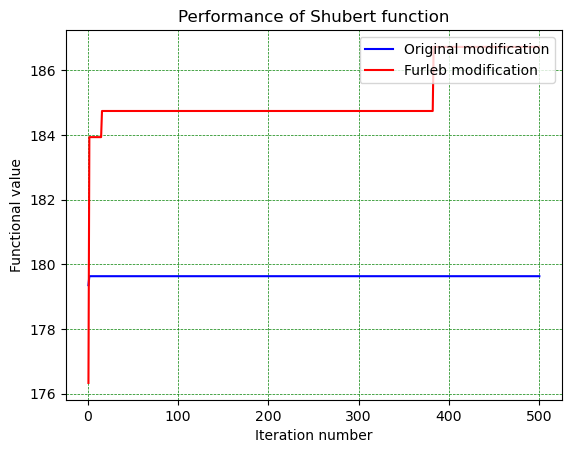

In [61]:
function_name = "Shubert function"
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    perform_comparsion_test(function_name, shubert_function, -10.0, 10.0, 100, 500, 0.4, 0.3, 0.5, draw_graph=True)

## Тестирование на многомерных функциях

In [65]:
@jit(nopython=True)
def a_lot_dimensions(arguments):
    return -1.0 * sum([arguments[i] ** 2 for i in range(256)])

In [66]:
def perform_comparsion_test(function_name, function, min_argument, max_argument, fireflies_number, iterations_number, alpha, beta, discordance, dimensions_number=2, draw_graph=True):
    bonds = [(min_argument, max_argument)] * dimensions_number
    
    start_time_furleb = time.perf_counter_ns()
    best_max_intensity, best_max_solution, best_min_intensity, best_min_solution, best_max_values, best_min_values = firefly_algorithm_furleb_modification(function, dimensions_number,
                                                      np.array(bonds),
                                                      fireflies_number, iterations_number, alpha, beta, discordance)
    time_elapsed_furleb = time.perf_counter_ns() - start_time_furleb
    start_time = time.perf_counter_ns()
    best_solution, best_intensity, best_values = firefly_algorithm(function, dimensions_number,
                                                      np.array(bonds),
                                                      fireflies_number, iterations_number, alpha, beta)
    time_elapsed = time.perf_counter_ns() - start_time
    print("Best solution found by original is: ", best_solution)
    print("And function result for this solution is: ", best_intensity)
    print("Totally elapsed for original ", time_elapsed / 1_000_000_000, " seconds")
    
    print("Best solution found by furleb modification is: ", best_max_intensity)
    print("And function result for this solution is: ", best_max_solution)
    print("Totally elapsed for furleb modification ", time_elapsed_furleb / 1_000_000_000, " seconds")
    
    if draw_graph:
        draw_comparsion_graphic(best_values, best_max_values, iterations_number, function_name)

-->Test number 0
Best solution found by original is:  [ 0.65529545 -2.61034406  2.32299607  5.12        0.47622551  0.67143736
  2.33732782  2.50415342 -4.36604295  3.34335811  1.91412357  2.69209644
  1.91010573 -1.13475035  3.82479745  3.94058797 -0.04868929  0.18565032
 -3.63731328  3.9050795  -0.16916165  0.03920623  2.27948816 -1.47204617
 -0.73529638  1.76751906  0.07799806 -1.10508691  1.15748518 -1.45087643
  3.41543063  5.12       -0.40474358  5.12        0.53374794  5.12
 -0.43706394 -1.72706848  2.10860469  2.81303489  1.16394785  4.54712196
 -2.74104217  4.12092315 -0.15622379 -2.24651926  2.76493904 -2.87937547
 -2.22407088  0.01732945 -1.58375582 -2.26276206  0.88612452  1.03704349
 -2.81406997  0.02564688  3.05425798  0.69460623  2.0293911  -1.83605513
 -0.56996503 -0.34501337  3.16111277 -3.70442165 -3.82314155  4.07039363
 -2.1910834  -0.65285574  0.46047292 -3.90203331  3.82829477  3.50636674
  1.07164629 -3.29767717  0.86892844 -1.14257358 -1.36818065  3.90753457
  1

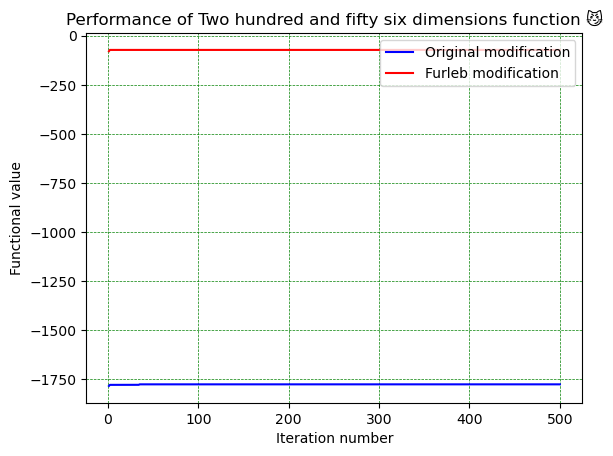

-->Test number 1
Best solution found by original is:  [-2.58388263e+00  2.78163069e-02  2.40435671e+00 -2.32791754e+00
  9.63846437e-01 -3.69036679e+00 -3.14488778e+00  1.04491609e+00
 -6.67972958e-01  9.55742775e-01  1.70877399e+00 -9.94150437e-01
  1.33719395e-02  3.39190115e+00 -7.08338926e-01  4.42398152e+00
 -1.27719340e+00  3.30293875e+00  3.02730688e+00 -3.98967005e+00
  3.66611463e+00 -3.07324283e+00  4.08758473e+00  4.90961551e-01
  2.14368333e+00 -1.35689385e+00  3.57979721e+00  1.95930677e+00
 -1.46367601e+00 -1.96408168e+00 -1.88296645e-01  1.24937951e+00
 -2.15331070e+00 -4.00115042e+00  8.57366110e-01  3.04324232e+00
 -3.92893023e+00  9.02474917e-01  4.40917466e+00  3.60263474e+00
  1.30451277e+00  3.98800855e+00 -1.47628882e+00  1.53178650e+00
  1.54167354e+00 -7.46304684e-01 -1.89909039e+00 -4.24271784e+00
 -2.66841512e+00 -4.72017779e-01 -1.99822419e+00 -1.98348737e+00
  9.39188390e-02 -1.71148079e+00 -8.92025247e-01  4.22420782e+00
  9.98635512e-01  1.74264138e+00 -3.

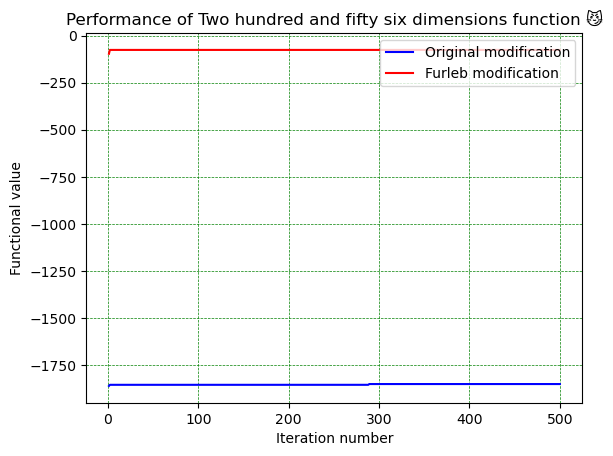

-->Test number 2
Best solution found by original is:  [ 3.36506812e+00 -3.32432592e+00  8.36766153e-01 -4.31865618e+00
  3.91937930e+00  3.35249344e-01 -3.59082558e+00 -3.64968823e+00
 -1.29222773e+00  7.65580911e-01  4.79190380e+00 -3.15390975e+00
 -1.82153567e+00  2.81940011e+00  1.79327375e+00 -3.47740719e-01
  4.79435420e+00 -2.56207571e+00 -2.09293458e+00 -2.60270584e+00
  2.02559472e+00 -2.24748746e+00  2.69949664e+00 -5.96679934e-01
  3.75564876e+00  3.08794546e+00  8.11888300e-01 -1.43247660e+00
  2.23494540e+00 -1.94565732e+00 -1.01991248e+00  1.54373341e+00
  3.54676897e+00 -2.41476388e+00  3.18301685e+00  1.31840681e+00
  4.92557893e+00  2.70958706e+00  2.21087798e-01 -1.22349108e+00
 -2.21539938e+00  5.12000000e+00 -3.12793926e+00 -1.33673301e+00
  5.12000000e+00  3.37018400e+00  4.25369508e-01  8.57948754e-01
  3.75516621e+00  2.88750592e-01 -4.43482454e+00 -3.17147787e+00
 -2.13360844e-01  4.39804802e+00 -2.32828269e+00  2.30614648e+00
  2.45269184e+00 -1.32879701e+00 -1.

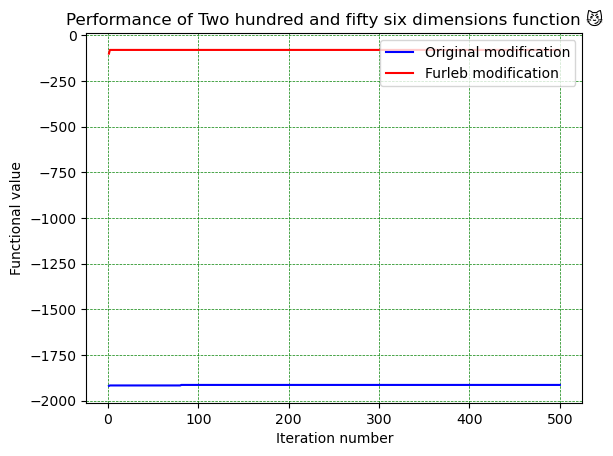

-->Test number 3
Best solution found by original is:  [ 1.78565967e+00 -4.74079734e-01 -3.92224754e+00  3.60286095e+00
  9.66482499e-01  4.33440661e+00 -3.45919830e+00  3.15567160e+00
 -1.64578960e+00 -2.04725542e+00 -1.04102704e+00 -2.65487989e+00
  2.06200988e+00  2.36452217e+00  1.85121934e+00 -3.05580787e+00
 -2.02022956e+00 -2.86019307e-01 -4.06362551e+00 -1.45936233e+00
  1.81228957e+00  6.05653065e-01  3.33827171e+00 -1.63841214e+00
 -5.23989359e-01 -3.78069405e+00 -2.40595198e+00  6.14453238e-01
  6.60082553e-01  2.59830079e-01 -1.52313252e+00  3.75352740e+00
  1.45310630e+00  4.13361319e+00  5.42955121e-01 -9.29174881e-01
  1.25578232e-01 -4.29868831e+00 -1.82373918e+00 -3.60232472e+00
 -2.64775839e-01  3.60102834e+00  3.86076371e+00 -2.81839189e+00
  3.54171429e+00 -3.07552558e+00  5.12000000e+00 -4.04088095e+00
  5.07966093e-01  2.32766741e+00  9.50994222e-01  1.00249399e+00
 -4.46919379e-01  3.54136541e+00 -2.05042565e+00  2.80231103e+00
  4.37965044e-01  5.79099389e-02  1.

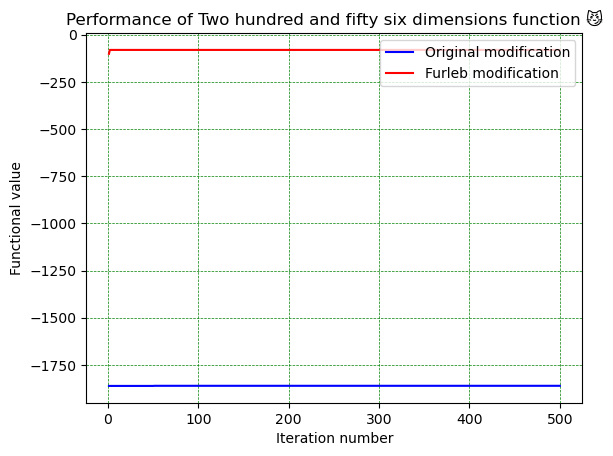

-->Test number 4
Best solution found by original is:  [-1.05261687e+00  1.93870977e+00  1.49423491e+00 -2.62966625e+00
  5.12000000e+00 -2.84421283e+00  4.99615420e+00 -4.48022232e-01
  5.12000000e+00 -3.59821730e+00  1.93205831e+00 -3.67189495e+00
  1.93718798e+00  2.39295703e+00 -9.81317997e-01  3.08607817e-01
 -1.42610357e+00 -1.61832563e+00  2.47311939e+00  3.54012022e+00
 -7.83216664e-01 -1.90348054e+00 -2.53809917e+00 -5.48418590e-01
 -2.71288856e+00  2.42213689e+00  5.12000000e+00  2.19794079e+00
  2.10547851e-02 -5.39793733e-01 -3.60963100e+00 -3.42099115e+00
  3.91672707e+00  5.12000000e+00  5.06422357e+00  3.96992402e+00
  1.04031191e+00  8.83643784e-01  9.73004129e-01 -2.24035174e+00
 -3.73597865e+00 -1.94015720e+00 -1.25580000e+00  1.79098299e+00
 -1.77465233e-01  3.86292955e-01 -1.32437243e+00 -4.47975577e+00
 -3.17353487e+00  2.78498268e+00  1.82677489e-01 -7.30233181e-01
  5.74128752e-01  2.27347278e+00 -1.62986096e+00 -4.03718296e+00
  1.21086695e+00  1.14111918e+00  4.

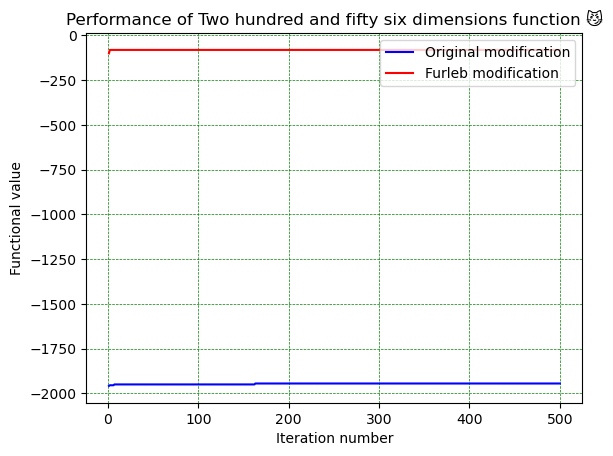

-->Test number 5
Best solution found by original is:  [ 0.33086429 -2.21467834  1.94327148  3.17515338  0.7241102  -0.9818899
  0.80670863 -0.88906359  0.37618781 -4.68520249 -0.35670022  4.97756905
  2.36536026 -2.00181753  3.35269962 -0.5802385   0.32982644 -2.00704614
  3.45653392  2.51947374  1.55996449 -3.11929013 -3.85642508  2.30225024
  4.6462022   1.13386406  2.62218115  5.07347076 -2.35831322 -3.91285613
  1.76299385  3.55152056 -1.86630328  0.71667101  1.98610401 -0.90221509
  2.31130406  1.1928929   0.84597155 -2.40772814  4.26227971 -4.17612882
  0.8410419  -0.03536911  2.29171026  3.68026516  3.73943564  3.60599391
  0.61461583 -4.23071368  1.51703668 -2.92820448 -4.22588572  3.36082422
  0.16827052  1.70023139 -2.9311221  -0.52545221 -2.34901045  3.17199894
  0.84727943  2.16477461 -0.52322549 -4.84568053 -3.97143523 -2.70330884
  4.86153013 -0.30575351 -3.01074401  4.70581893 -1.42563974 -0.72285613
  0.99562024 -1.73933902  0.32272916  2.73088523  4.15096968  3.2914554

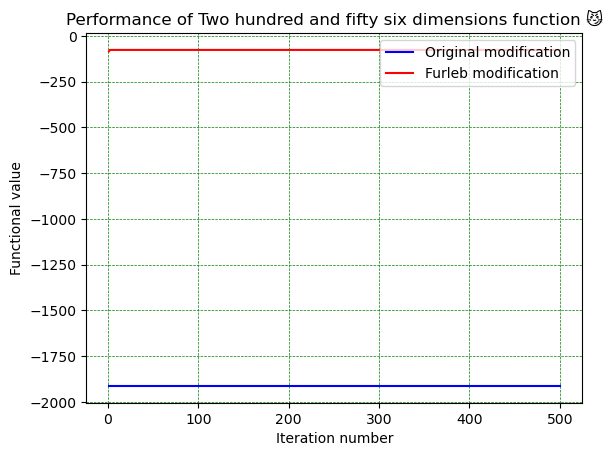

-->Test number 6
Best solution found by original is:  [ 1.12293203e+00 -5.43050021e-01  2.70287427e+00  1.19222367e+00
  2.70075384e+00  4.65385782e-01 -2.54276983e+00  2.92199062e+00
  8.33624681e-01 -2.12209622e+00 -2.24442179e+00 -5.90693760e-01
  4.66141541e+00  1.61829795e+00  2.23852427e+00 -2.99700980e+00
 -4.80697845e+00 -4.55379688e+00 -3.54143491e+00  2.23016122e+00
 -2.82761668e-03  2.70946736e+00 -4.08994633e+00 -1.54031217e+00
  2.76438665e+00 -4.31810901e+00  3.98315775e+00 -2.45953375e+00
 -1.12443153e+00 -2.85449628e+00 -3.38440975e+00  3.89445600e+00
 -1.13408414e+00  4.52089599e-01  8.84295697e-01  3.59546236e+00
  2.18496695e+00 -3.79397921e+00  1.83783122e+00 -2.07444443e+00
  3.26679896e+00  3.85931349e+00 -3.00488912e+00 -1.34063416e+00
 -1.01024228e+00 -3.72972988e+00 -1.91983787e+00 -2.99057674e+00
 -1.72184786e+00 -4.48285613e-01 -2.56645275e+00  3.14528893e+00
  1.22955621e+00  1.73301275e-01  1.74718682e+00  4.08912587e-02
  2.98664772e+00 -1.14293214e+00 -2.

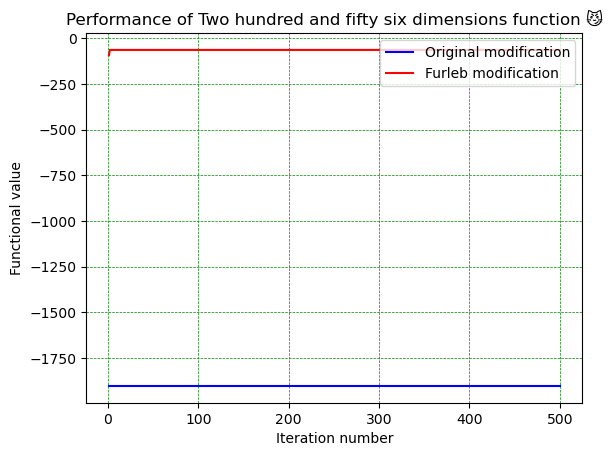

-->Test number 7
Best solution found by original is:  [-2.44193578e+00 -2.47447676e+00  4.13823709e+00  2.87328096e+00
 -3.77370066e+00  3.46115971e+00  3.36189312e+00  2.32753817e+00
  4.70126706e+00  3.07084289e+00  4.30389516e+00 -4.92396334e-01
 -3.48957475e+00  5.02918324e-01 -1.92482730e+00  1.51154409e+00
  5.11455677e-01  9.64278320e-01  5.12000000e+00 -1.47292436e+00
 -9.67886493e-01  2.69758641e+00  3.93772901e+00 -2.73946331e+00
  9.08790142e-01  2.43948687e+00  5.12000000e+00 -3.13266115e+00
  1.66212581e+00  2.72156659e+00  4.71510444e+00  4.82700095e+00
  1.20850384e+00  2.29808556e+00 -2.77822212e+00  1.08736497e+00
 -3.97160576e-01 -1.11835145e+00  1.17878549e+00 -3.66215619e+00
  4.51814914e+00 -3.38115365e+00 -1.38674664e+00  3.74755586e+00
  3.43308759e-01 -8.42427408e-02  1.69005201e+00 -1.83785422e+00
  2.55547987e+00  1.97067252e+00  6.19283059e-02  3.77590999e+00
  5.12000000e+00  3.06765261e+00  4.50943636e+00 -1.42716877e+00
  8.58568283e-01 -2.91352758e-01 -6.

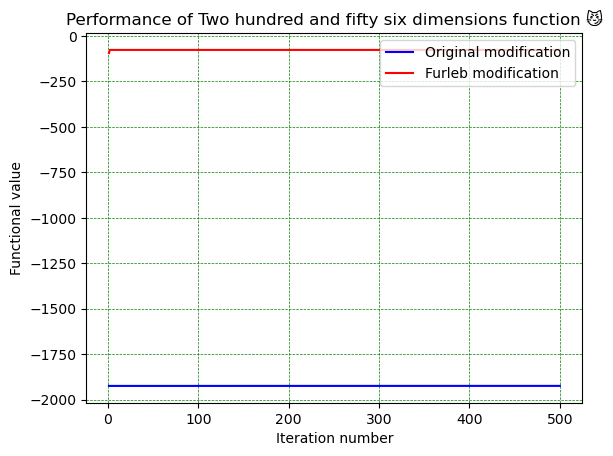

-->Test number 8
Best solution found by original is:  [ 0.54071124  2.46704663  4.8970054   1.90345669 -1.03943131  4.54367259
 -3.10745228 -1.19783531  1.43973537 -3.98538709 -4.36705902 -3.06713884
  0.49818726 -2.65774908  3.21063585 -2.16801376 -1.06488271  4.91171334
  1.0405013   2.78511276  1.84423364 -3.34211853 -2.07156772 -1.44983148
  2.18481457  5.12        0.03290221  0.47666851  3.0621177   0.036926
 -4.22811123  4.18204195  2.59507657 -3.12781909 -1.56267779 -2.7594509
 -1.77445639  1.22545618  1.01140106  0.69554689  2.63649226  0.66786037
 -1.1820721  -4.27027014  2.45566823  3.35325183  2.34352312  2.85812661
  1.00997658 -2.14485642  2.46568153  3.56100325 -0.35194872 -0.84949862
 -1.55437247  0.43842433  2.19384467 -1.35348954 -3.76790017  5.12
 -0.9263681   4.14763256  1.97286155 -2.23174499 -3.98551825 -3.33951657
  2.37496665  3.26412077  2.83502915 -0.83928819  4.0504057   1.00347284
 -1.72966188 -2.32819823 -2.98161098 -0.42159071 -2.11040762 -0.569459
 -2.4689

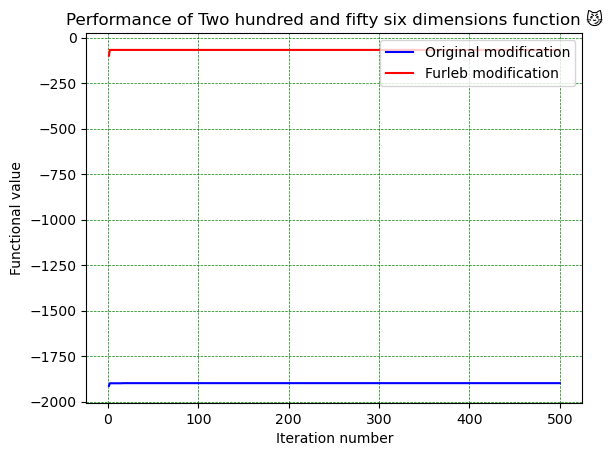

-->Test number 9
Best solution found by original is:  [ 4.74841369  0.93719834  1.60860114 -4.10840798 -1.83305587 -0.60635561
  2.08864105  3.02990228 -2.74583368 -0.07234651  1.83636332  4.69268365
  3.37643971  1.1053554   3.42448364 -4.43814501 -2.35294943  1.64402216
  1.48928234  3.03515033  1.73210438 -2.51334637 -0.08913295  0.24927434
  2.0283278   2.12767049 -1.02730329 -2.29474037 -4.62126405  2.71756272
  2.78957788  1.53180358 -0.45325159  2.56794472 -4.46716173  1.5333275
  1.80630787 -4.38384974 -4.06004943 -0.22414858 -2.1117108   1.73877347
  2.77126337 -0.02866418  2.67464303  2.38317139  1.95607827 -1.27224025
  2.8435551   1.17779609 -1.04704935  4.68373369  2.07793313 -2.2722279
  1.12167083 -4.65179084  4.1266726  -1.14853465 -0.10116151  2.40858663
  4.83366213  2.49653412  0.2291192   0.28780581  0.14385105  3.18804839
 -2.54303912  0.9249501  -1.14798541 -1.98091573 -2.63694158 -1.24463247
 -0.57509075 -3.85900559  4.50254242  3.68485863 -4.20293724 -3.21704394

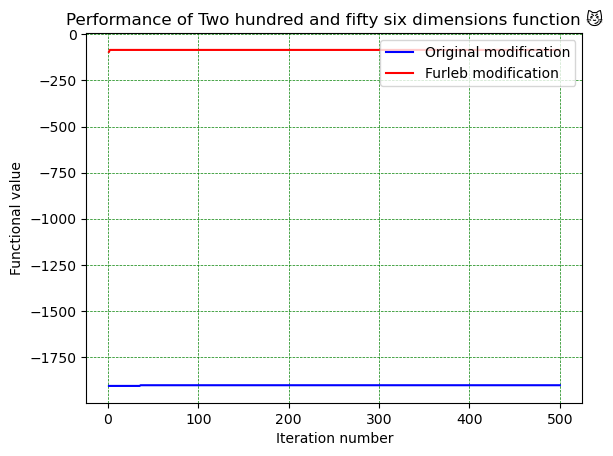

In [67]:
function_name = "Two hundred and fifty six dimensions function 😼"
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    perform_comparsion_test(function_name, a_lot_dimensions, -5.12, 5.12, 100, 500, 0.4, 0.3, 0.5, 256, draw_graph=True)

In [68]:
@jit(nopython=True)
def cos_multi_function(arguments):
    return -1.0 * sum([np.power(arguments[i], 2) - 10.0 * np.cos(2.0 * np.pi * arguments[i]) + 10.0 for i in range(30)])

-->Test number 0
Best solution found by original is:  [-0.05512089 -2.75576718  0.56408843 -0.67895648  1.25022558 -2.11065691
 -0.69695128 -0.63909224  1.23716968  0.16331326 -1.9176305   3.16346088
 -1.14137234  3.94186576  1.04171802  0.15047457  4.91459873  3.03812878
 -0.91099793  2.88543949 -0.88609158 -2.66554139  1.31810886  0.8034359
  2.95473013 -3.40469256  1.19180983 -3.14310149 -0.47517013 -1.82880527]
And function result for this solution is:  -349.3031133053342
Totally elapsed for original  0.2271847  seconds
Best solution found by furleb modification is:  -218.27558511144395
And function result for this solution is:  [ 9.84355582e-01  1.15791901e+00  1.87644723e+00 -5.03638482e-01
  4.98295345e-01  9.18850377e-01  7.45526000e-01  4.46672859e-02
  1.12637686e-01  8.32559069e-01  3.77138050e-01  1.17307812e+00
 -1.85245782e+00  7.30203466e-02 -6.84441954e-01  6.12168706e-01
  9.59866372e-04  9.83188457e-01 -2.24328554e-01  1.03867437e-01
  1.15747580e+00  1.01391563e+00  

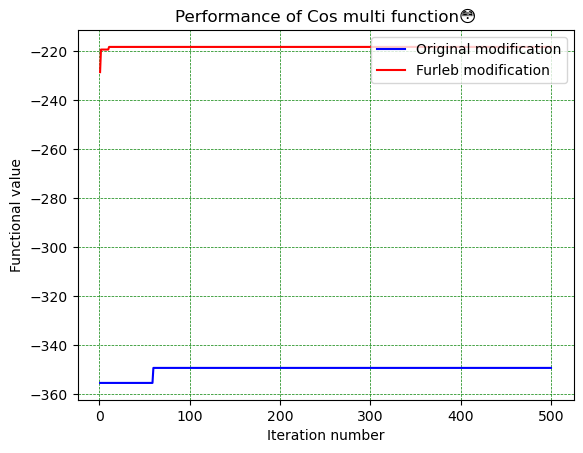

-->Test number 1
Best solution found by original is:  [ 3.07280342 -0.83400248  2.26654677  3.54998541 -0.79972674 -1.07942779
  0.14197106  4.23984514  0.84194451  1.10516351  1.89127445  3.59593195
  0.1618626   5.12        2.33912668 -0.01630605  1.88412355  1.89454066
  0.03159875  1.07831718 -2.05081969  3.77231041  2.05370917 -0.05240913
  0.35173978 -2.89053612 -0.43657961 -1.78748601  5.12        0.25759246]
And function result for this solution is:  -349.19870983121336
Totally elapsed for original  0.3636634  seconds
Best solution found by furleb modification is:  -182.26818766892998
And function result for this solution is:  [ 0.03808073 -0.00367167  0.81529258  1.16903974  0.23521835 -0.75634765
 -0.0507989   0.20597524  0.02624174  0.29624998  0.22502644 -0.69055204
  0.18558642 -0.04684026 -0.01819979  1.09189072 -0.73078237  0.94712114
  0.55074543  0.07815706  0.10361019  0.02135495  0.83189998  0.18719675
 -0.16373806  1.12884727  0.38141426  0.10511317  0.37854175  0.1

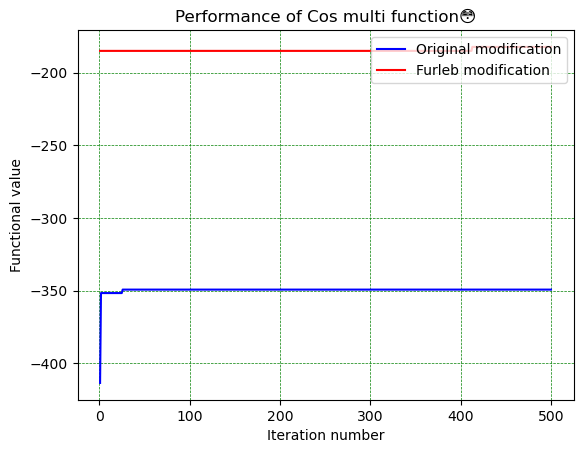

-->Test number 2
Best solution found by original is:  [-2.47559515 -2.89745626  1.01328375  1.92376816  5.12        4.37482705
 -0.0083255  -2.92903751  2.85699857 -1.3403278   0.09033054  2.02916361
  0.06934347 -1.10299027  0.57830803  1.00170711  1.269932    5.12
  1.95027174 -2.64109132  0.06928828  1.08267398  2.75049678 -2.74459544
  2.99633541  5.08731388  0.02937062  2.00338574 -0.70533811  3.9859924 ]
And function result for this solution is:  -354.20952537522373
Totally elapsed for original  0.1934669  seconds
Best solution found by furleb modification is:  -243.64138637141195
And function result for this solution is:  [ 0.43714244  2.21607775 -0.12478407  0.99846744 -3.04471282 -0.0702037
 -0.83238348  0.83740034  0.03586344 -2.6254718   1.67994339 -1.06652626
  1.08945847  1.68838539  1.00543018  0.30850213  0.15059261  0.016056
 -0.81957661  0.09070122  1.22639205 -2.30597176  0.86069059  0.07265664
  1.30322153  0.20558136  0.02484341  1.98461183  0.64725425  0.58029151]


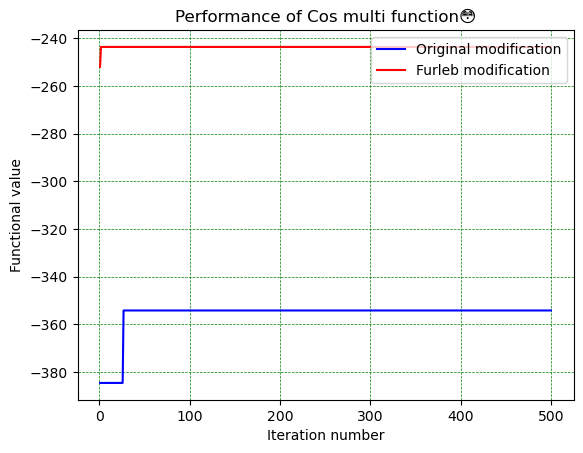

-->Test number 3
Best solution found by original is:  [ 0.11728099 -2.54643905  0.98066963 -1.69866137 -3.75976195 -0.56925914
  2.20910832 -0.8104861  -1.78334597  1.79144324  0.04331897 -2.89959744
  2.64843541 -2.87203816  0.94469733 -1.02653129  2.19541197 -0.8392356
  0.08595685 -4.03421426 -4.28176228  5.11644071  2.12446334  3.1015449
 -1.89856942  1.19992595  1.25383212 -1.43820126  1.50274234  3.23008719]
And function result for this solution is:  -378.69304638374956
Totally elapsed for original  0.1966588  seconds
Best solution found by furleb modification is:  -187.2092365200344
And function result for this solution is:  [-0.55642137 -0.91751257  0.06828486 -1.04758143  0.04479016 -1.15477599
 -0.21571699 -1.21247883 -0.76758695 -0.21759562 -3.11034187  0.17233696
  0.92947146 -2.3538666   0.26236002 -1.05247678  0.06579579 -0.75189392
  0.06232474  0.12978144 -0.14062353 -1.8226473  -0.01597865 -2.02478662
  0.11006812  0.06443859 -1.42627225 -0.82460497  0.09541594  0.1644

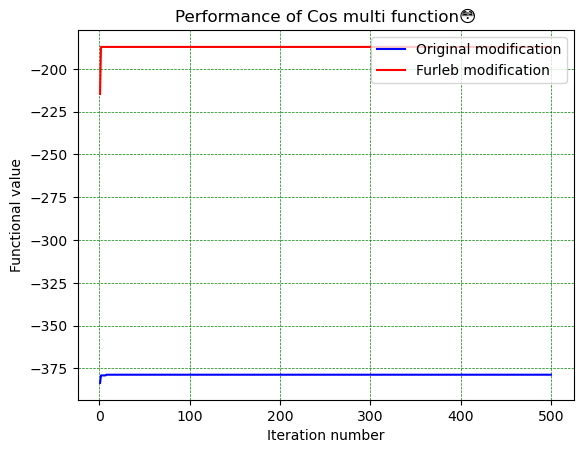

-->Test number 4
Best solution found by original is:  [-0.77380637 -0.04422843 -3.97278415  0.15437919 -2.06599532  4.26162616
 -3.76710209 -0.22103627  5.08281308 -3.46378089 -1.84653236  2.11319582
 -0.92424103 -1.64201502  0.18790043  1.99172699 -0.08361727  1.55594239
 -2.98123202 -0.30901088  2.09192638  0.97251083  3.22070336  0.52413367
  1.07455708  2.92185518  1.24522626 -2.95015964 -1.34861529  4.55913917]
And function result for this solution is:  -381.56400390023333
Totally elapsed for original  0.2813562  seconds
Best solution found by furleb modification is:  -253.7855331105238
And function result for this solution is:  [-1.22679479e+00  1.00028591e+00 -9.01646174e-01 -8.24191935e-01
  1.26678407e-01  3.71442711e-02  2.88012229e-01 -1.08745932e-01
 -1.41130586e+00 -6.15233086e-01  2.76592681e-01 -1.16306938e-01
 -5.51015616e-01  1.80466919e-02  6.14066445e-02 -6.18283793e-01
 -4.83138052e+00 -9.42933415e-01 -3.42275320e-01 -3.93812211e-01
 -1.76782413e+00 -7.89807430e-01 

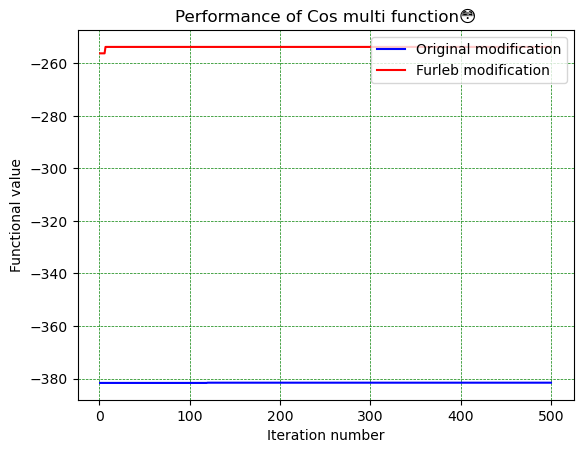

-->Test number 5
Best solution found by original is:  [ 2.826074    5.12       -1.91264936 -1.93396347 -2.10423627  0.19168381
 -2.58204151 -0.91068615  0.14385292  4.15445216 -0.94924051  4.07548362
  0.34921368 -3.60485304  0.96622185 -1.27689177 -1.03870106  5.12
  1.2212627  -1.98066623 -3.24946302 -1.94011239  5.12       -1.77336412
 -3.83294314 -2.89167728 -0.25084681  1.07650297  1.30380509  2.9802534 ]
And function result for this solution is:  -374.8764554236441
Totally elapsed for original  0.2730212  seconds
Best solution found by furleb modification is:  -223.79114211339342
And function result for this solution is:  [ 1.03004988  1.40756694  0.19477992  0.66687013 -0.95122732  0.68294831
  1.26032535  1.1794477   0.91137218  0.87850229  0.07041234  0.17354228
 -0.7999963  -0.72881947  2.09711288  0.91247598  1.29416509  0.47922037
  0.90301603  0.07195025  1.03400064  0.78984902 -1.00323715  0.74953785
  1.08526269 -1.98800392  0.15900706 -1.57630154  0.94942678  0.27328956

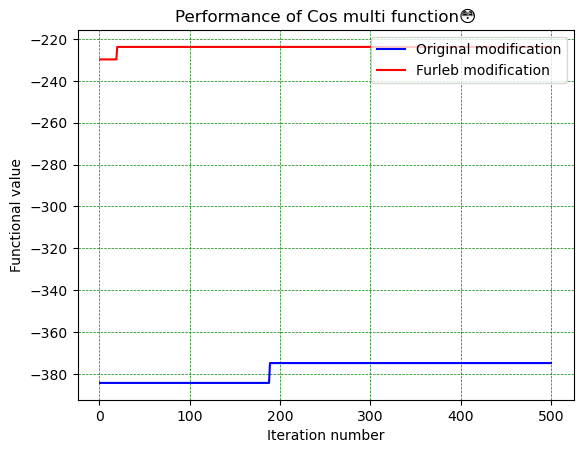

-->Test number 6
Best solution found by original is:  [-3.61113954e-01  4.92806165e+00  2.70993577e-01 -8.99515288e-01
 -3.04010771e+00 -3.96076113e+00 -2.02864357e+00  1.19617634e+00
  1.10561373e+00  1.25433488e+00 -8.00402427e-01  4.09662006e+00
  1.16385897e+00 -1.26660347e+00 -7.90750813e-01 -2.83035473e+00
  5.12000000e+00  1.08447552e+00  1.14327885e+00  3.56469739e-01
 -3.85913355e+00 -2.10182145e+00  2.42235573e-03 -1.88193697e+00
  4.42600419e-01 -1.66088859e+00  3.23713961e+00  4.18436828e+00
  2.01978549e+00  2.95064313e+00]
And function result for this solution is:  -353.4726929970563
Totally elapsed for original  0.2076797  seconds
Best solution found by furleb modification is:  -242.69705483428842
And function result for this solution is:  [ 3.56549938e-03  2.00374434e-01  9.33798442e-01  1.34047483e-01
 -1.05058554e-02  4.97801784e-01 -4.29165569e+00  8.19701106e-01
 -1.28599005e-01  3.57659703e-01 -3.82435923e-02  3.24944662e-01
 -7.73203299e-01 -3.69297685e-01 -8.8088

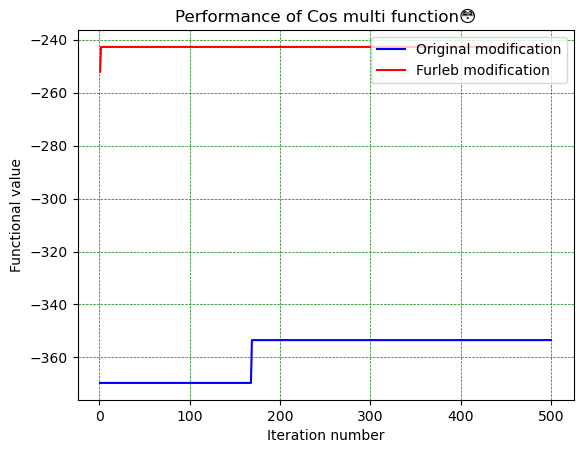

-->Test number 7
Best solution found by original is:  [-0.84676855  4.058966   -3.4314186   1.58574369 -0.78158199  2.0444739
 -0.63772551 -0.79208887  3.17930311 -0.7014694   1.08315619 -3.08103297
 -2.0187767   0.31041152 -0.18393787 -0.1487659   0.07540126 -0.29953429
 -0.84228438  4.81209226 -2.89014386  1.27337346  3.09235512 -3.06169373
  1.84352257  4.180874   -1.2257116   5.12       -2.68201499 -2.07616521]
And function result for this solution is:  -373.51963610602024
Totally elapsed for original  0.3108396  seconds
Best solution found by furleb modification is:  -199.55356064333344
And function result for this solution is:  [-1.0797864   0.09896345 -1.02667915  0.263412    0.98558879  1.23110904
  1.18537659  0.12488625 -1.01188788  0.73894602  1.2376831   1.7410032
  0.95933882 -1.84819891 -0.04689381  0.13566655  1.24464416  0.22200136
  0.02433719  0.23497448 -0.19699999  1.3493364  -0.08170168 -3.57455848
  1.08291014 -1.05513223  0.14411689  0.26916775  1.16055647 -0.051

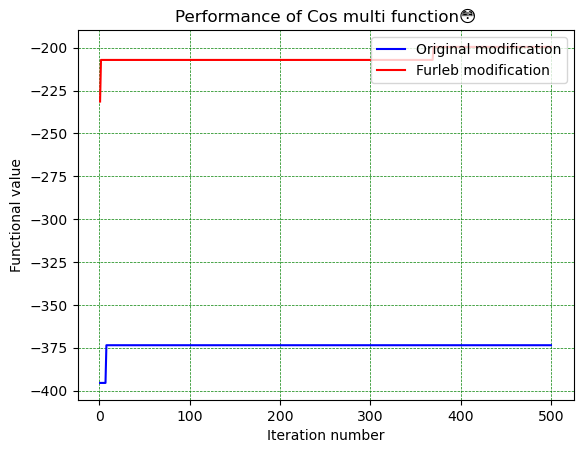

-->Test number 8
Best solution found by original is:  [ 1.90797668 -3.00905978  2.53842437 -1.55960713 -2.03757793 -2.82739945
  0.16159209  2.89787614  3.44034298 -0.89170141  1.66204684  2.11483106
 -0.71129313 -0.67399794  0.71726498 -1.98256895  3.02543087 -0.91805122
  0.00699961  1.17107833 -1.68842806 -0.66144818  0.9214339   0.17158408
  0.53421011 -1.85925945  0.30580085  3.87318813 -3.88419807  5.12      ]
And function result for this solution is:  -361.75496904364974
Totally elapsed for original  0.3024991  seconds
Best solution found by furleb modification is:  -234.44696162563415
And function result for this solution is:  [ 0.57614558  0.45090966 -1.48332839 -2.06450378  0.25879942  0.81943264
  0.12573169 -0.81744799  0.29885818  1.12102149 -0.19652019  0.04653065
 -1.06433254  0.11150765  0.20874045  0.96387239  0.3744208   0.78580357
  0.16876173  0.796885   -1.53906897 -0.91635864  0.0346151   0.38483827
 -0.06351974  2.02252321  0.04284812  0.94610202  0.25640141  0.1

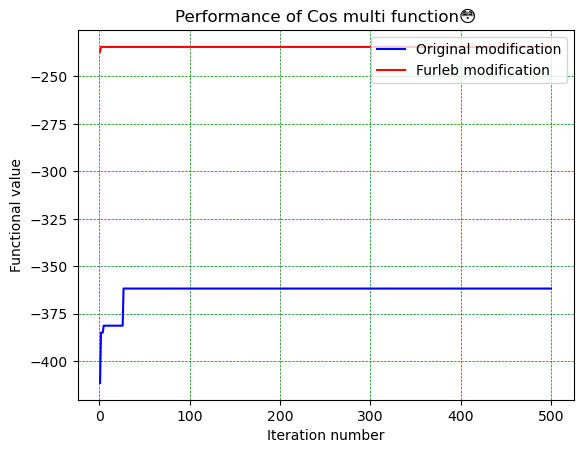

-->Test number 9
Best solution found by original is:  [ 2.35820524 -1.93419465 -0.79260987  4.1986868   0.92360847  4.05409587
 -0.96745528 -0.26525198 -4.62234105  0.25772838 -0.89794891  2.24812732
 -2.94277248 -2.23828112  5.12       -0.12757841 -3.82022363  3.25877713
  0.28552354 -2.7006366  -2.29305432 -0.86650285 -0.21712841  0.9043213
  0.94454558 -3.05109023  0.61556152 -1.89496749  3.87205396  1.54534344]
And function result for this solution is:  -394.03075274062496
Totally elapsed for original  0.1959447  seconds
Best solution found by furleb modification is:  -199.07245034706887
And function result for this solution is:  [-0.66827671  0.2426397  -0.18313402  0.26909881  0.07988938  0.23537314
 -1.13847768 -0.00185198  0.03634803 -0.0354583   0.0392909   0.38331671
  0.97355464 -0.91507024 -0.02973087  0.45672802  0.11403434  0.03689859
 -0.25283197  0.40255814  0.12970775 -0.89759789 -0.88505634  0.05462067
  0.09686684 -1.80580268 -0.4119873   0.076959    0.54641851  1.18

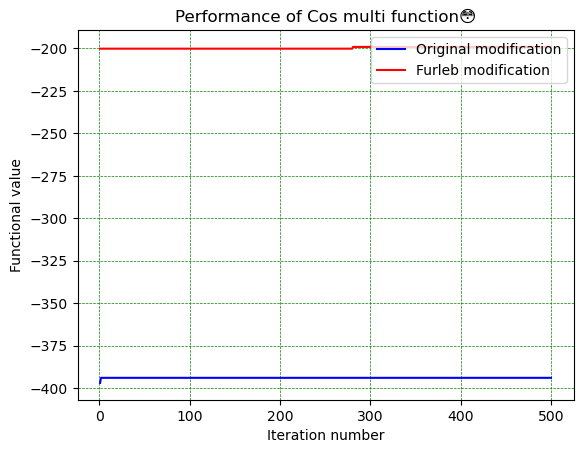

In [70]:
function_name = "Cos multi function😳"
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    perform_comparsion_test(function_name, cos_multi_function, -5.12, 5.12, 100, 500, 0.4, 0.3, 0.5, 30, draw_graph=True)